In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

In [2]:
import pandas as pd
import numpy as np

import missingno as msno

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns

In [3]:
import sys  
sys.path.insert(0, '../src/')

In [4]:
from visualization.plots import plot_univariate_features, kdeplot_univariate_features, kdeplot_univariate_features_shared, boxplot_univariate_features, correlation_matrix_heatmap, plot_variables_evolution, plot_features_kde_grid, boxplot_features_by_hour, plot_features_boxplot_grid
from visualization.util import get_nans_percent_per_hour, get_n_most_correlated_features, get_most_correlated_features, get_nans_percent_per_variables_pairs, get_sum_grouped_by_chart_time, get_first_inflammation_appearance_entry, normalize, get_controls_cases_ratio_per_hour, get_bars_midde_top_points, remove_outliers, replace_outliers

# Series temporales de las constantes vitales y valores de laboratorios

In [5]:
full_labvitals = pd.read_csv('../output/full_labvitals_horizon_0_dropped_short.csv')
full_labvitals

,label,icustay_id,subject_id,chart_time,inflammation_target,sysbp,diabp,meanbp,resprate,heartrate,...,ck_mb,fibrinogen,ldh,magnesium,calcium_free,po2_bloodgas,ph_bloodgas,pco2_bloodgas,so2_bloodgas,troponin_t
0,1,200087,61871,0.103056,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,200087,61871,0.153056,0,NaN,NaN,NaN,27.0,135.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1,200087,61871,0.369722,0,129.0,74.0,81.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1,200087,61871,0.536389,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1,200087,61871,0.669722,0,116.0,76.0,84.0,26.0,138.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180443,0,299949,53283,10.287500,0,NaN,NaN,NaN,16.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
180444,0,299949,53283,10.587500,0,149.0,61.0,84.0,13.0,66.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
180445,0,299949,53283,10.787500,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
180446,0,299949,53283,11.287500,0,158.0,69.0,97.0,17.0,66.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
full_labvitals.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180448 entries, 0 to 180447
Data columns (total 49 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   label             180448 non-null  int64  
 1   icustay_id        180448 non-null  int64  
 2   subject_id        180448 non-null  int64  
 3   chart_time        180448 non-null  float64
 4   inflammation_target     180448 non-null  int64  
 5   sysbp             100522 non-null  float64
 6   diabp             100493 non-null  float64
 7   meanbp            100496 non-null  float64
 8   resprate          113703 non-null  float64
 9   heartrate         113484 non-null  float64
 10  spo2_pulsoxy      110068 non-null  float64
 11  tempc             29081 non-null   float64
 12  cardiacoutput     5378 non-null    float64
 13  tvset             8710 non-null    float64
 14  tvobserved        9838 non-null    float64
 15  tvspontaneous     3214 non-null    float64
 16  peakinsppressu

In [7]:
full_labvitals.describe()

,label,icustay_id,subject_id,chart_time,inflammation_target,sysbp,diabp,meanbp,resprate,heartrate,...,ck_mb,fibrinogen,ldh,magnesium,calcium_free,po2_bloodgas,ph_bloodgas,pco2_bloodgas,so2_bloodgas,troponin_t
count,180448.000000,180448.000000,180448.000000,180448.000000,180448.000000,100522.000000,100493.000000,100496.000000,113703.000000,113484.000000,...,2050.000000,1181.000000,1276.000000,6831.000000,4734.000000,8822.000000,9275.000000,8823.000000,2866.000000,1630.000000
mean,0.115208,249381.653662,62433.072968,9.062599,0.000687,119.276659,62.902875,78.374438,18.690858,85.405380,...,19.778000,253.479255,540.818966,2.003352,1.136996,186.992632,7.360919,42.425366,88.326413,0.698362
std,0.319273,29019.630222,23575.414446,14.000667,0.026205,23.473142,15.368169,17.057233,5.438100,19.313855,...,43.520678,149.861339,1044.615417,0.564734,0.142549,117.993431,0.093009,10.849586,14.553289,1.771924
min,0.000000,200021.000000,109.000000,0.000000,0.000000,10.000000,9.000000,1.000000,1.000000,1.000000,...,1.000000,35.000000,65.000000,0.300000,0.450000,16.000000,6.610000,10.000000,4.500000,0.010000
25%,0.000000,224301.000000,47419.000000,2.610556,0.000000,103.000000,52.000000,67.000000,15.000000,72.000000,...,3.000000,161.000000,193.750000,1.800000,1.070000,95.000000,7.320000,36.000000,81.000000,0.040000
50%,0.000000,249292.000000,64761.000000,5.790000,0.000000,117.000000,61.000000,77.000000,18.000000,83.000000,...,6.000000,212.000000,266.000000,2.000000,1.130000,149.000000,7.370000,41.000000,96.000000,0.120000
75%,0.000000,274463.000000,81179.000000,10.103611,0.000000,134.000000,72.000000,88.000000,22.000000,97.000000,...,14.000000,297.000000,392.250000,2.200000,1.200000,264.000000,7.420000,47.000000,98.000000,0.500000
max,1.000000,299956.000000,99982.000000,172.868056,1.000000,273.000000,261.000000,299.000000,68.000000,222.000000,...,450.000000,1167.000000,9920.000000,33.500000,3.030000,691.000000,7.780000,159.000000,100.000000,22.700000


In [8]:
vitals_features = ['sysbp', 'diabp', 'meanbp', 'resprate', 'heartrate',
       'spo2_pulsoxy', 'tempc', 'cardiacoutput', 'tvset', 'tvobserved',
       'tvspontaneous', 'peakinsppressure', 'totalpeeplevel', 'o2flow',
       'fio2']
labs_features = ['albumin', 'bands', 'bicarbonate', 'bilirubin',
       'creatinine', 'chloride', 'glucose', 'hematocrit', 'hemoglobin',
       'lactate', 'platelet', 'potassium', 'ptt', 'inr', 'pt', 'sodium',
       'bun', 'wbc', 'creatinekinase', 'ck_mb', 'fibrinogen', 'ldh',
       'magnesium', 'calcium_free', 'po2_bloodgas', 'ph_bloodgas',
       'pco2_bloodgas', 'so2_bloodgas', 'troponin_t']
all_features = vitals_features + labs_features

In [9]:
labvitals = full_labvitals[all_features]

In [10]:
controls_indexes = full_labvitals.groupby('icustay_id').filter(lambda x: x['label'].sum()==0).index
cases_indexes = full_labvitals.groupby('icustay_id').filter(lambda x: x['label'].sum()!=0).index

controls_full_labvitals = full_labvitals.iloc[controls_indexes]
cases_full_labvitals = full_labvitals.iloc[cases_indexes]

# Missing values

Dada la naturaleza de los datos, el problema de los missing values es algo presente y de lo que debemos tener conciencia a la hora de examinar el modelo resultante de los mismos y tomar decisiones con respecto al conjunto de datos de entrenamiento.

In [11]:
controls_labvitals = controls_full_labvitals[all_features]
cases_labvitals = cases_full_labvitals[all_features]

- Conjunto completo

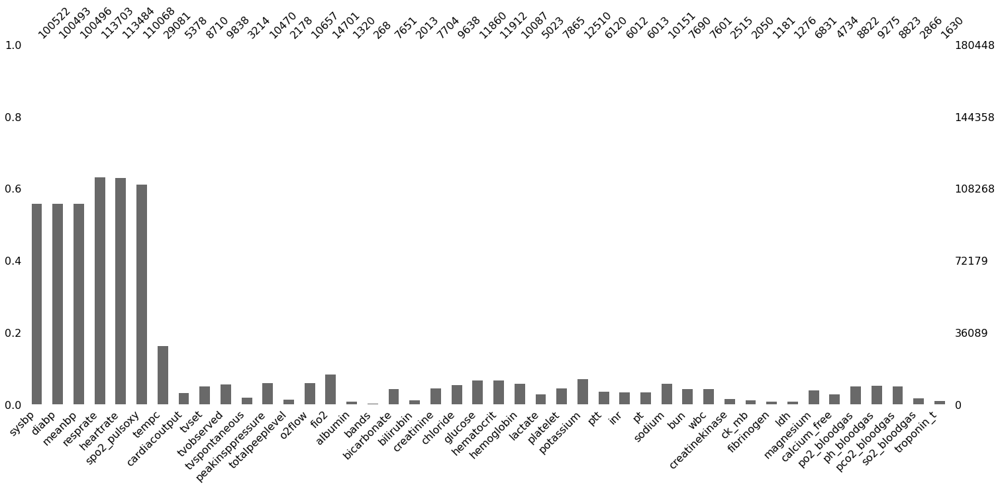

In [20]:
msno.bar(labvitals)
plt.savefig('images/msno_lab_vitals.png', bbox_inches='tight')
plt.show()

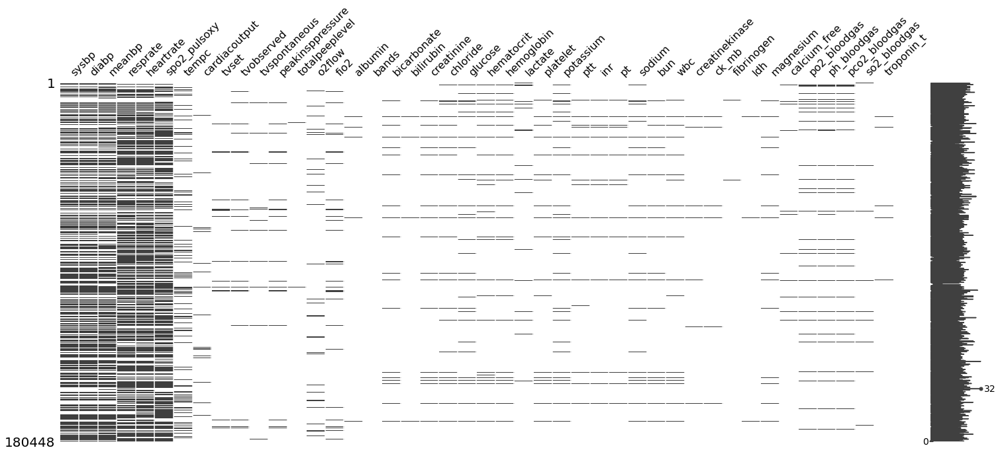

In [41]:
msno.matrix(labvitals)
plt.show()

- Casos de control:

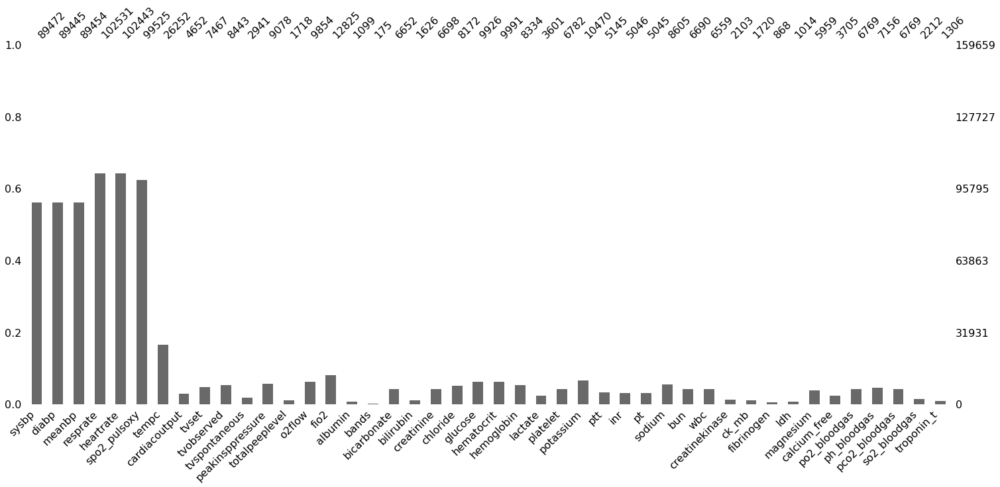

In [43]:
msno.bar(controls_labvitals)
plt.show()

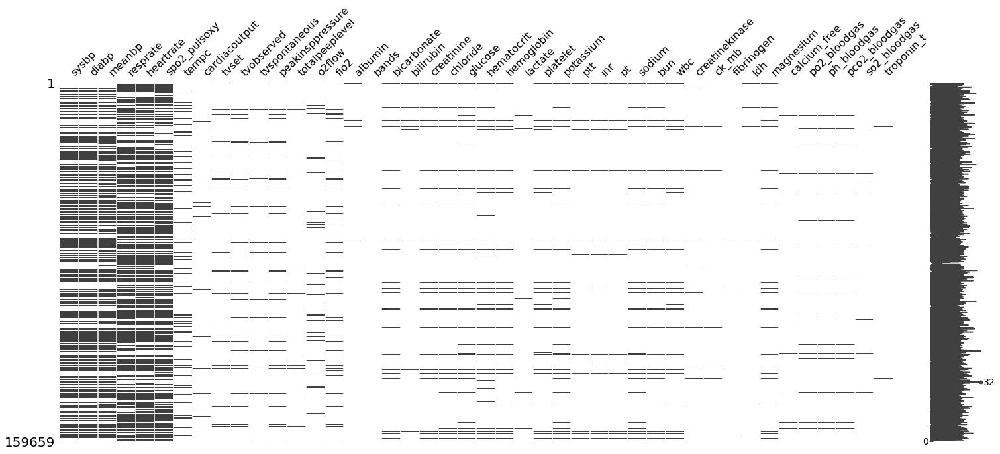

In [44]:
msno.matrix(controls_labvitals)
plt.show()

- Casos de inflammation:

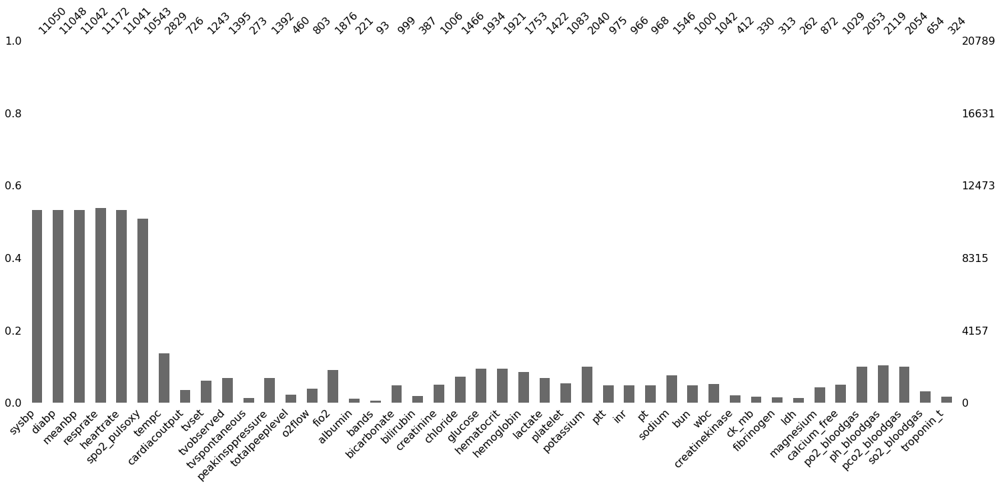

In [46]:
msno.bar(cases_labvitals)
plt.show()

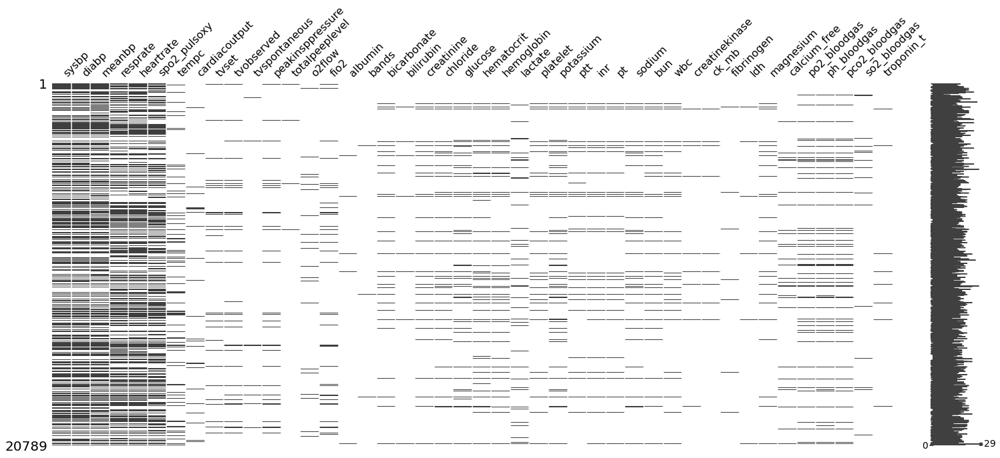

In [47]:
msno.matrix(cases_labvitals)
plt.show()

### Porcentaje de missing values por columna por hora

In [12]:
rounded_chart_time = full_labvitals.copy()
rounded_chart_time['chart_time'] = rounded_chart_time['chart_time'].astype('int64')

In [13]:
features_nans_per_hour = get_nans_percent_per_hour(rounded_chart_time, all_features)

In [14]:
features_nans_per_hour

,sysbp,diabp,meanbp,resprate,heartrate,spo2_pulsoxy,tempc,cardiacoutput,tvset,tvobserved,...,ck_mb,fibrinogen,ldh,magnesium,calcium_free,po2_bloodgas,ph_bloodgas,pco2_bloodgas,so2_bloodgas,troponin_t
0,63.623198,63.623198,63.585417,54.606133,55.657704,58.377936,86.304389,99.710346,95.844090,96.051886,...,98.797305,98.696556,98.885461,96.001511,96.517852,93.117562,92.884579,93.117562,98.992507,98.992507
1,58.015145,58.009812,57.956485,47.461604,48.496160,51.055887,86.737415,98.965444,95.328498,95.664462,...,98.816126,99.136092,99.216084,96.581698,96.901664,94.448592,94.299275,94.448592,99.034770,99.114761
2,50.406751,50.418893,50.576736,40.802574,41.112190,43.079165,86.795775,98.002671,94.912579,95.349684,...,98.882953,99.198640,99.271491,96.612433,96.909908,94.099077,93.941234,94.099077,98.652258,99.156144
3,44.814315,44.827819,44.767049,37.029034,37.089804,38.352465,85.037137,96.948008,95.010128,94.645510,...,98.946658,99.270763,99.284267,96.914247,97.299122,94.672519,94.469953,94.672519,98.433491,99.270763
4,40.739118,40.753725,40.899796,33.559743,33.698510,35.458662,82.960853,95.997663,94.106047,93.514461,...,98.794917,99.203915,99.313468,96.516214,97.115104,94.624598,94.412796,94.624598,98.122992,99.145486
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
168,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,90.000000,100.000000,100.000000,100.000000,...,100.000000,100.000000,100.000000,100.000000,100.000000,90.000000,90.000000,90.000000,100.000000,100.000000
169,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,100.000000,100.000000,100.000000,75.000000,...,100.000000,100.000000,100.000000,100.000000,100.000000,50.000000,50.000000,50.000000,100.000000,100.000000
170,80.000000,80.000000,80.000000,60.000000,60.000000,60.000000,100.000000,100.000000,100.000000,100.000000,...,100.000000,80.000000,100.000000,100.000000,60.000000,60.000000,60.000000,60.000000,80.000000,100.000000
171,55.555556,55.555556,55.555556,44.444444,55.555556,55.555556,77.777778,66.666667,77.777778,77.777778,...,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000


sysbp


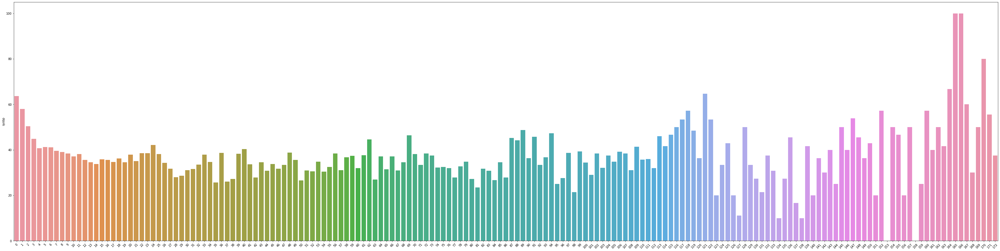

diabp


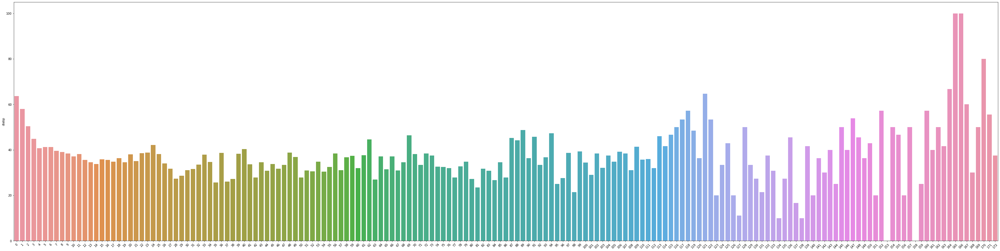

meanbp


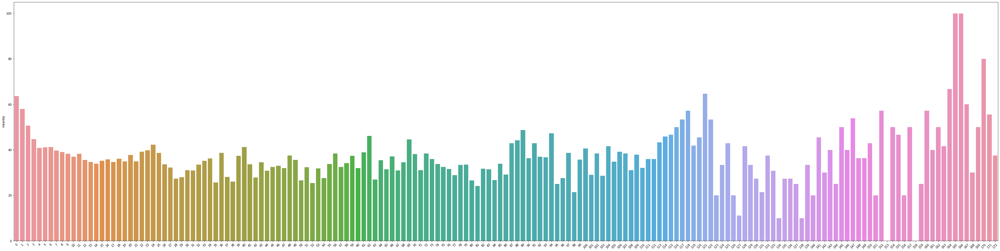

resprate


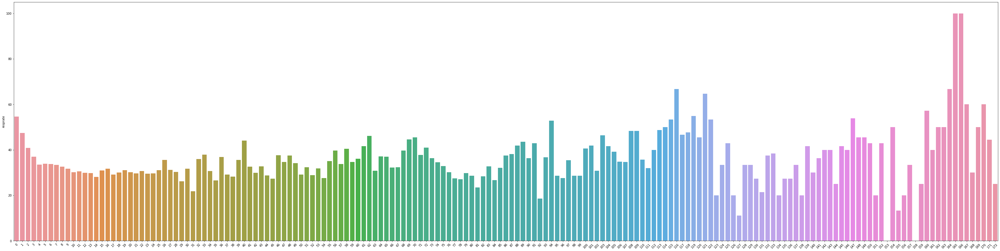

heartrate


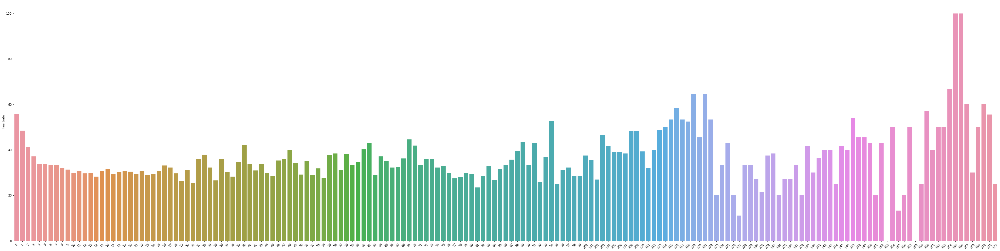

spo2_pulsoxy


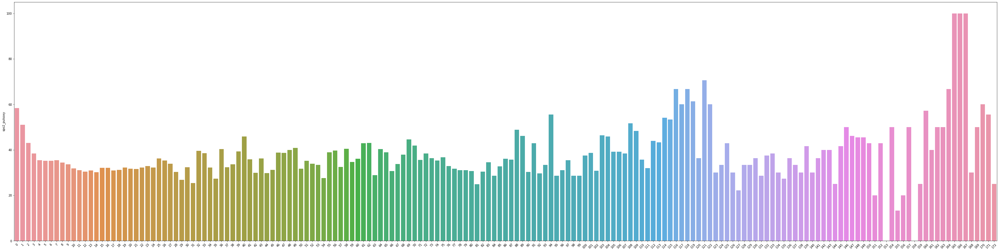

tempc


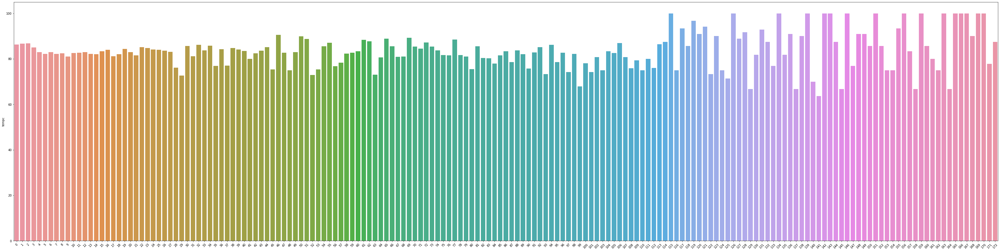

cardiacoutput


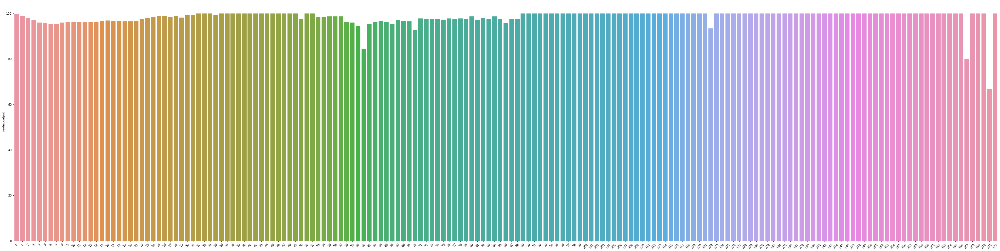

tvset


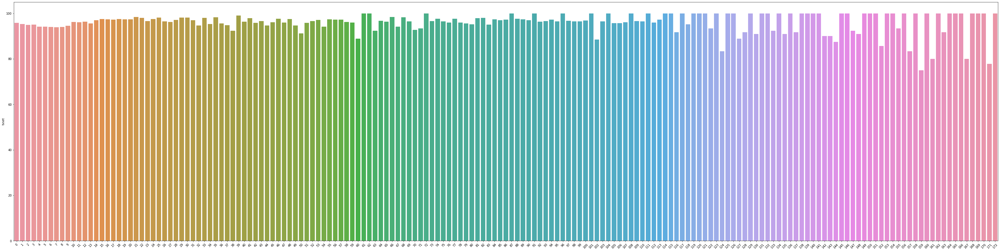

tvobserved


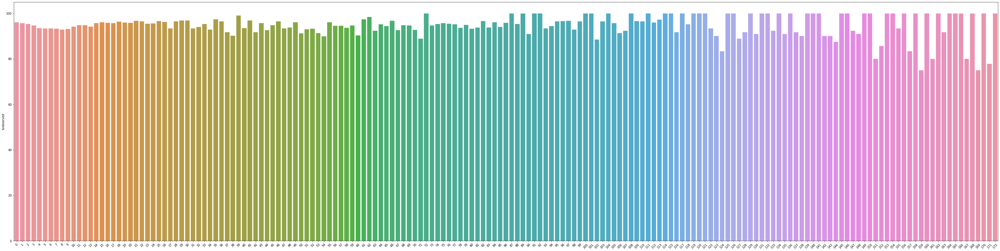

tvspontaneous


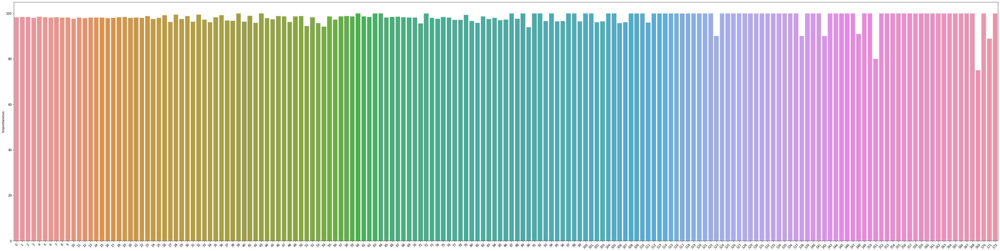

peakinsppressure


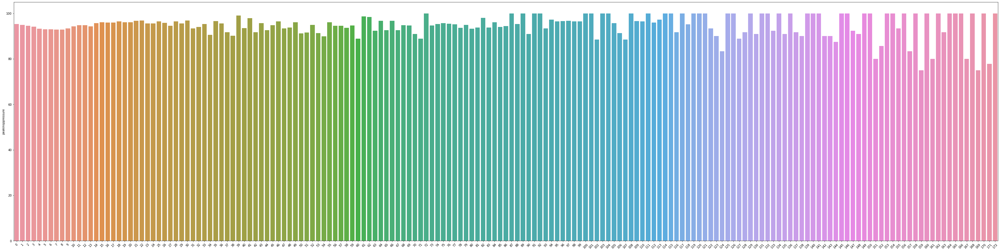

totalpeeplevel


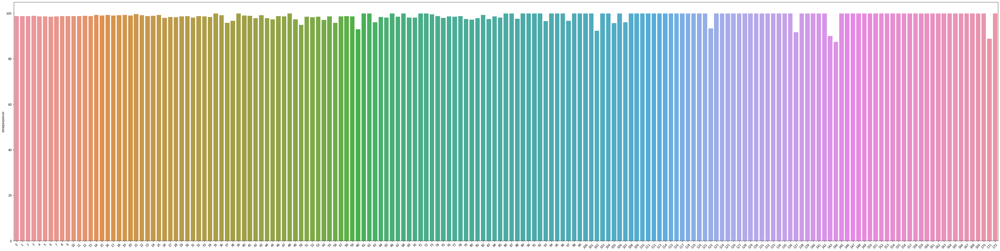

o2flow


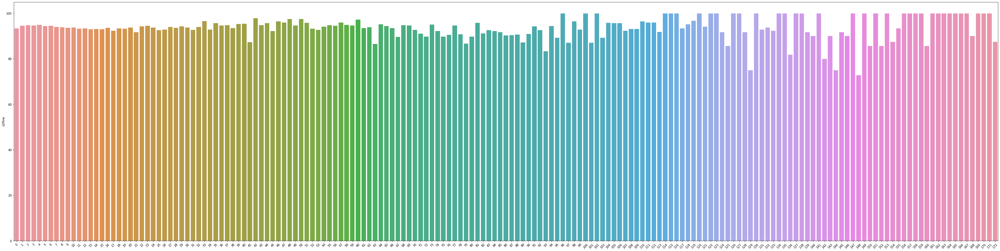

fio2


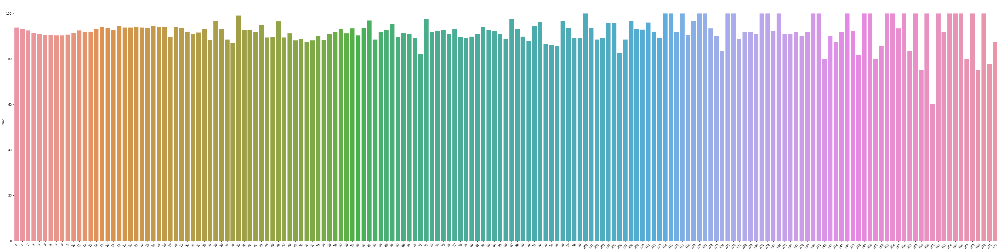

albumin


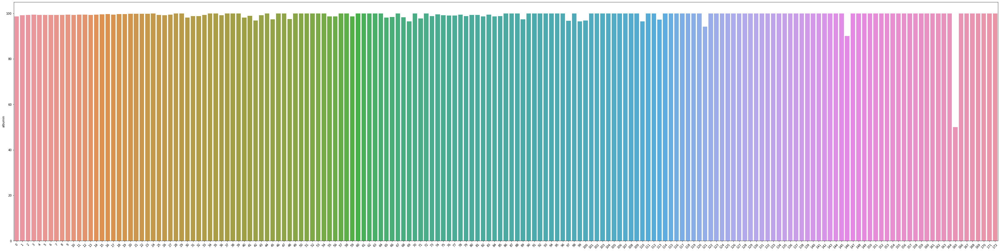

bands


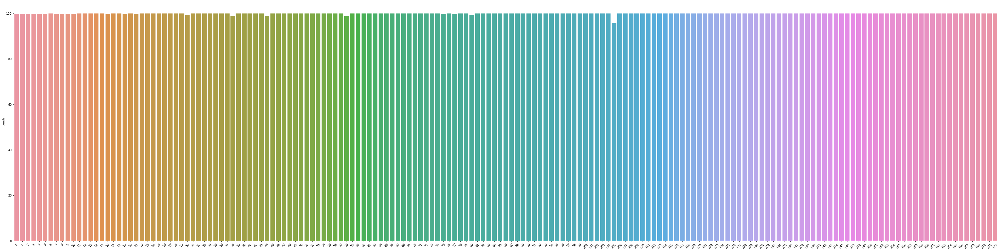

bicarbonate


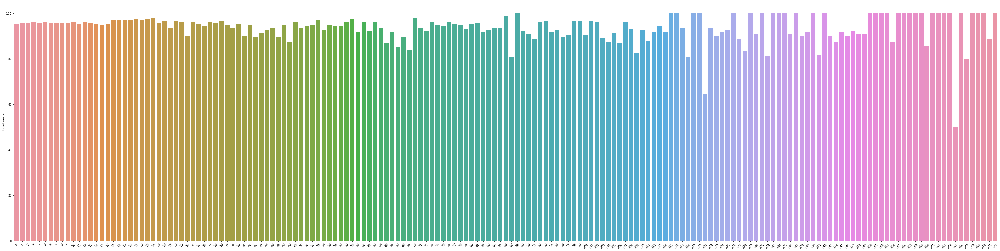

bilirubin


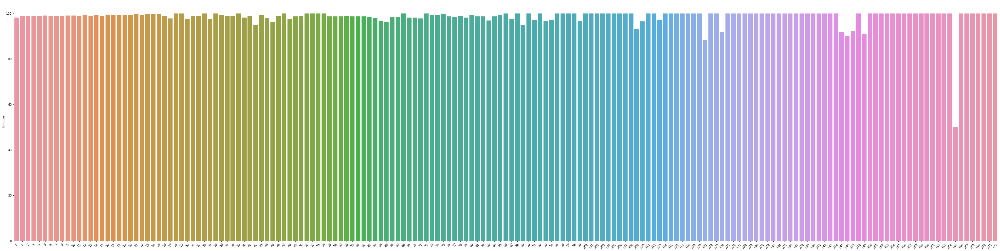

creatinine


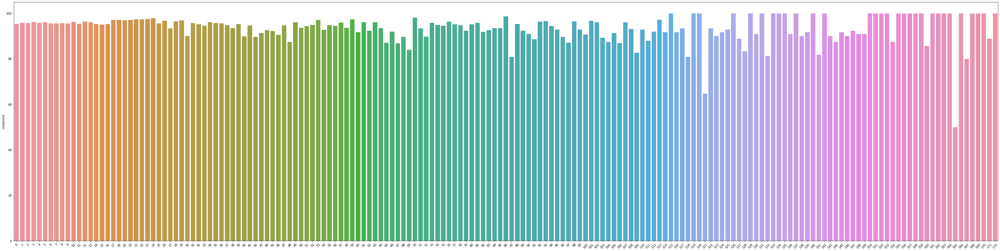

chloride


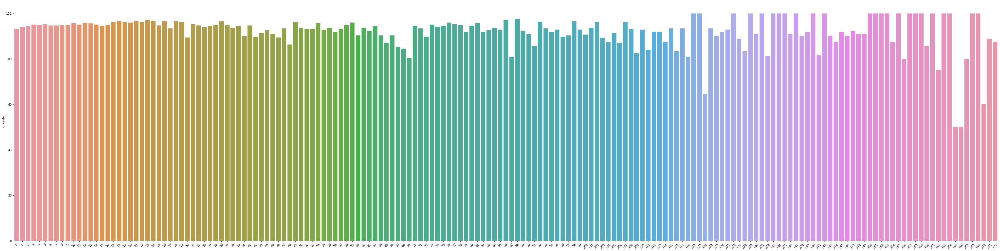

glucose


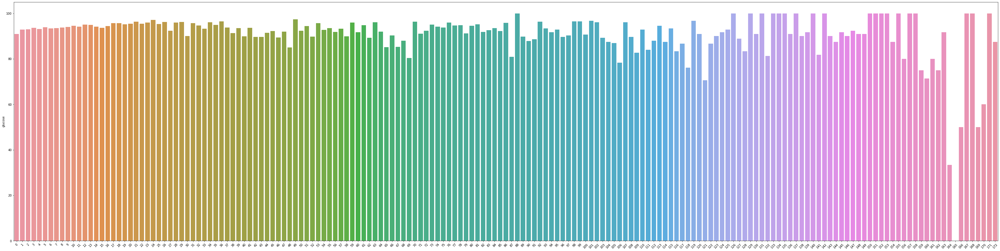

hematocrit


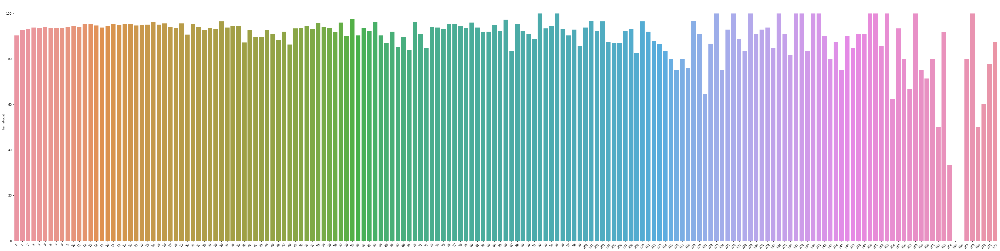

hemoglobin


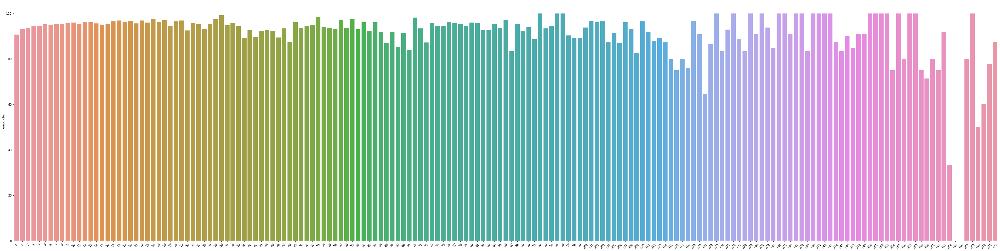

lactate


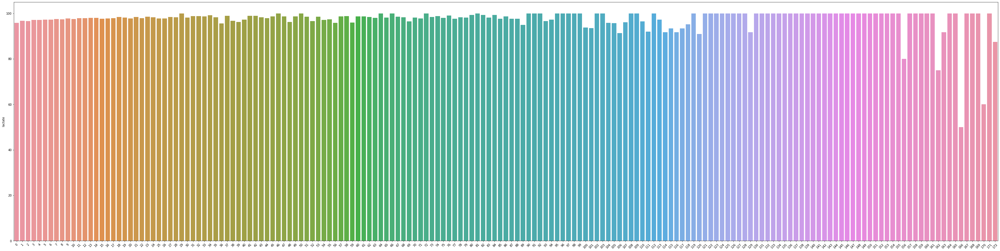

platelet


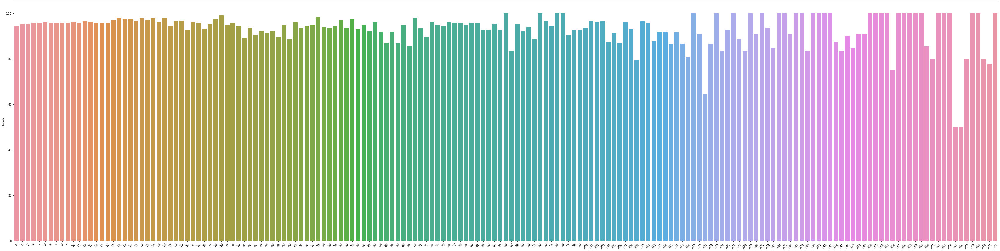

potassium


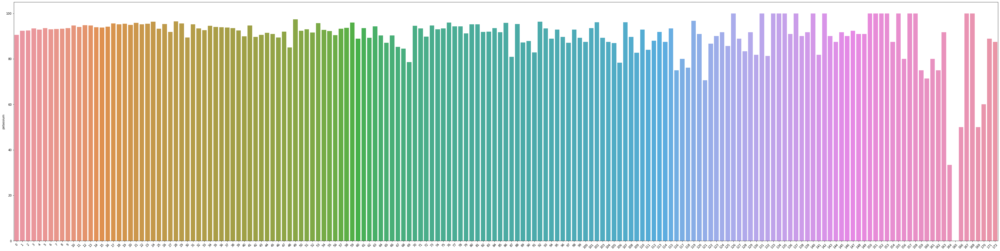

ptt


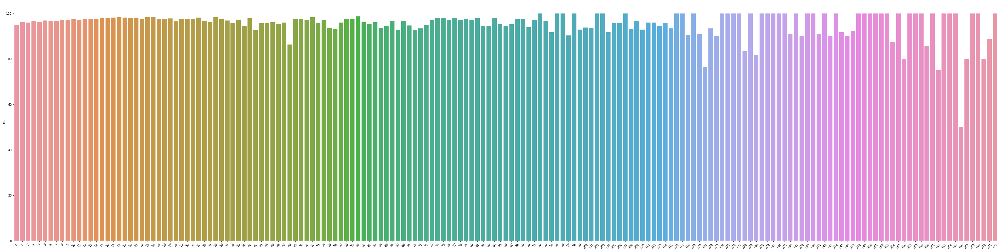

inr


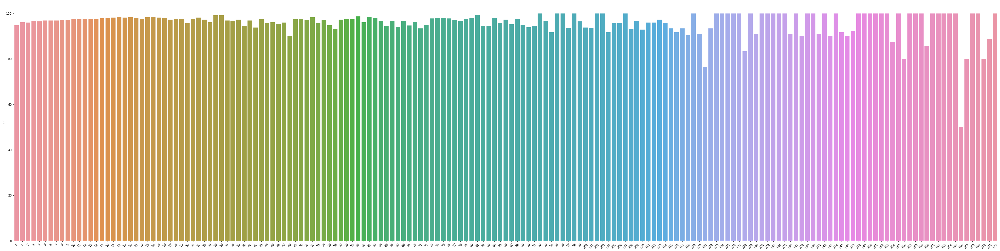

pt


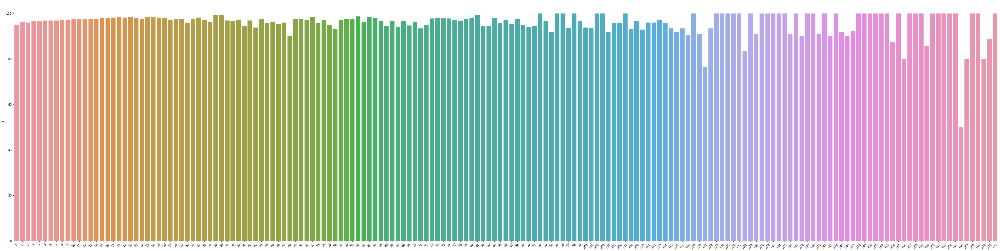

sodium


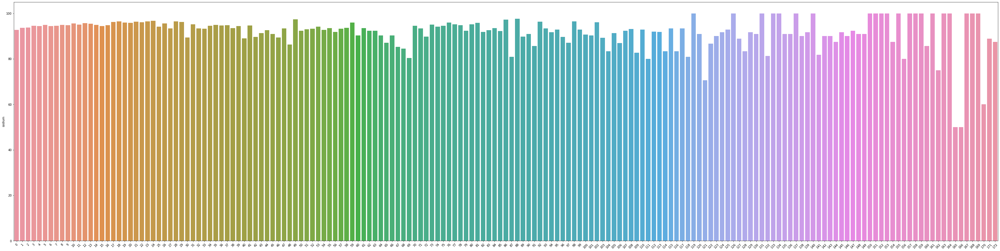

bun


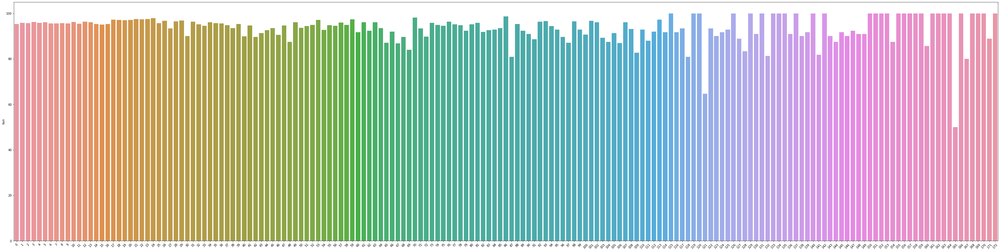

wbc


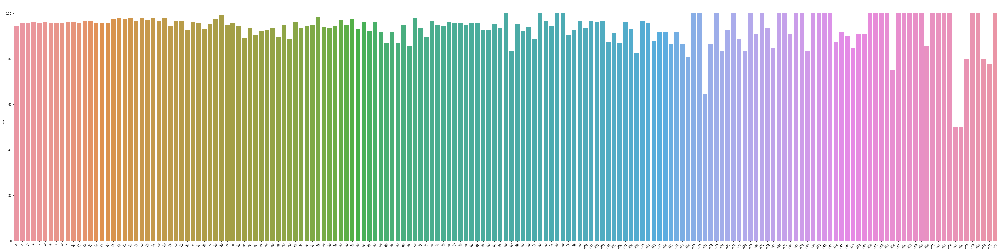

creatinekinase


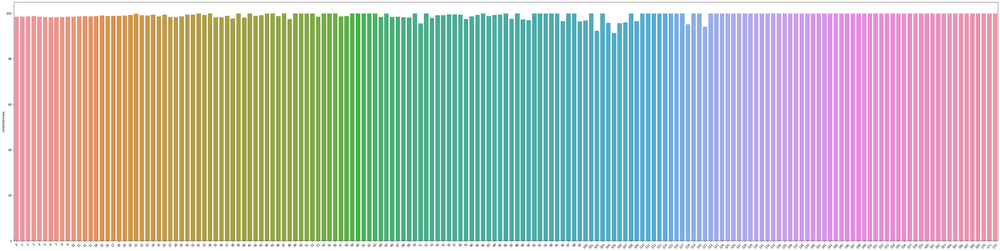

ck_mb


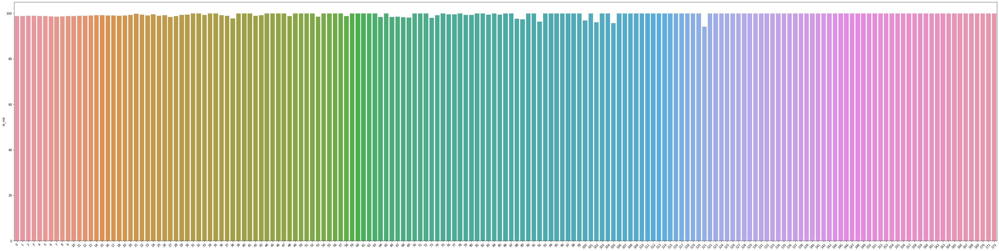

fibrinogen


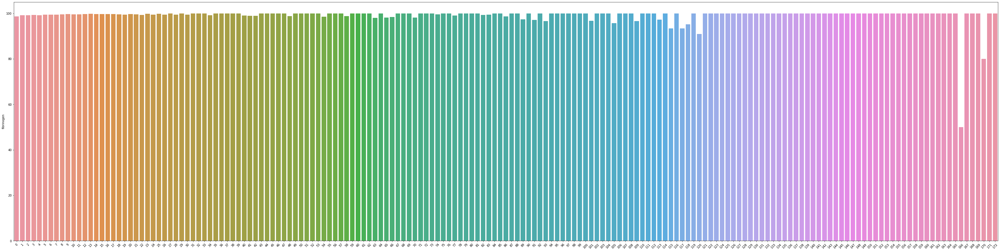

ldh


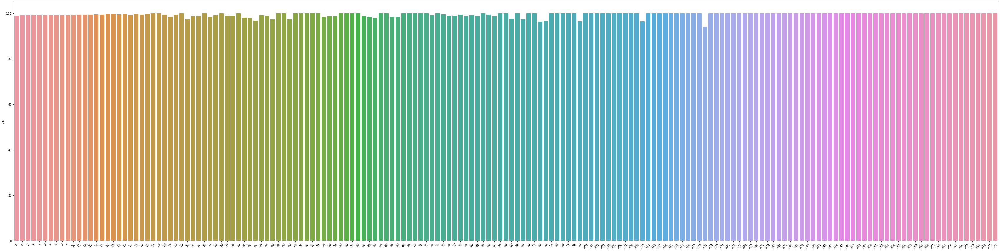

magnesium


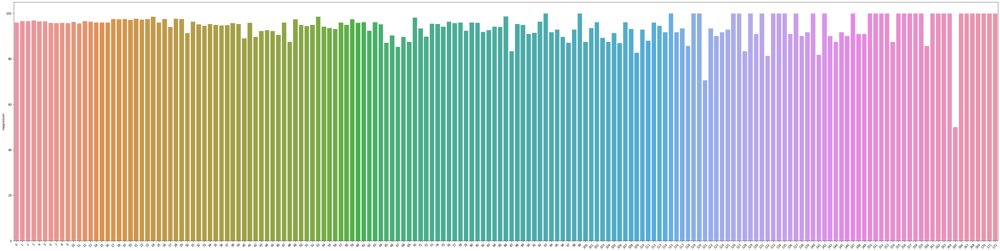

calcium_free


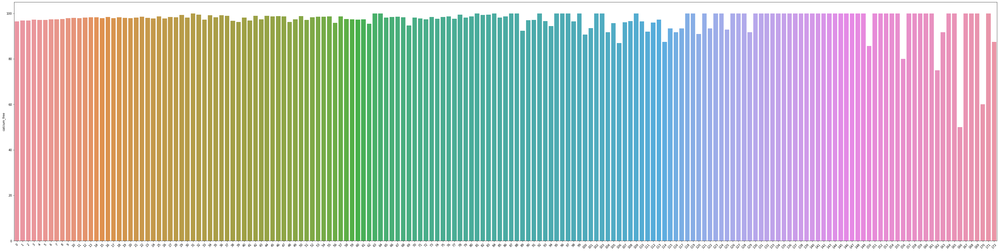

po2_bloodgas


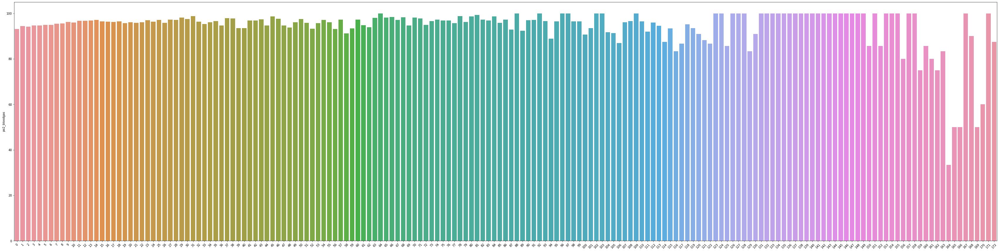

ph_bloodgas


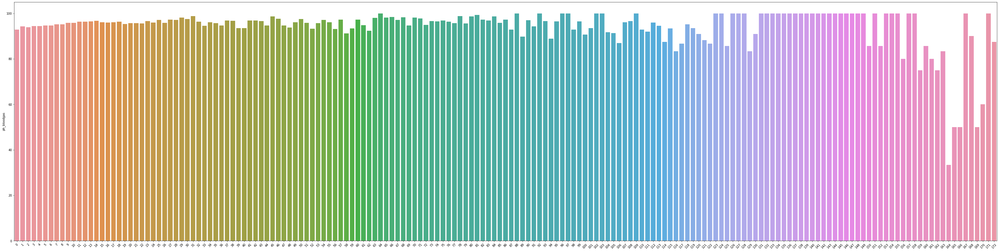

pco2_bloodgas


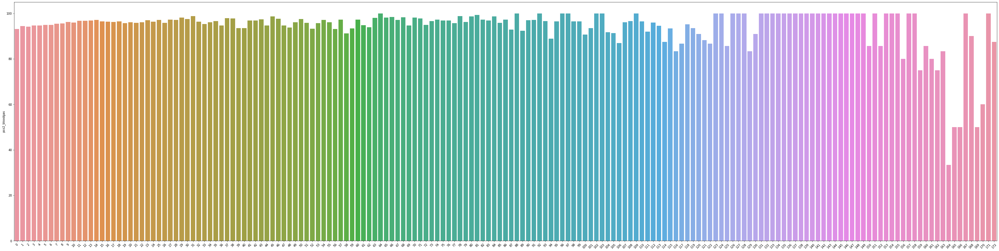

so2_bloodgas


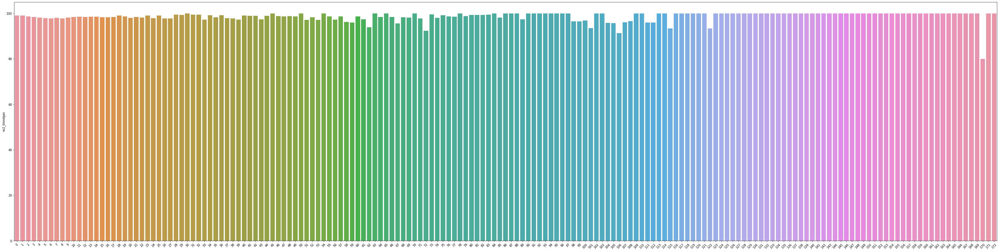

troponin_t


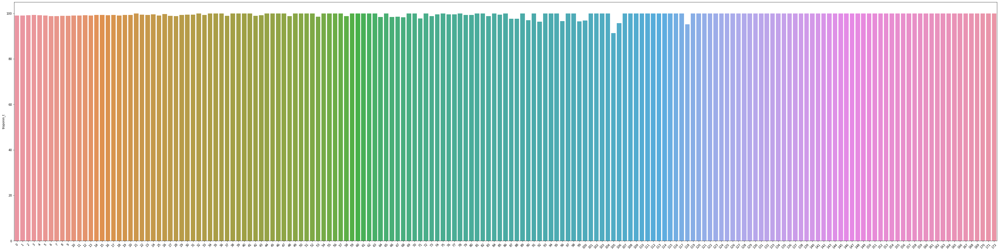

In [15]:
for col in features_nans_per_hour.columns:
    print(col)
    fig = plt.figure(figsize=(60,15))
    sns.barplot(x=features_nans_per_hour.index, y=col, data=features_nans_per_hour)
    plt.title('')
    plt.xticks(rotation=45)
    plt.show()
    fig.clf()

## Serie para las variables

label


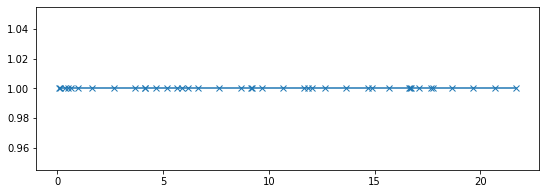

sysbp


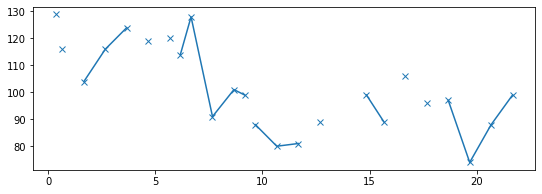

diabp


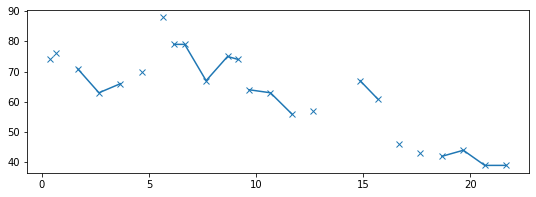

meanbp


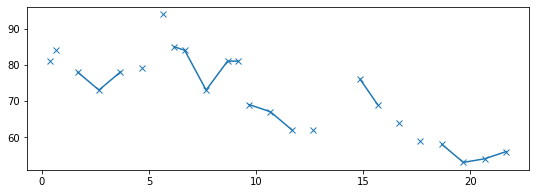

resprate


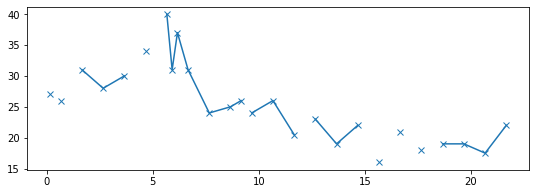

heartrate


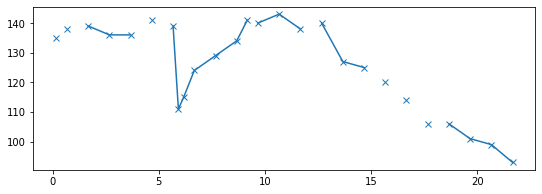

spo2_pulsoxy


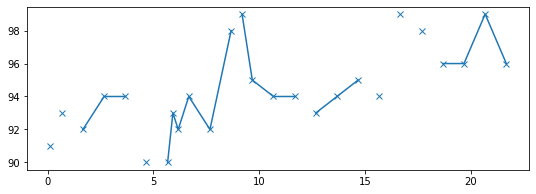

tempc


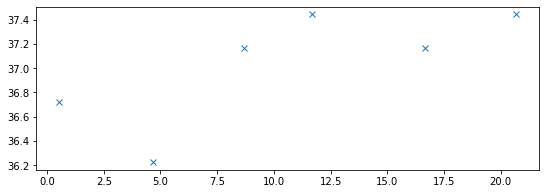

cardiacoutput


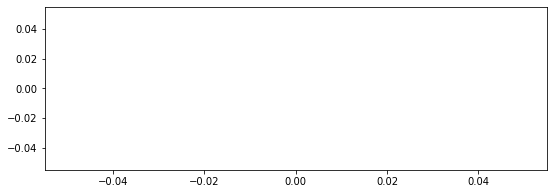

tvset


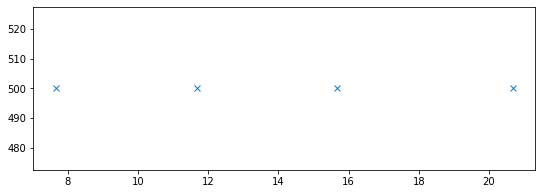

tvobserved


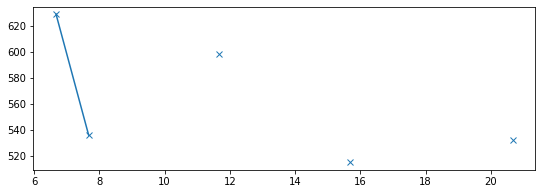

tvspontaneous


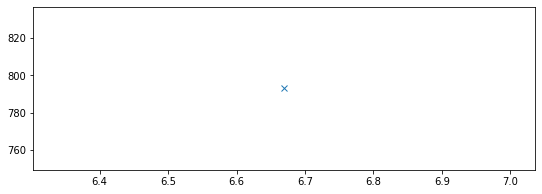

peakinsppressure


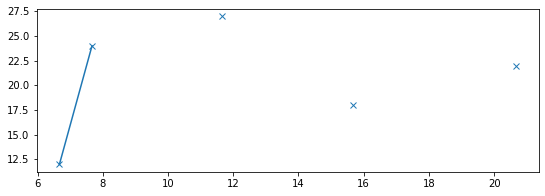

totalpeeplevel


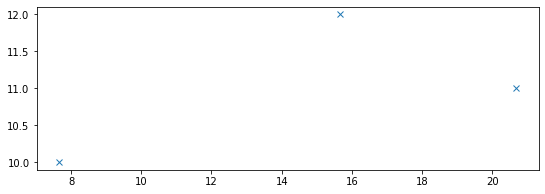

o2flow


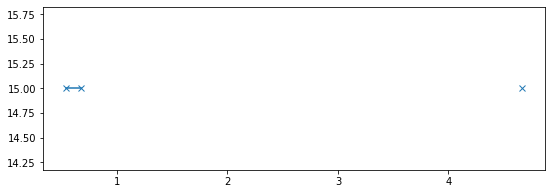

fio2


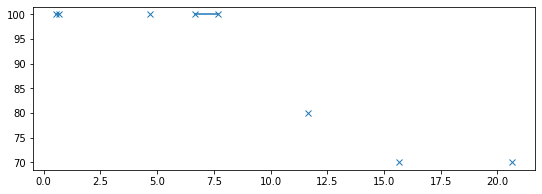

In [16]:
plot_univariate_features(full_labvitals[full_labvitals['icustay_id']==200087], ['label'] + vitals_features, '')

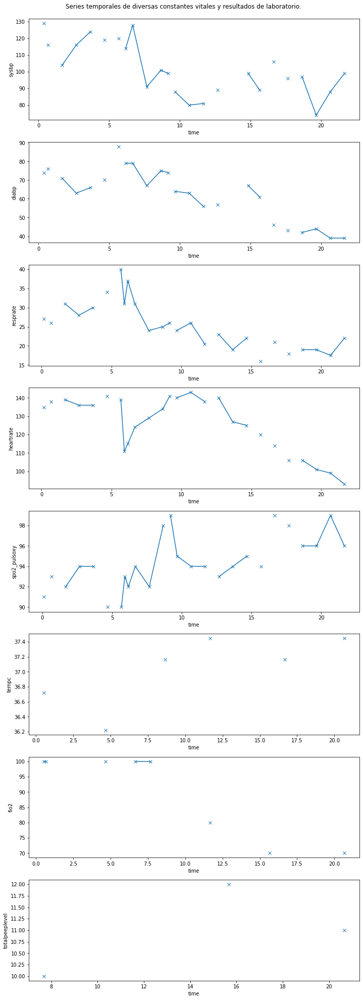

In [17]:
variables = ['sysbp', 'diabp', 'resprate', 'heartrate', 'spo2_pulsoxy', 'tempc', 'fio2', 'totalpeeplevel']

plot_variables_evolution(full_labvitals, 200087, variables, 'Series temporales de diversas constantes vitales y resultados de laboratorio.', show=True, save_path='../images/series_plot.png')

## Distribución de las variables

sysbp


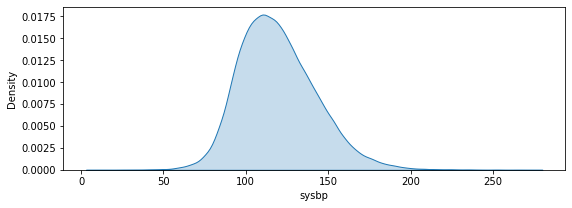

diabp


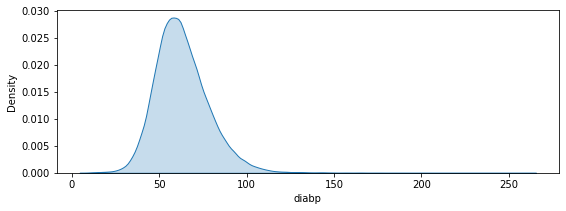

meanbp


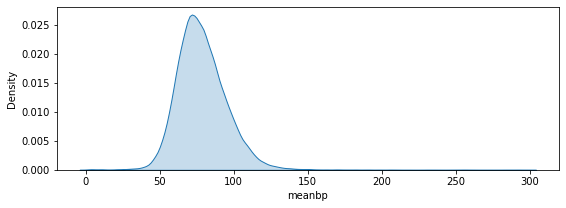

resprate


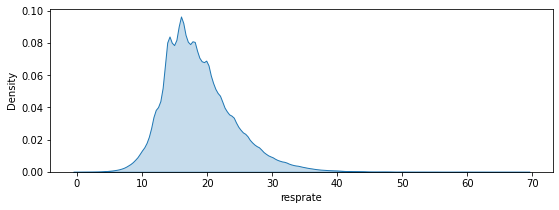

heartrate


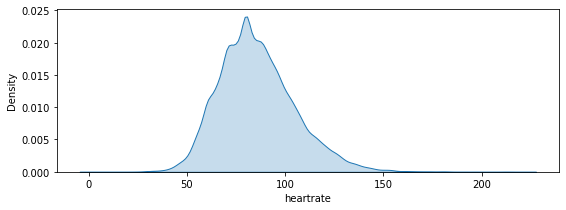

spo2_pulsoxy


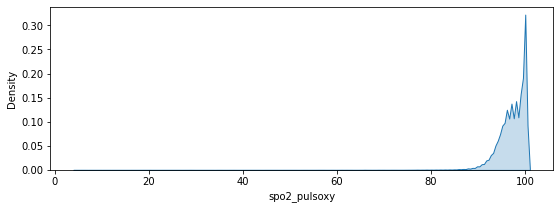

tempc


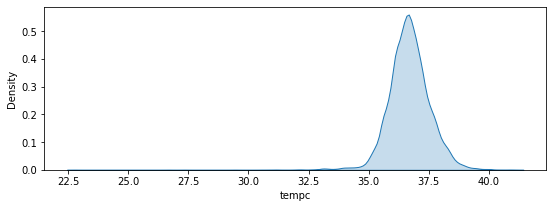

cardiacoutput


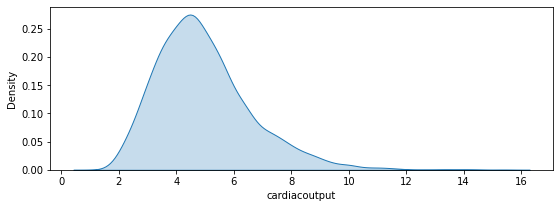

tvset


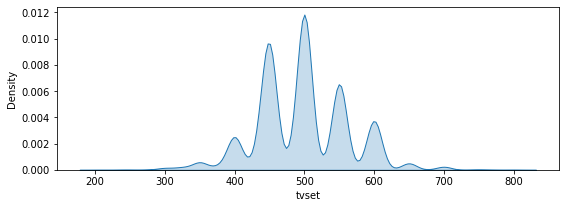

tvobserved


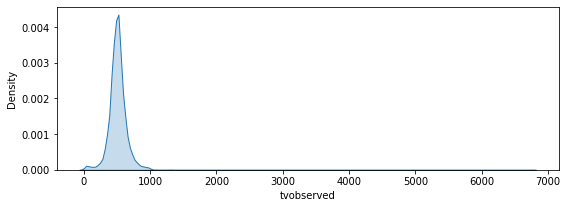

tvspontaneous


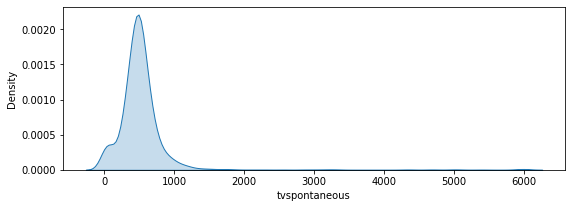

peakinsppressure


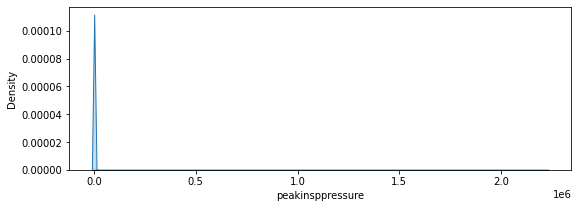

totalpeeplevel


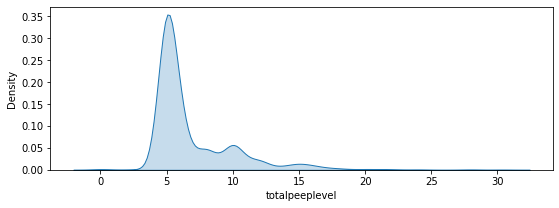

o2flow


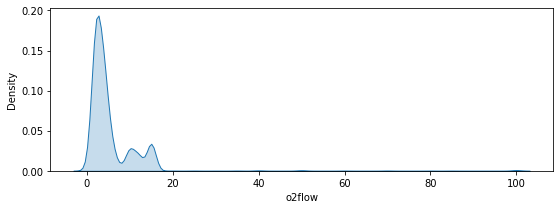

fio2


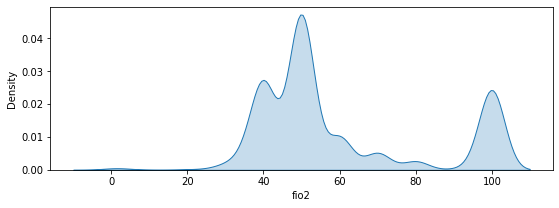

albumin


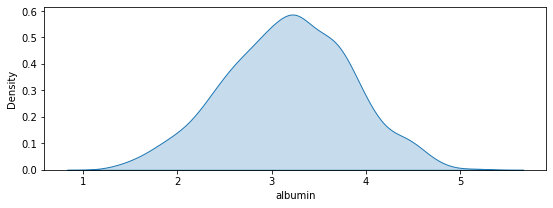

bands


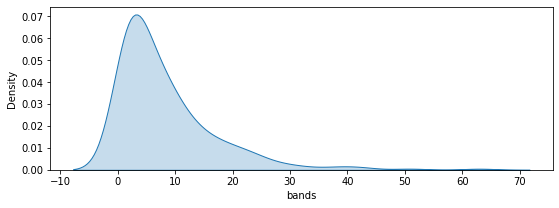

bicarbonate


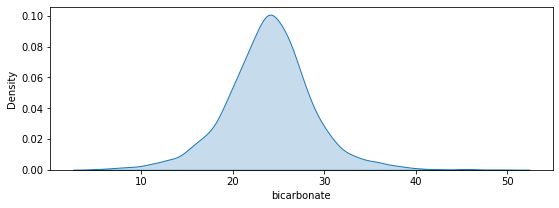

bilirubin


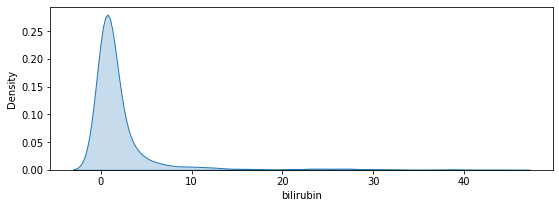

creatinine


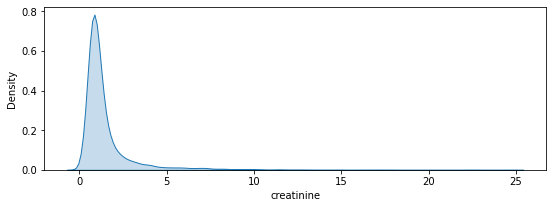

chloride


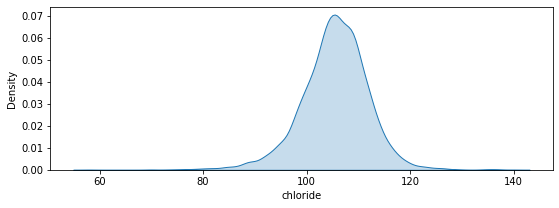

glucose


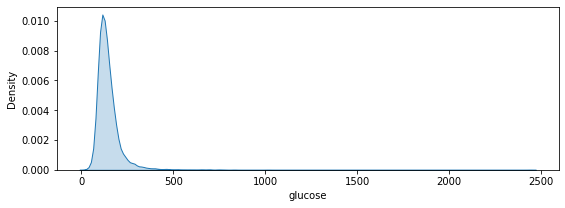

hematocrit


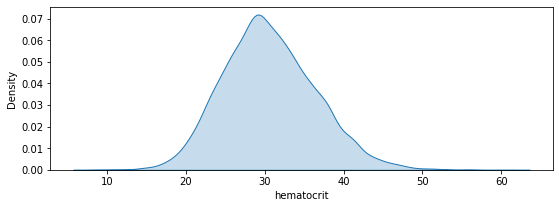

hemoglobin


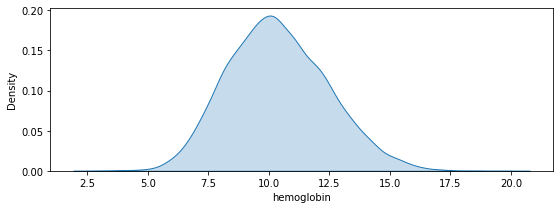

lactate


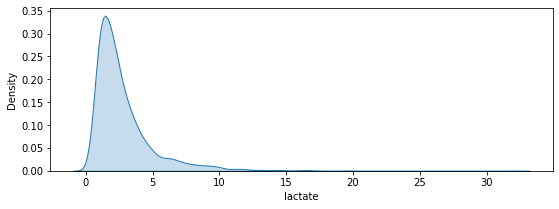

platelet


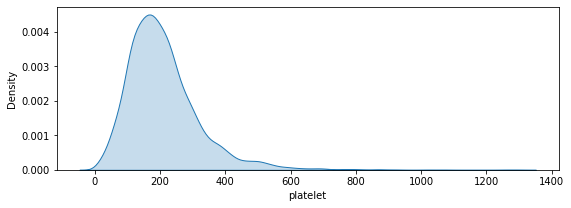

potassium


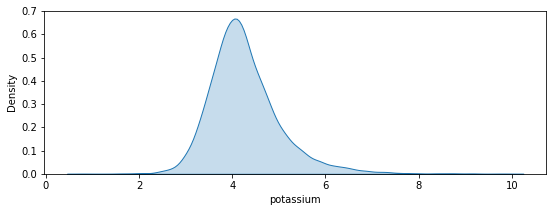

ptt


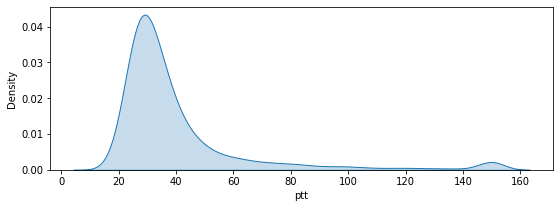

inr


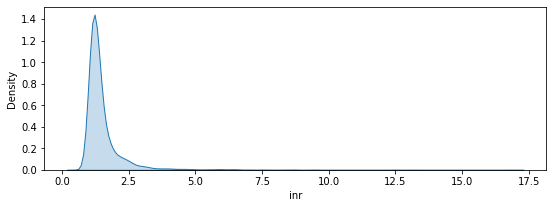

pt


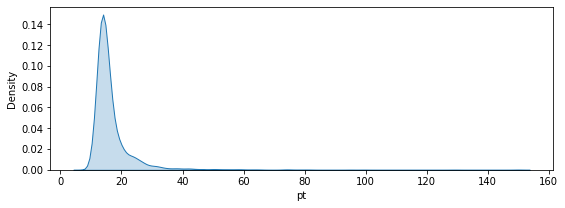

sodium


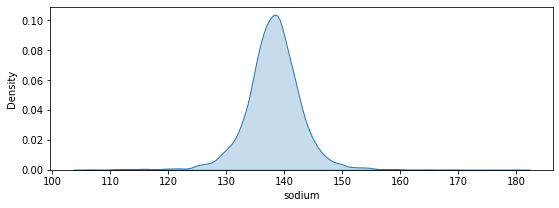

bun


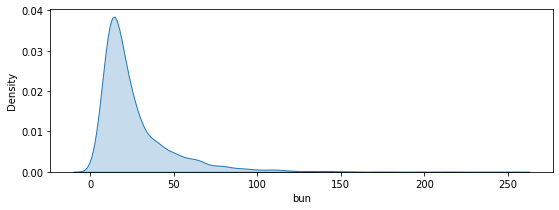

wbc


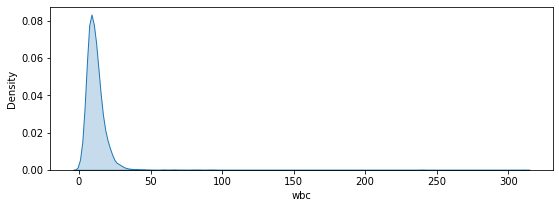

creatinekinase


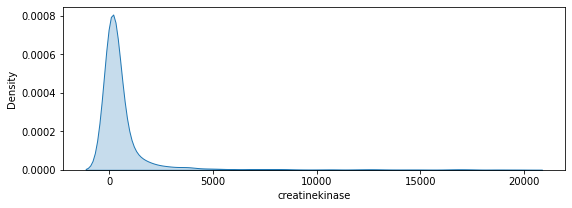

ck_mb


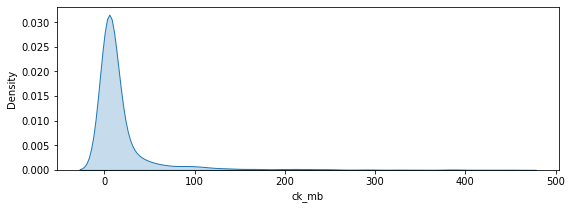

fibrinogen


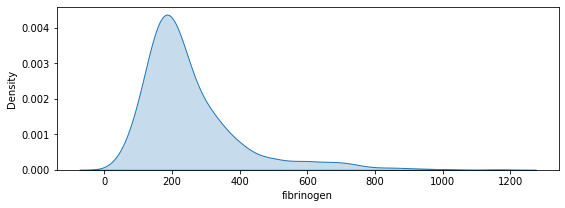

ldh


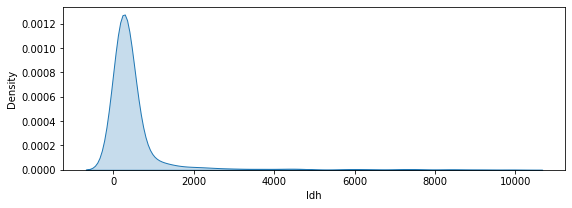

magnesium


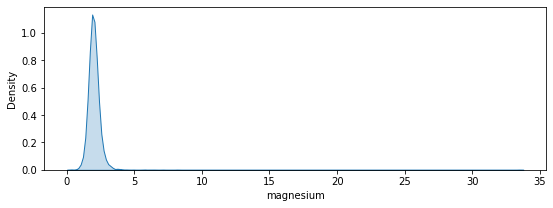

calcium_free


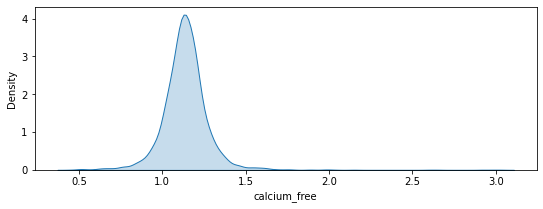

po2_bloodgas


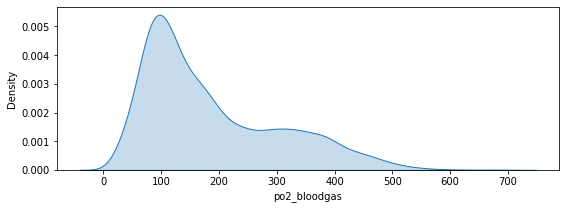

ph_bloodgas


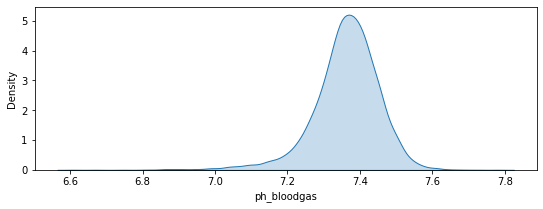

pco2_bloodgas


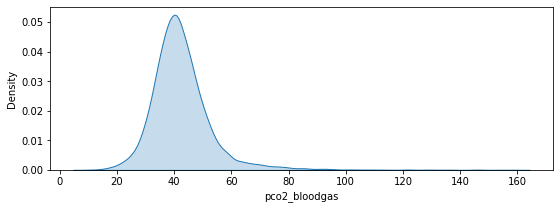

so2_bloodgas


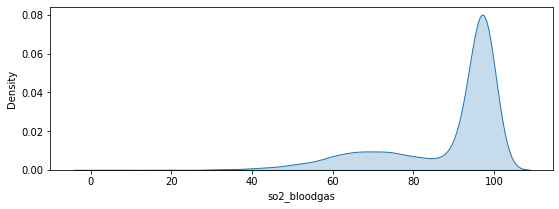

troponin_t


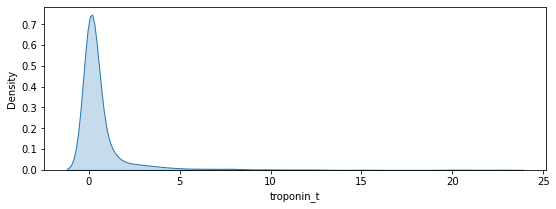

In [25]:
kdeplot_univariate_features(full_labvitals, all_features, '')

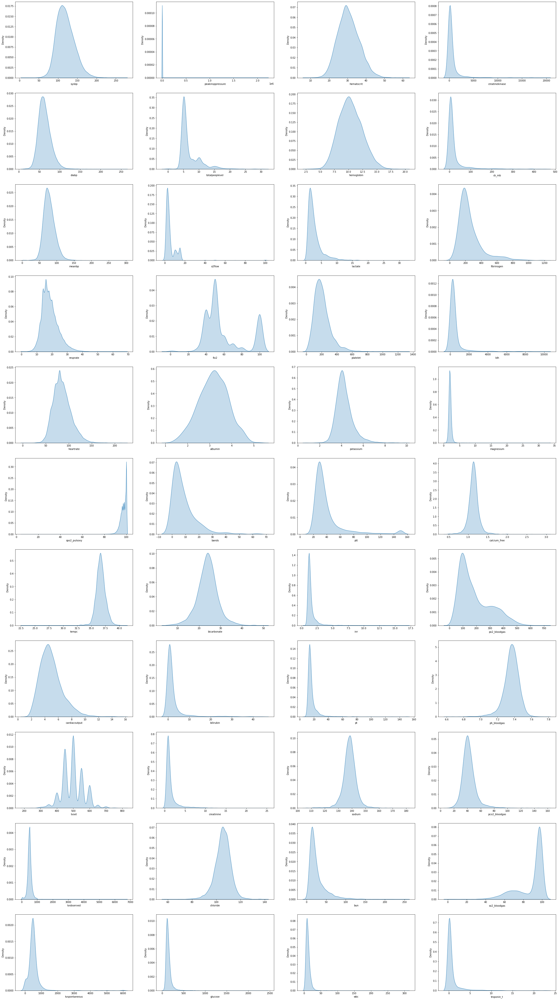

In [26]:
plot_features_kde_grid(full_labvitals, all_features, save_path='../images/kde_series.png')

In [27]:
full_labvitals[vitals_features].describe()

,sysbp,diabp,meanbp,resprate,heartrate,spo2_pulsoxy,tempc,cardiacoutput,tvset,tvobserved,tvspontaneous,peakinsppressure,totalpeeplevel,o2flow,fio2
count,100522.000000,100493.000000,100496.000000,113703.000000,113484.000000,110068.000000,29081.000000,5378.000000,8710.000000,9838.000000,3214.000000,1.047000e+04,2178.000000,10657.000000,14701.000000
mean,119.276659,62.902875,78.374438,18.690858,85.405380,97.184168,36.682044,4.945824,496.451713,504.868116,522.328304,2.318461e+02,6.879798,5.394389,59.633402
std,23.473142,15.368169,17.057233,5.438100,19.313855,3.525173,0.853259,1.675234,65.644588,140.828286,448.829068,2.171752e+04,3.172007,6.668045,22.582576
min,10.000000,9.000000,1.000000,1.000000,1.000000,5.000000,22.777778,1.320000,210.000000,0.200000,2.590000,0.000000e+00,0.000000,0.000000,0.000000
25%,103.000000,52.000000,67.000000,15.000000,72.000000,96.000000,36.166667,3.800000,450.000000,440.000000,379.000000,1.500000e+01,5.000000,2.000000,40.000000
50%,117.000000,61.000000,77.000000,18.000000,83.000000,98.000000,36.666667,4.700000,500.000000,503.000000,491.000000,2.000000e+01,5.000000,3.000000,50.000000
75%,134.000000,72.000000,88.000000,22.000000,97.000000,100.000000,37.166667,5.800000,550.000000,562.000000,586.000000,2.500000e+01,8.000000,6.000000,70.000000
max,273.000000,261.000000,299.000000,68.000000,222.000000,100.000000,41.111111,15.400000,800.000000,6750.000000,6000.000000,2.222222e+06,30.400000,100.000000,100.000000


In [28]:
full_labvitals[labs_features].describe()

,albumin,bands,bicarbonate,bilirubin,creatinine,chloride,glucose,hematocrit,hemoglobin,lactate,...,ck_mb,fibrinogen,ldh,magnesium,calcium_free,po2_bloodgas,ph_bloodgas,pco2_bloodgas,so2_bloodgas,troponin_t
count,1320.000000,268.000000,7651.000000,2013.000000,7704.000000,9638.000000,11860.000000,11912.000000,10087.000000,5023.000000,...,2050.000000,1181.000000,1276.000000,6831.000000,4734.000000,8822.000000,9275.000000,8823.000000,2866.000000,1630.000000
mean,3.173030,8.372388,23.919148,2.259414,1.476597,105.371913,144.163744,30.550201,10.360057,2.770999,...,19.778000,253.479255,540.818966,2.003352,1.136996,186.992632,7.360919,42.425366,88.326413,0.698362
std,0.663222,8.939932,4.840774,4.768612,1.638775,6.488375,68.578061,5.872458,2.063715,2.263623,...,43.520678,149.861339,1044.615417,0.564734,0.142549,117.993431,0.093009,10.849586,14.553289,1.771924
min,1.300000,1.000000,5.000000,0.100000,0.100000,58.000000,21.000000,8.400000,2.900000,0.300000,...,1.000000,35.000000,65.000000,0.300000,0.450000,16.000000,6.610000,10.000000,4.500000,0.010000
25%,2.700000,2.000000,21.000000,0.400000,0.700000,102.000000,107.000000,26.500000,8.900000,1.300000,...,3.000000,161.000000,193.750000,1.800000,1.070000,95.000000,7.320000,36.000000,81.000000,0.040000
50%,3.200000,5.000000,24.000000,0.800000,1.000000,106.000000,130.000000,30.100000,10.200000,2.100000,...,6.000000,212.000000,266.000000,2.000000,1.130000,149.000000,7.370000,41.000000,96.000000,0.120000
75%,3.600000,11.000000,27.000000,1.800000,1.425000,109.000000,162.000000,34.300000,11.800000,3.300000,...,14.000000,297.000000,392.250000,2.200000,1.200000,264.000000,7.420000,47.000000,98.000000,0.500000
max,5.200000,63.000000,50.000000,44.100000,24.600000,140.000000,2440.000000,60.900000,19.800000,32.000000,...,450.000000,1167.000000,9920.000000,33.500000,3.030000,691.000000,7.780000,159.000000,100.000000,22.700000


- Casos de control:

sysbp


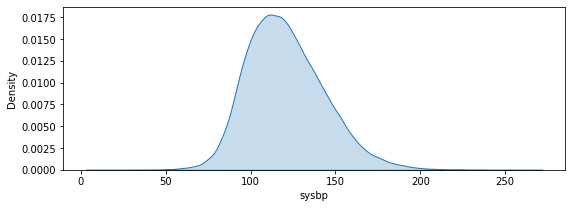

diabp


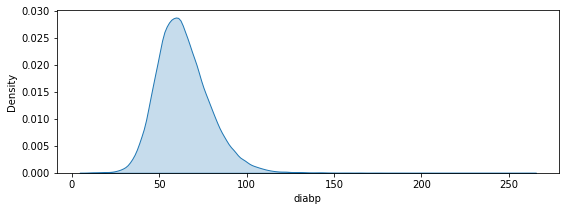

meanbp


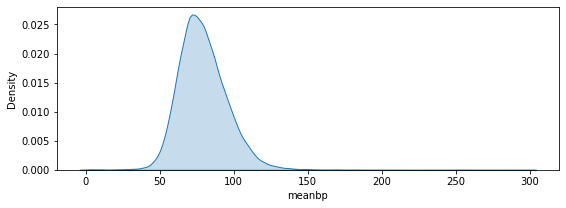

resprate


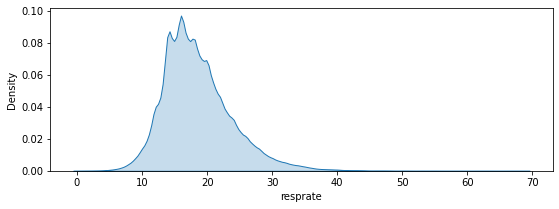

heartrate


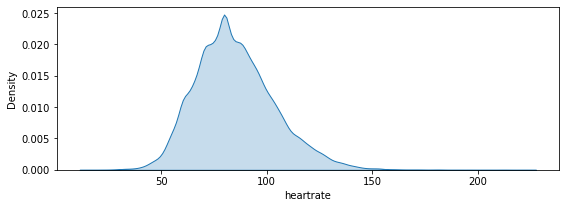

spo2_pulsoxy


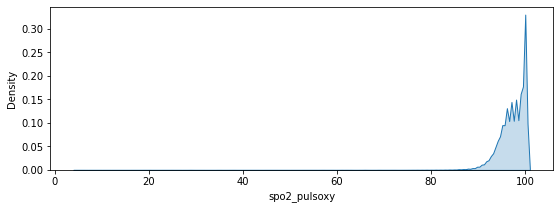

tempc


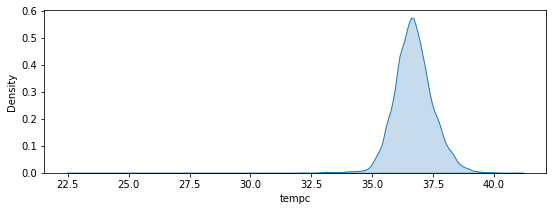

cardiacoutput


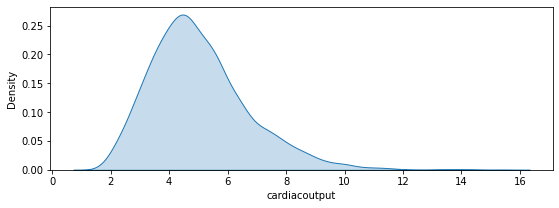

tvset


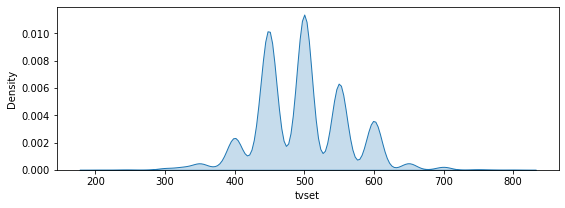

tvobserved


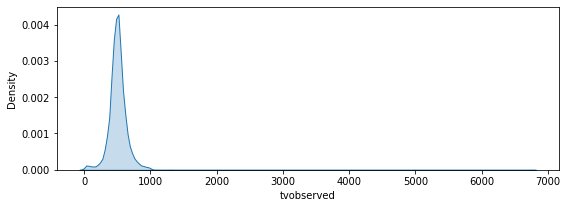

tvspontaneous


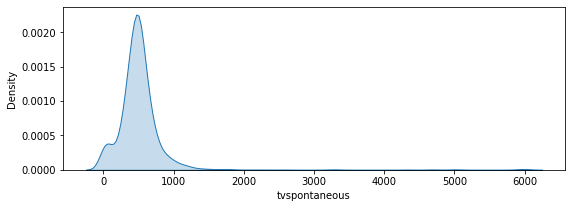

peakinsppressure


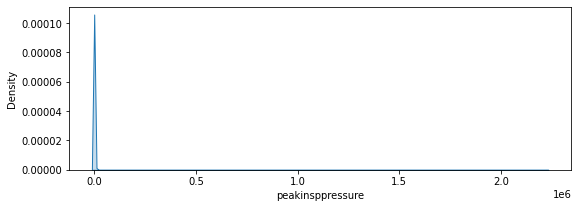

totalpeeplevel


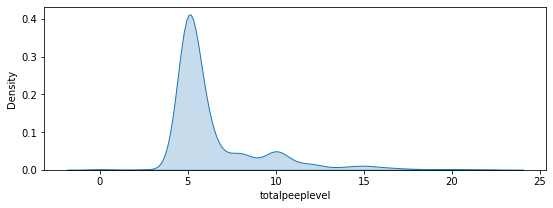

o2flow


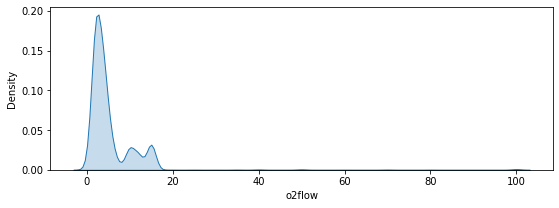

fio2


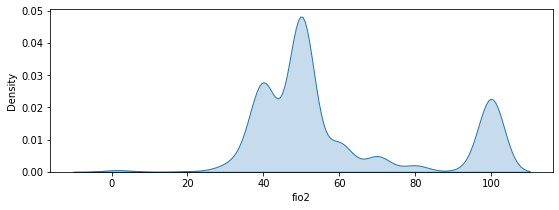

albumin


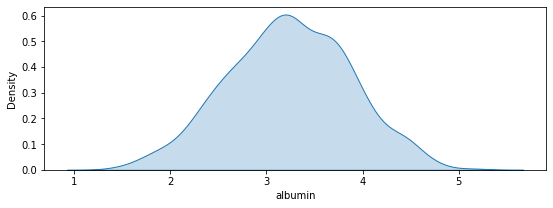

bands


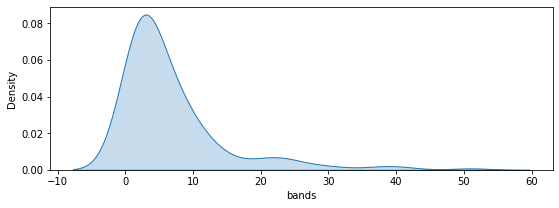

bicarbonate


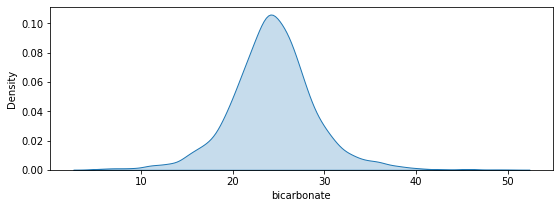

bilirubin


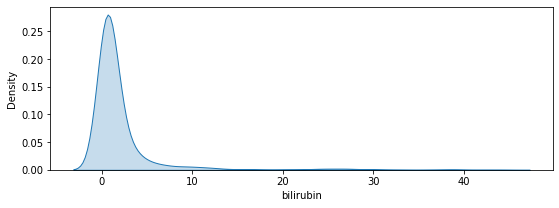

creatinine


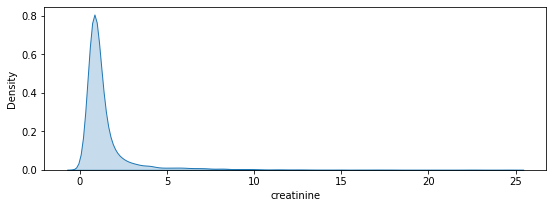

chloride


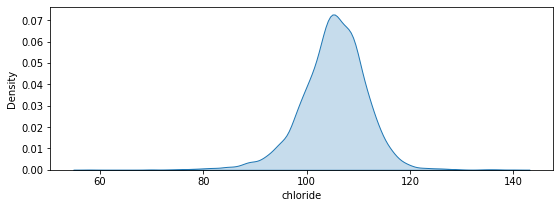

glucose


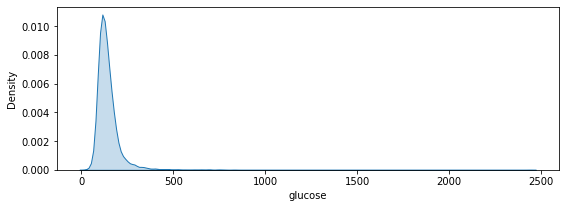

hematocrit


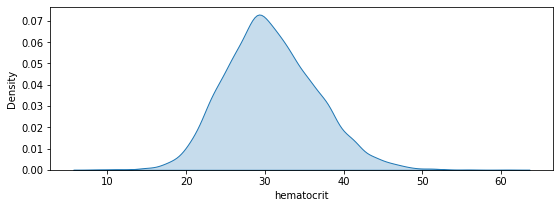

hemoglobin


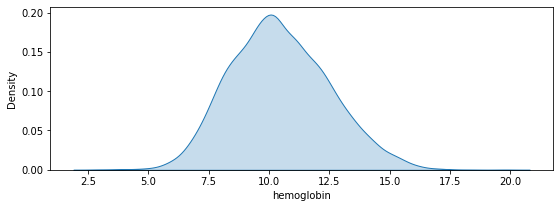

lactate


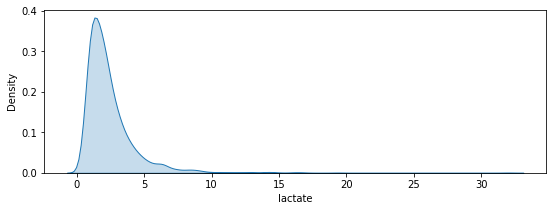

platelet


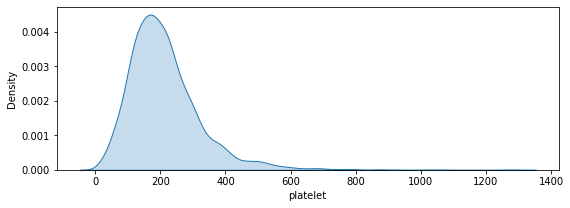

potassium


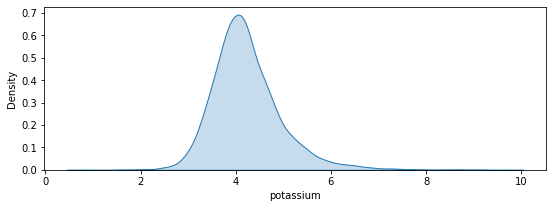

ptt


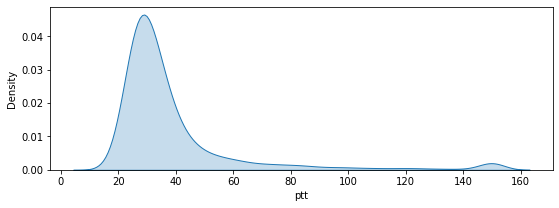

inr


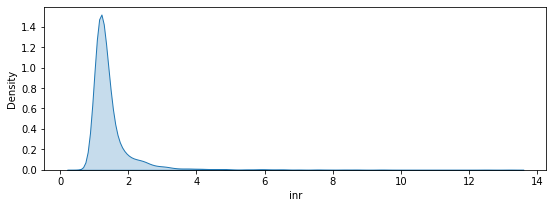

pt


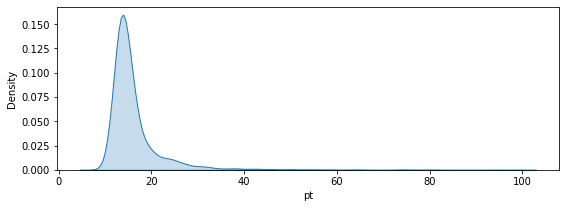

sodium


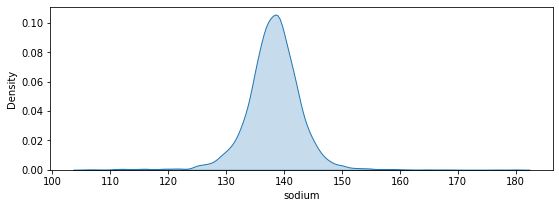

bun


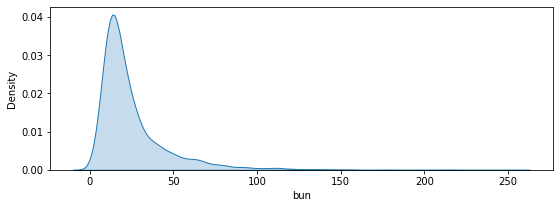

wbc


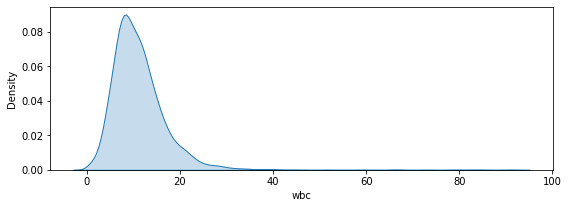

creatinekinase


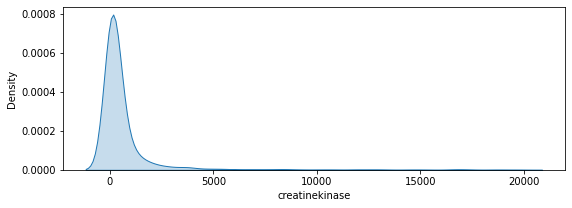

ck_mb


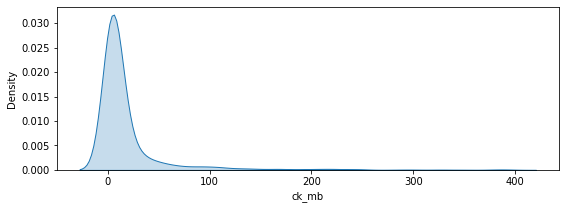

fibrinogen


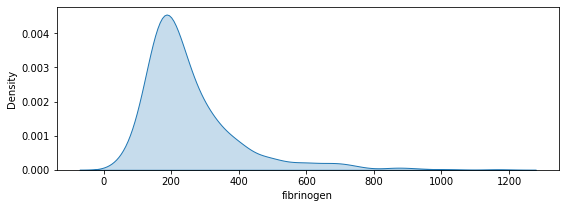

ldh


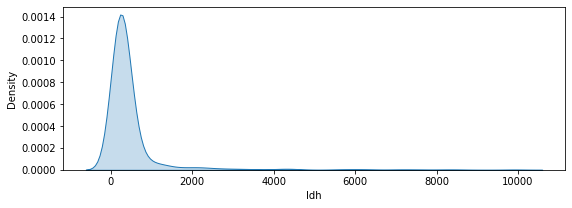

magnesium


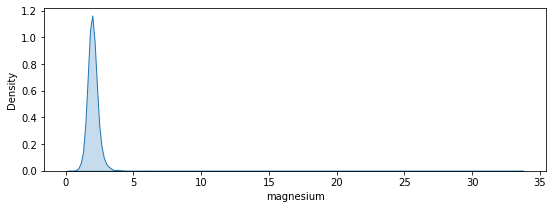

calcium_free


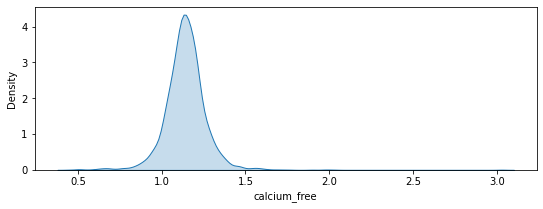

po2_bloodgas


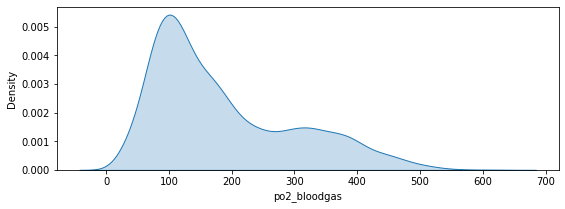

ph_bloodgas


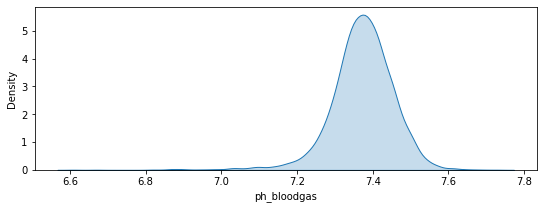

pco2_bloodgas


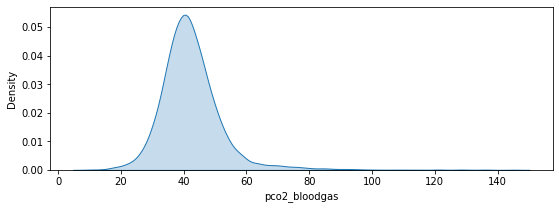

so2_bloodgas


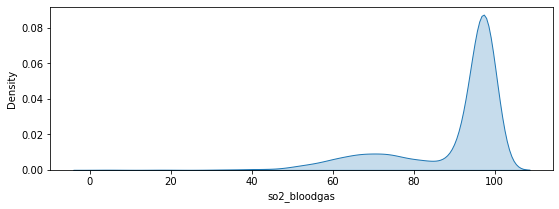

troponin_t


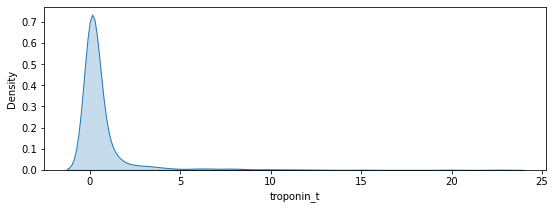

In [29]:
kdeplot_univariate_features(controls_labvitals, all_features, '')

- Casos de inflammation:

sysbp


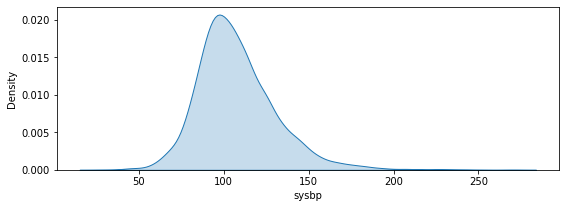

diabp


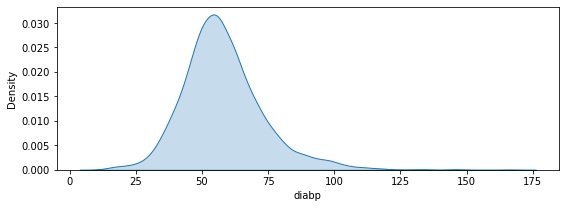

meanbp


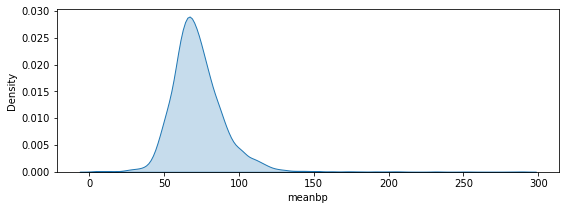

resprate


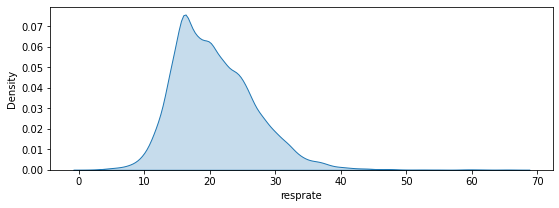

heartrate


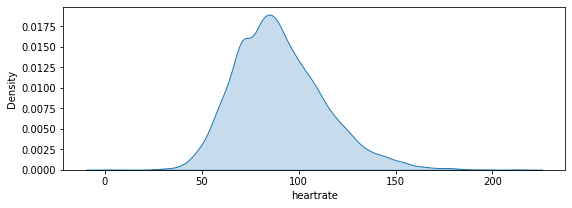

spo2_pulsoxy


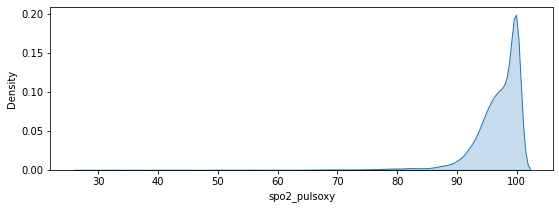

tempc


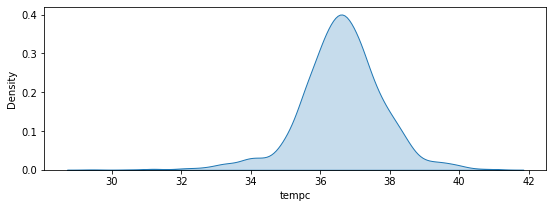

cardiacoutput


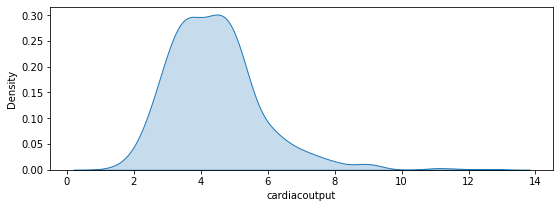

tvset


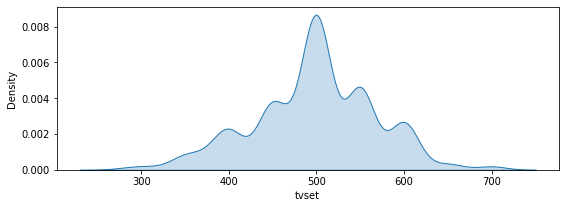

tvobserved


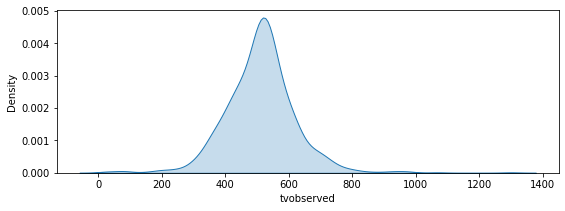

tvspontaneous


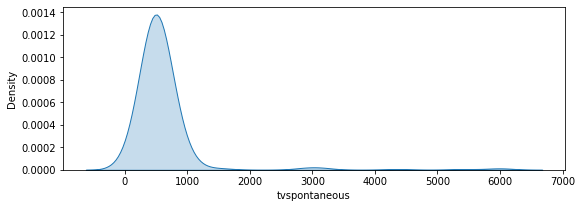

peakinsppressure


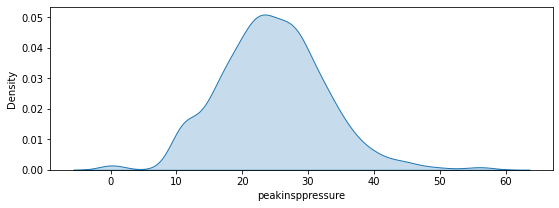

totalpeeplevel


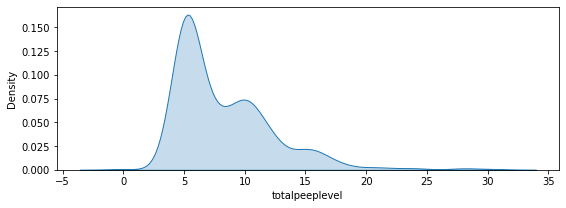

o2flow


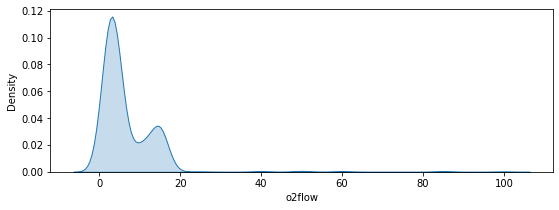

fio2


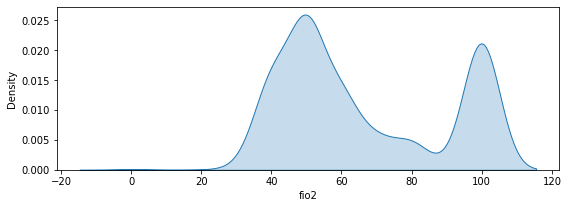

albumin


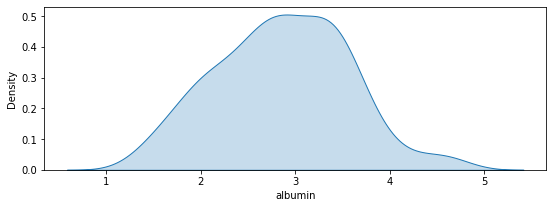

bands


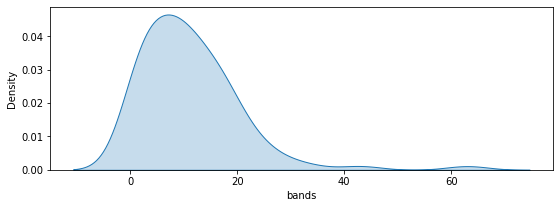

bicarbonate


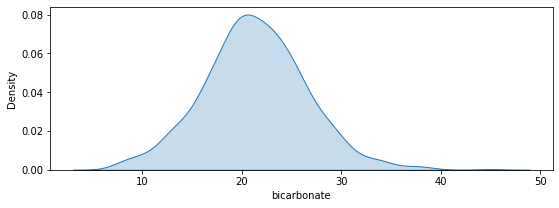

bilirubin


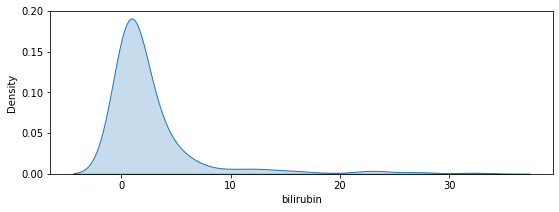

creatinine


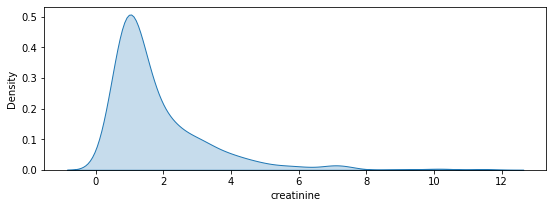

chloride


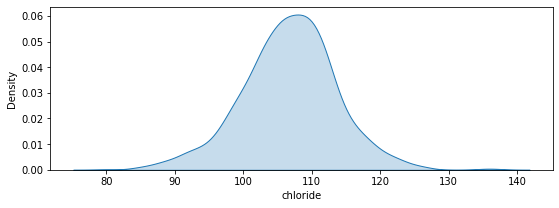

glucose


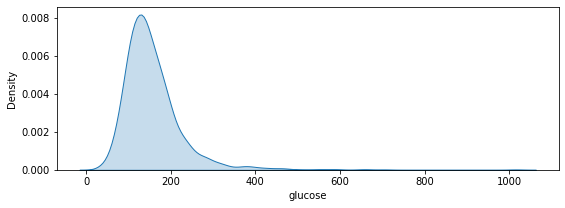

hematocrit


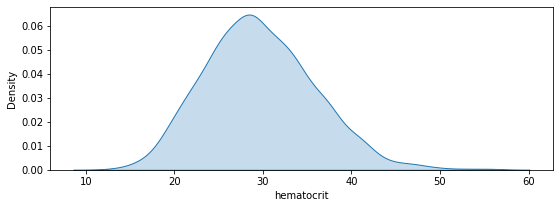

hemoglobin


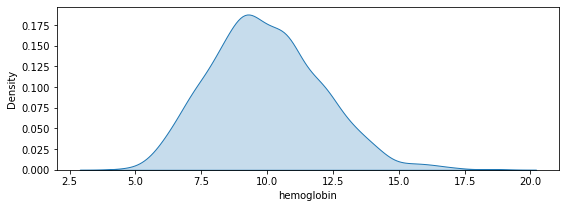

lactate


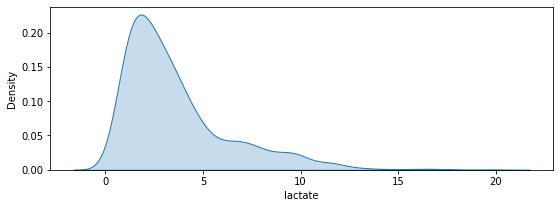

platelet


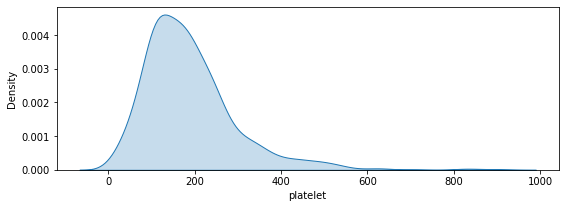

potassium


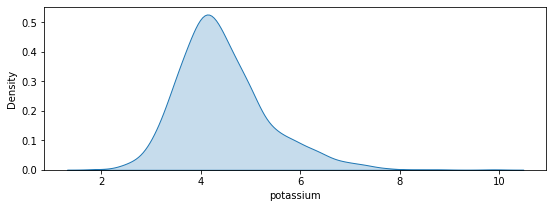

ptt


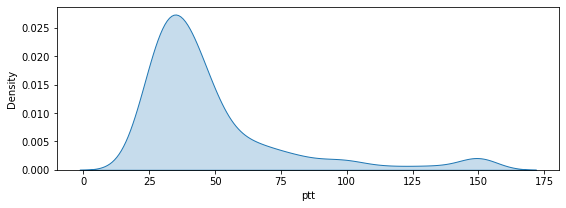

inr


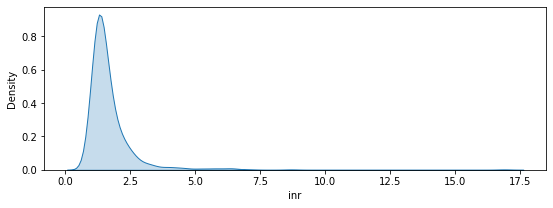

pt


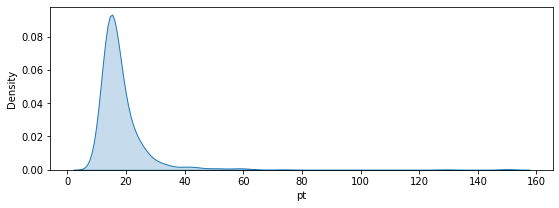

sodium


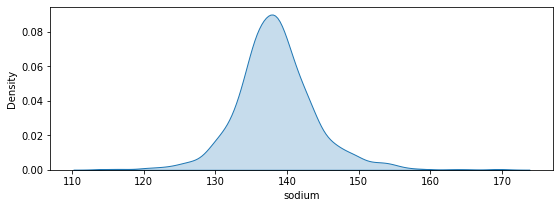

bun


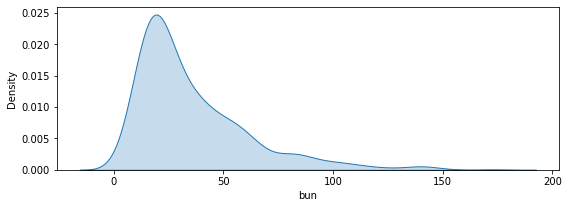

wbc


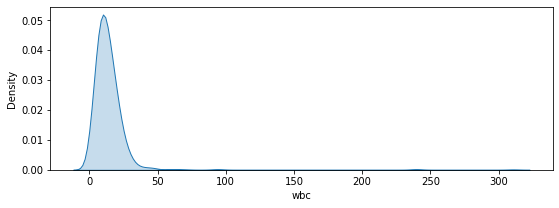

creatinekinase


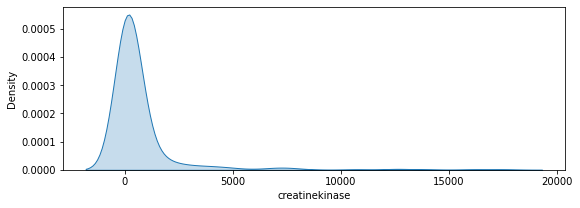

ck_mb


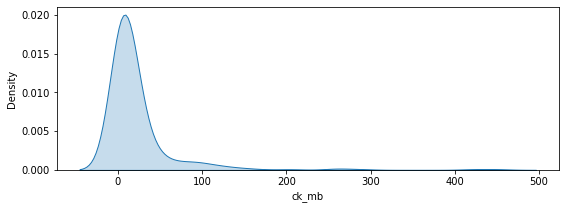

fibrinogen


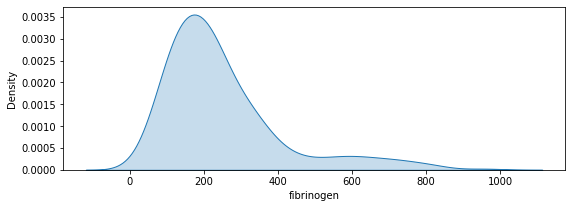

ldh


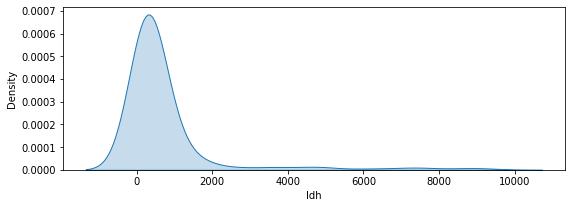

magnesium


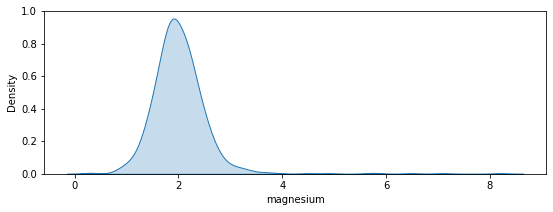

calcium_free


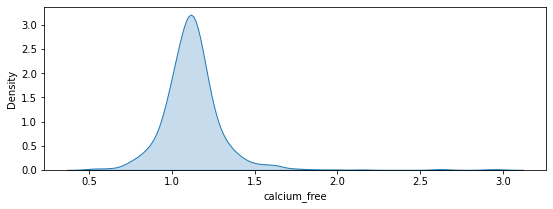

po2_bloodgas


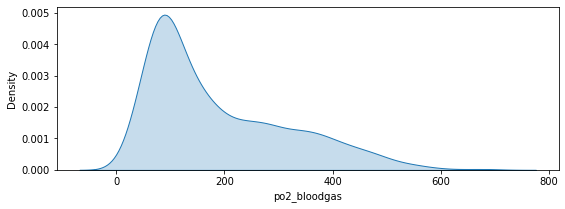

ph_bloodgas


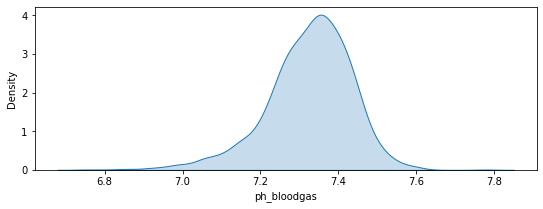

pco2_bloodgas


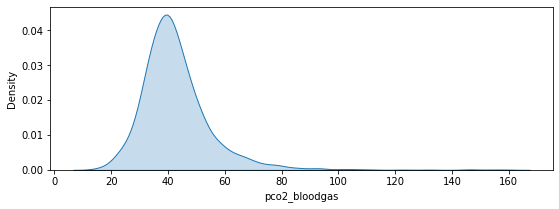

so2_bloodgas


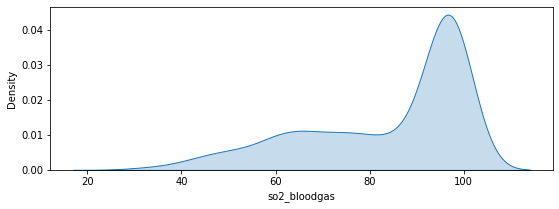

troponin_t


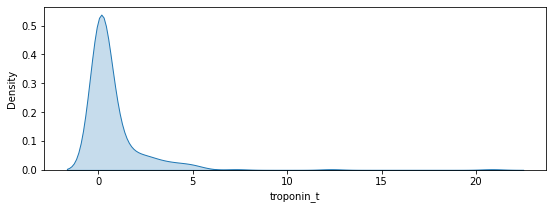

In [30]:
kdeplot_univariate_features(cases_labvitals, all_features, '')

sysbp


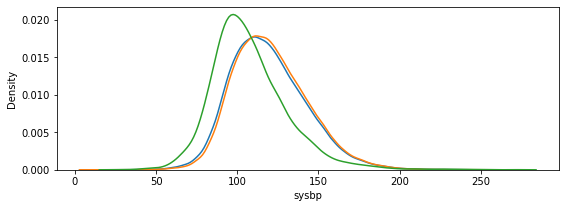

diabp


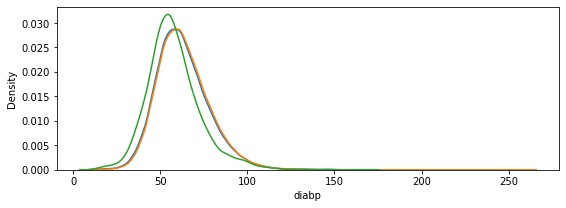

meanbp


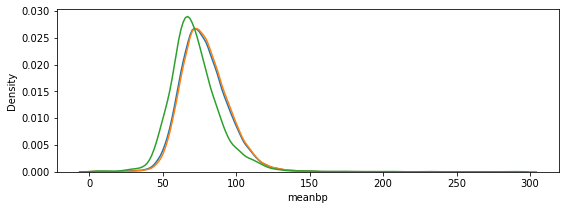

resprate


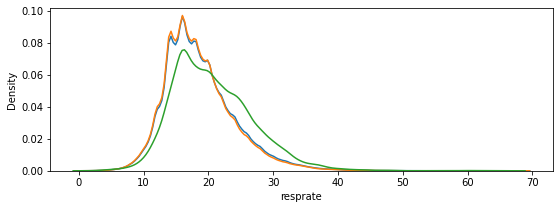

heartrate


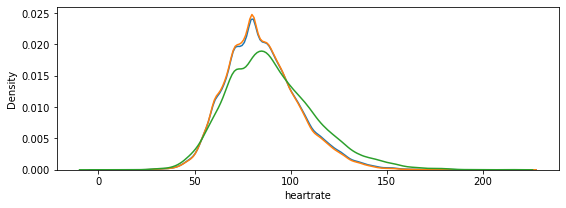

spo2_pulsoxy


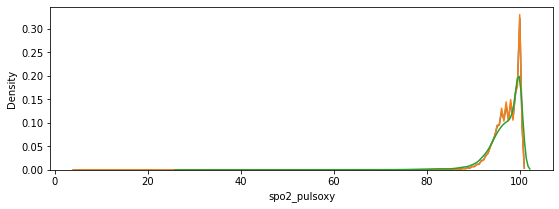

tempc


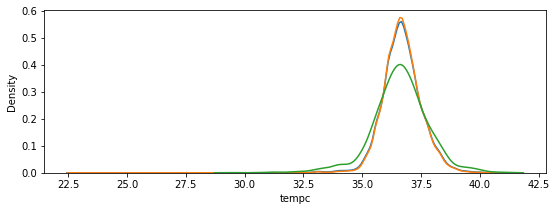

cardiacoutput


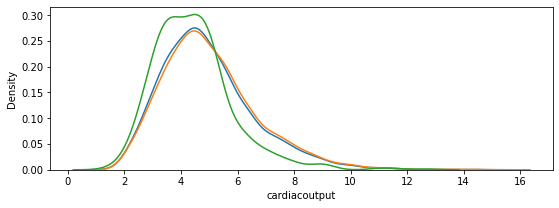

tvset


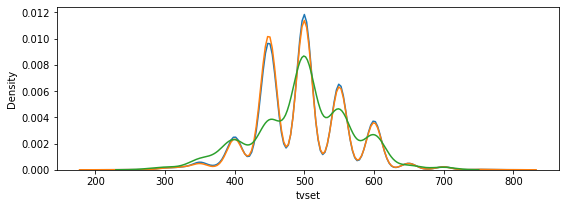

tvobserved


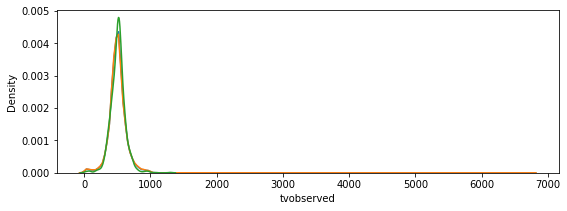

tvspontaneous


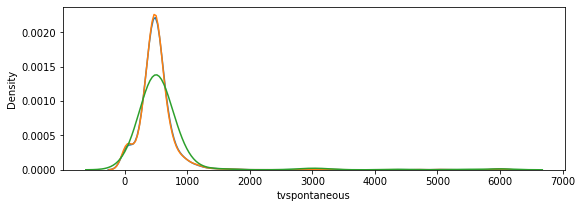

peakinsppressure


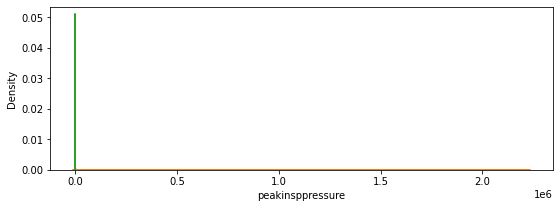

totalpeeplevel


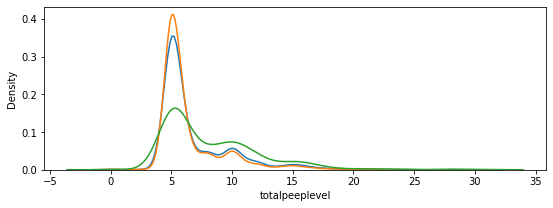

o2flow


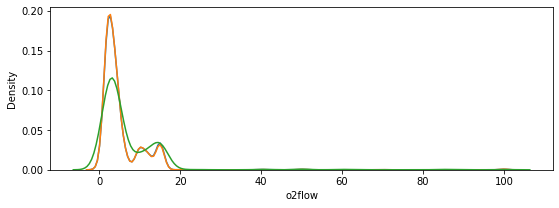

fio2


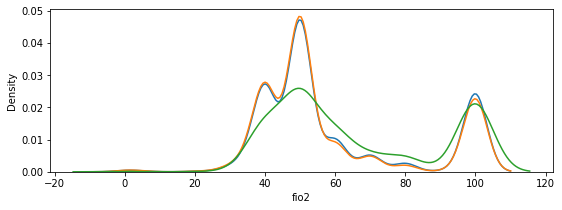

albumin


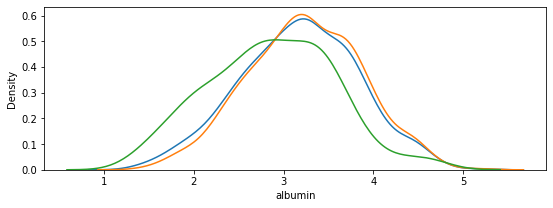

bands


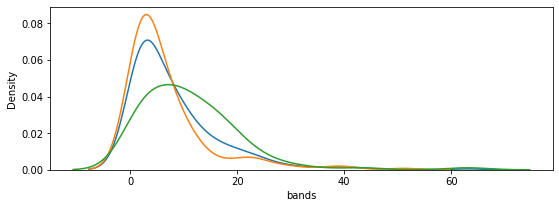

bicarbonate


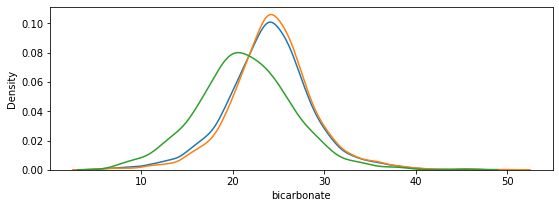

bilirubin


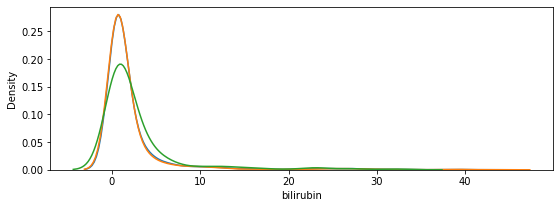

creatinine


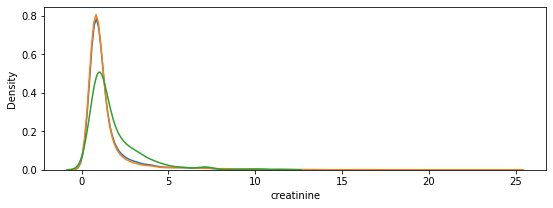

chloride


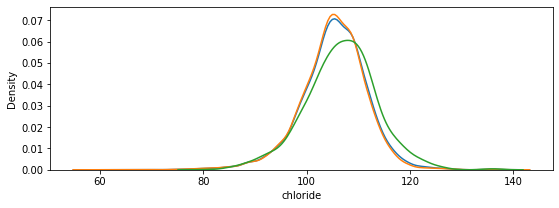

glucose


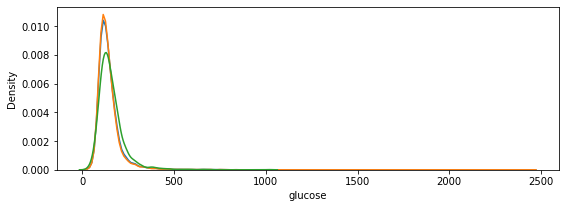

hematocrit


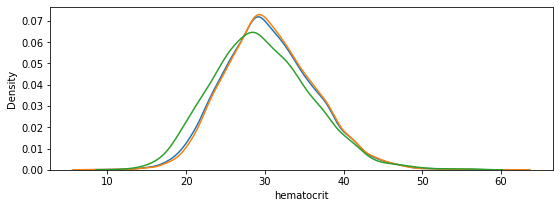

hemoglobin


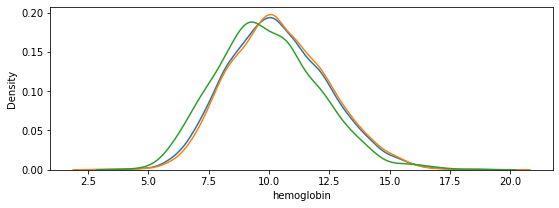

lactate


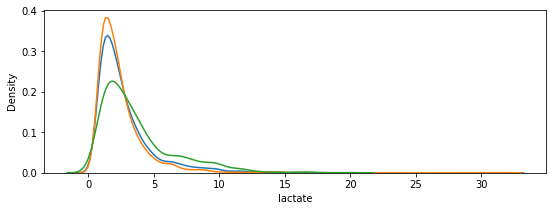

platelet


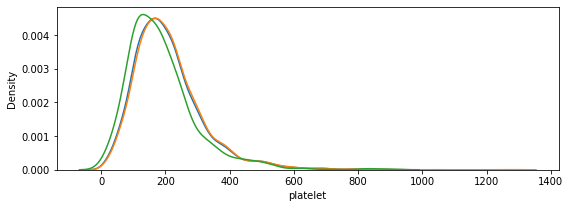

potassium


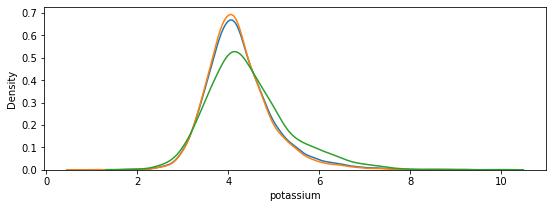

ptt


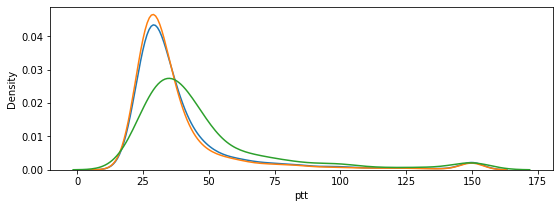

inr


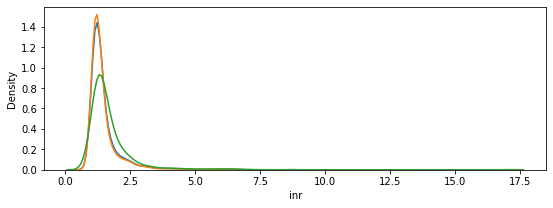

pt


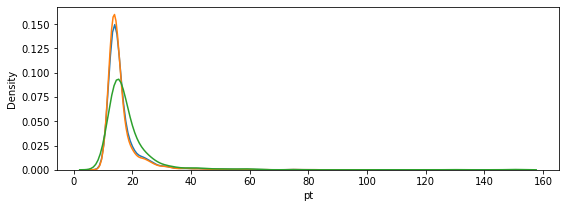

sodium


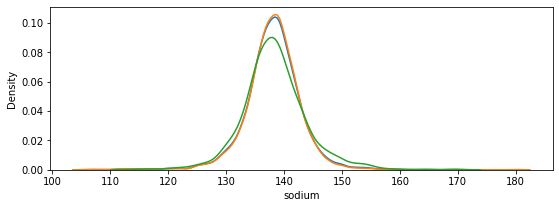

bun


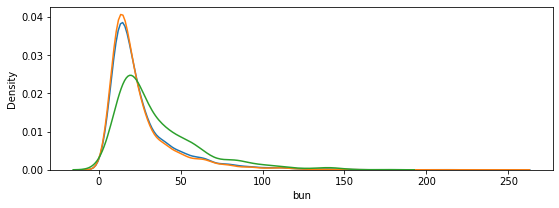

wbc


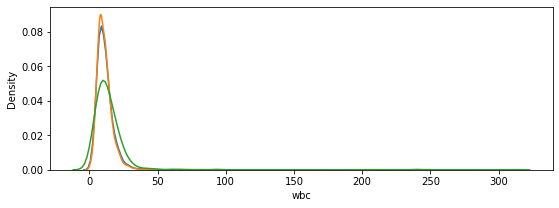

creatinekinase


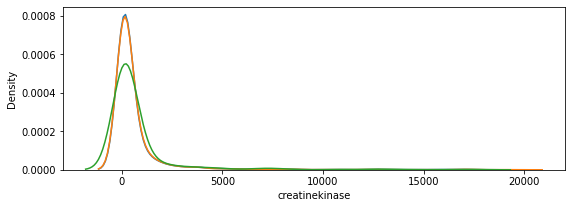

ck_mb


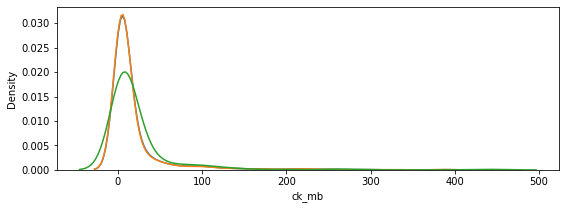

fibrinogen


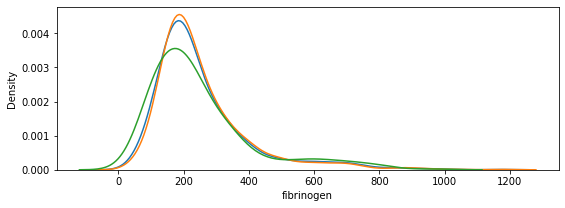

ldh


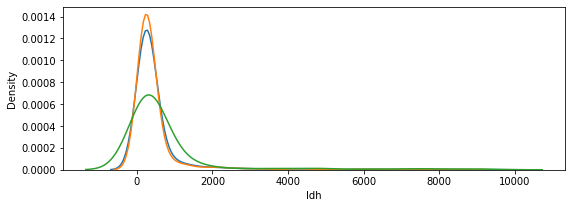

magnesium


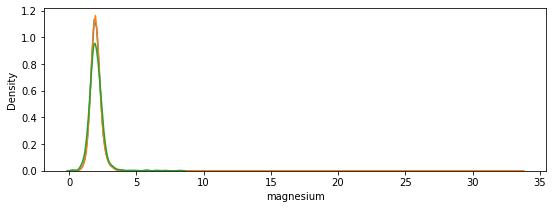

calcium_free


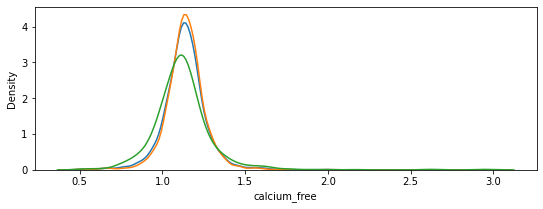

po2_bloodgas


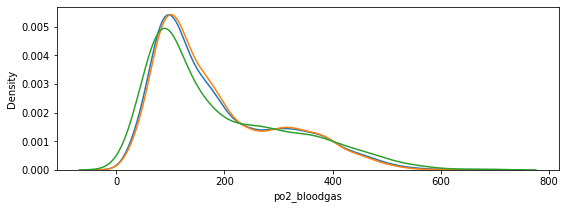

ph_bloodgas


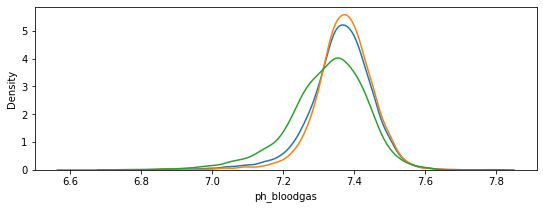

pco2_bloodgas


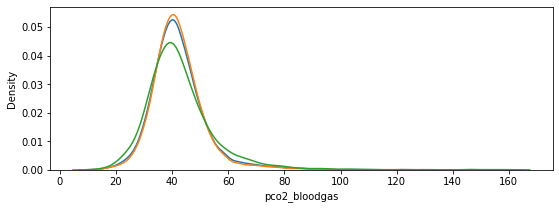

so2_bloodgas


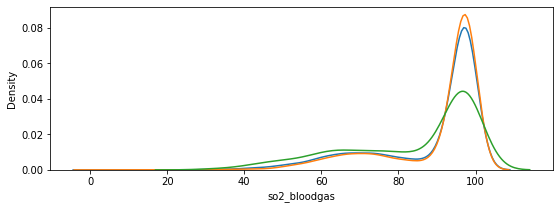

troponin_t


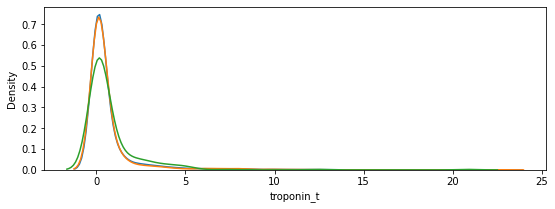

In [31]:
kdeplot_univariate_features_shared(labvitals, controls_labvitals, cases_labvitals, all_features, '')

sysbp


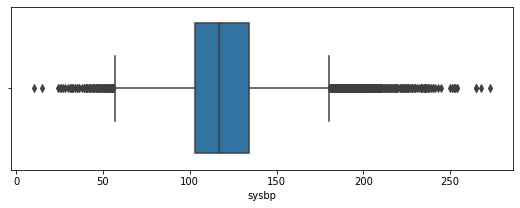

diabp


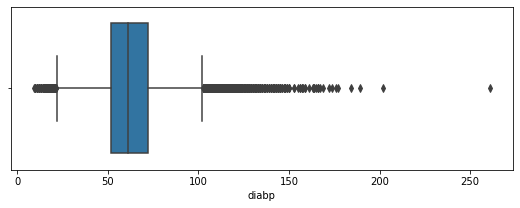

meanbp


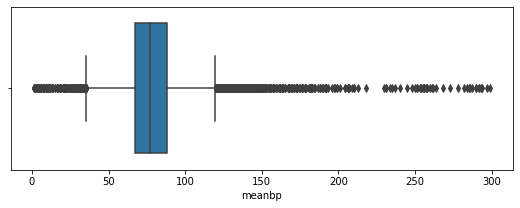

resprate


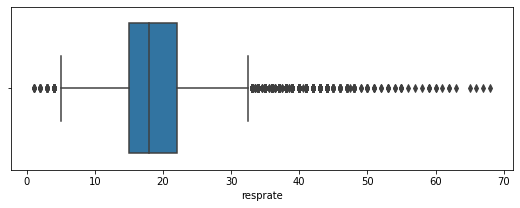

heartrate


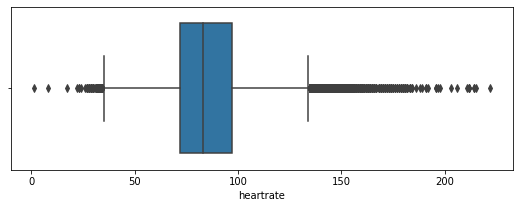

spo2_pulsoxy


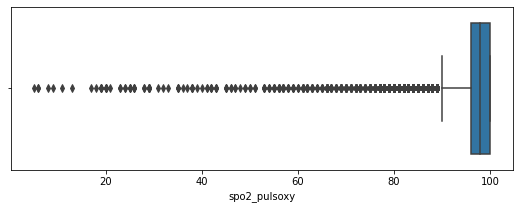

tempc


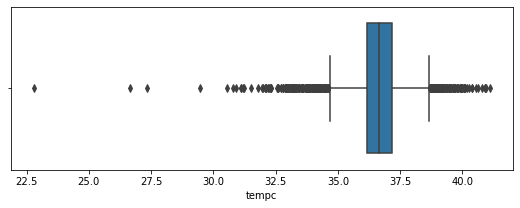

cardiacoutput


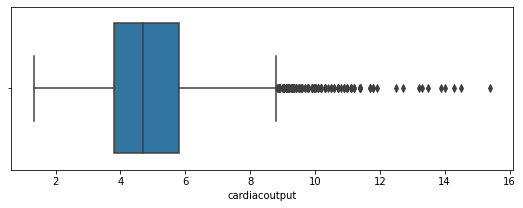

tvset


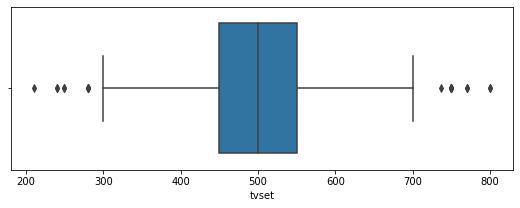

tvobserved


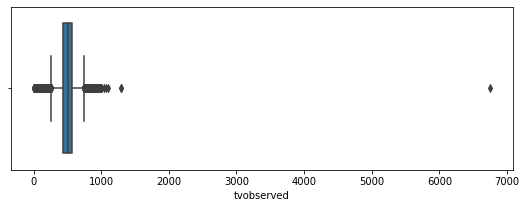

tvspontaneous


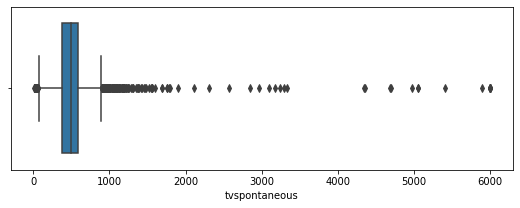

peakinsppressure


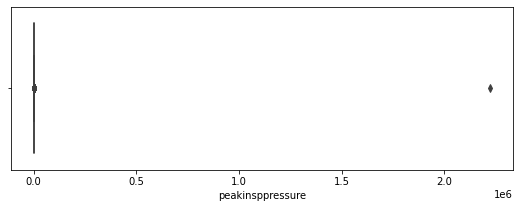

totalpeeplevel


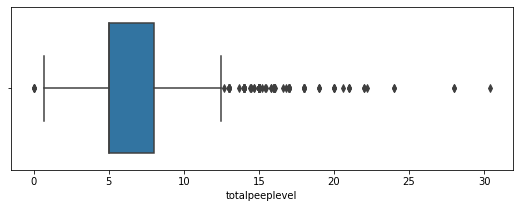

o2flow


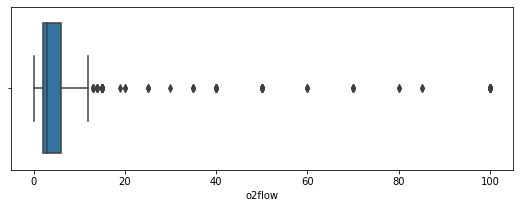

fio2


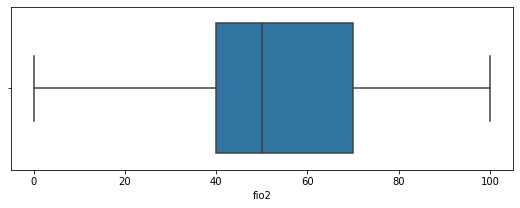

albumin


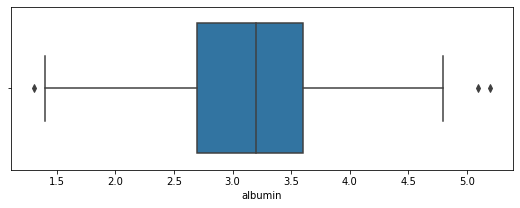

bands


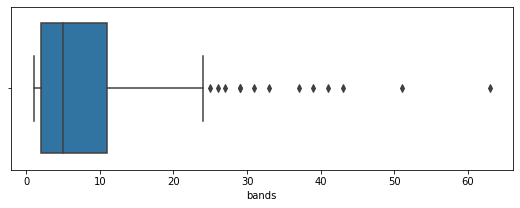

bicarbonate


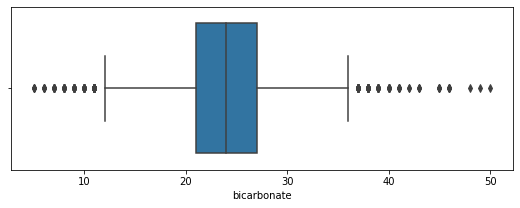

bilirubin


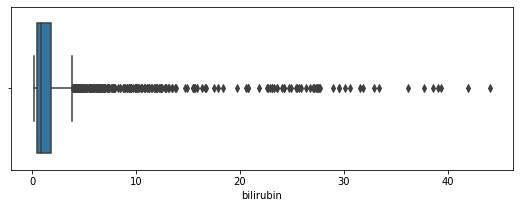

creatinine


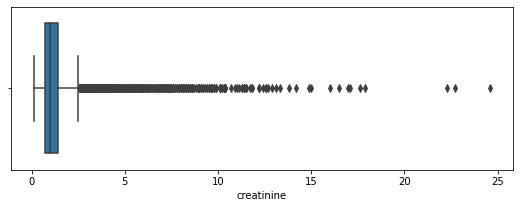

chloride


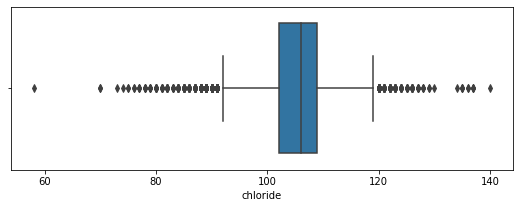

glucose


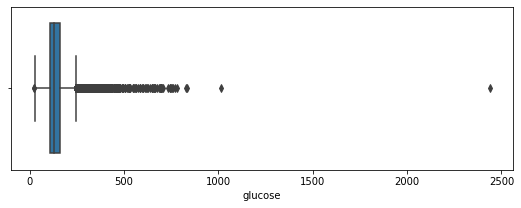

hematocrit


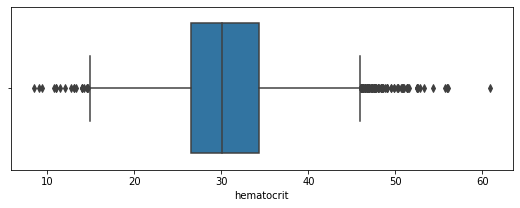

hemoglobin


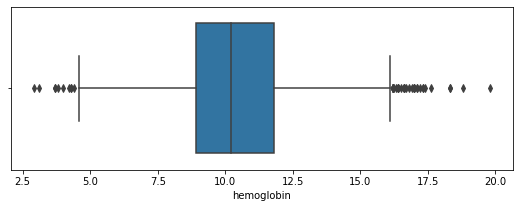

lactate


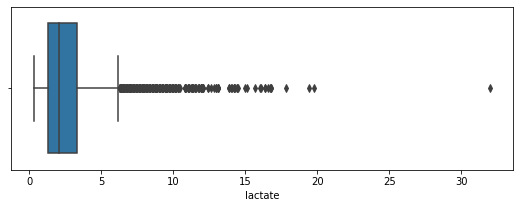

platelet


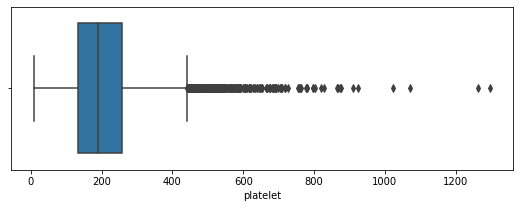

potassium


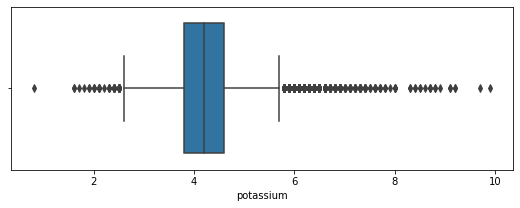

ptt


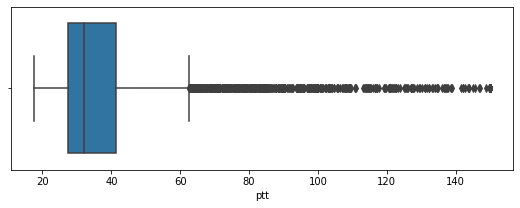

inr


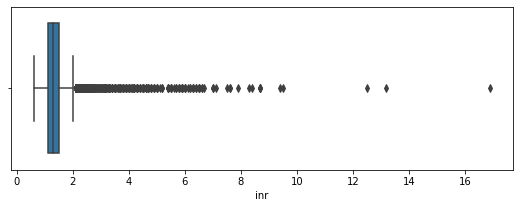

pt


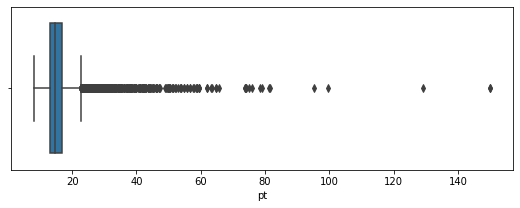

sodium


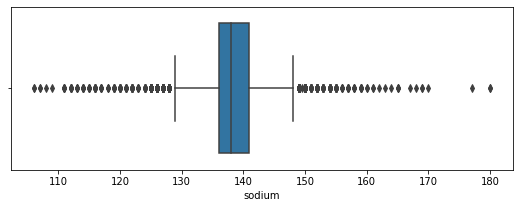

bun


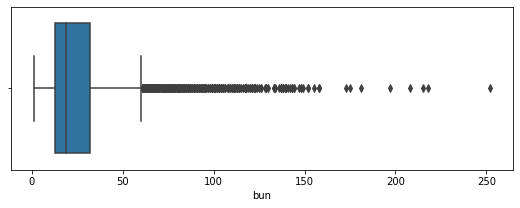

wbc


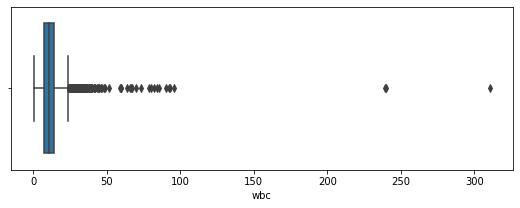

creatinekinase


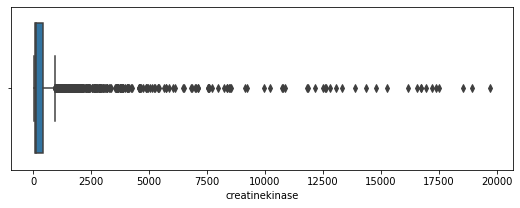

ck_mb


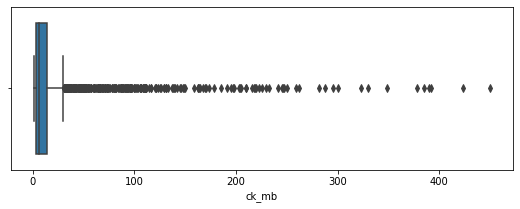

fibrinogen


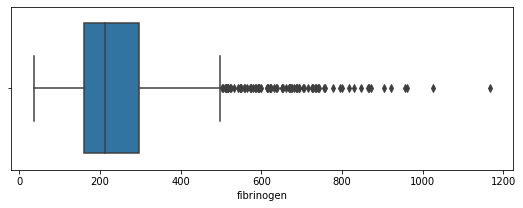

ldh


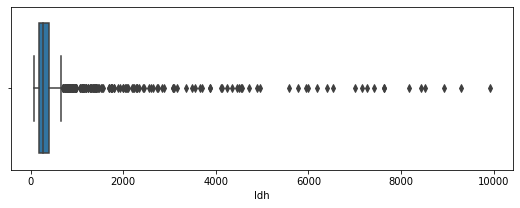

magnesium


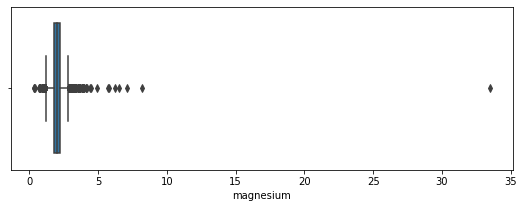

calcium_free


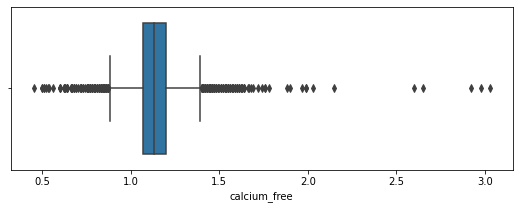

po2_bloodgas


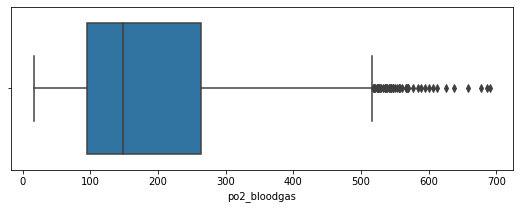

ph_bloodgas


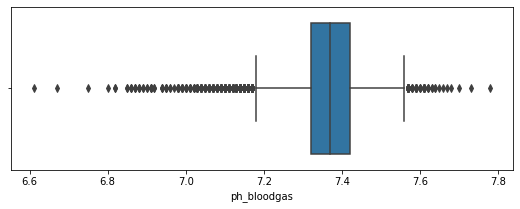

pco2_bloodgas


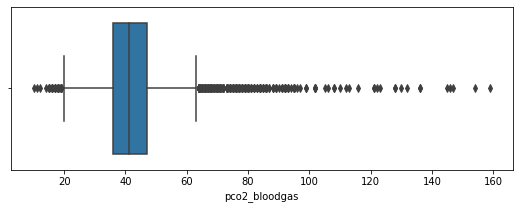

so2_bloodgas


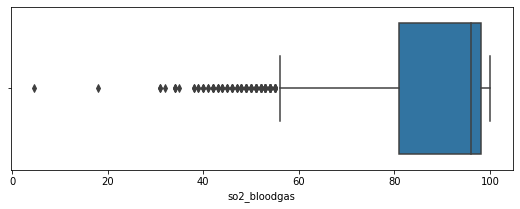

troponin_t


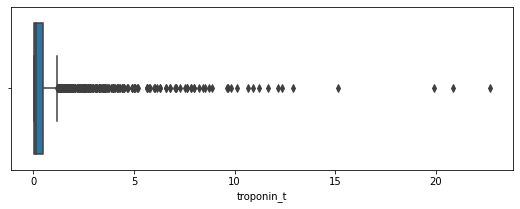

In [32]:
boxplot_univariate_features(labvitals, all_features, '')

In [33]:
labvitals[vitals_features].describe()

,sysbp,diabp,meanbp,resprate,heartrate,spo2_pulsoxy,tempc,cardiacoutput,tvset,tvobserved,tvspontaneous,peakinsppressure,totalpeeplevel,o2flow,fio2
count,100522.000000,100493.000000,100496.000000,113703.000000,113484.000000,110068.000000,29081.000000,5378.000000,8710.000000,9838.000000,3214.000000,1.047000e+04,2178.000000,10657.000000,14701.000000
mean,119.276659,62.902875,78.374438,18.690858,85.405380,97.184168,36.682044,4.945824,496.451713,504.868116,522.328304,2.318461e+02,6.879798,5.394389,59.633402
std,23.473142,15.368169,17.057233,5.438100,19.313855,3.525173,0.853259,1.675234,65.644588,140.828286,448.829068,2.171752e+04,3.172007,6.668045,22.582576
min,10.000000,9.000000,1.000000,1.000000,1.000000,5.000000,22.777778,1.320000,210.000000,0.200000,2.590000,0.000000e+00,0.000000,0.000000,0.000000
25%,103.000000,52.000000,67.000000,15.000000,72.000000,96.000000,36.166667,3.800000,450.000000,440.000000,379.000000,1.500000e+01,5.000000,2.000000,40.000000
50%,117.000000,61.000000,77.000000,18.000000,83.000000,98.000000,36.666667,4.700000,500.000000,503.000000,491.000000,2.000000e+01,5.000000,3.000000,50.000000
75%,134.000000,72.000000,88.000000,22.000000,97.000000,100.000000,37.166667,5.800000,550.000000,562.000000,586.000000,2.500000e+01,8.000000,6.000000,70.000000
max,273.000000,261.000000,299.000000,68.000000,222.000000,100.000000,41.111111,15.400000,800.000000,6750.000000,6000.000000,2.222222e+06,30.400000,100.000000,100.000000


In [34]:
controls_labvitals[vitals_features].describe()

,sysbp,diabp,meanbp,resprate,heartrate,spo2_pulsoxy,tempc,cardiacoutput,tvset,tvobserved,tvspontaneous,peakinsppressure,totalpeeplevel,o2flow,fio2
count,89472.000000,89445.000000,89454.000000,102531.000000,102443.000000,99525.000000,26252.000000,4652.000000,7467.000000,8443.000000,2941.000000,9.078000e+03,1718.000000,9854.000000,12825.000000
mean,120.739645,63.518412,79.128902,18.477277,84.901536,97.237026,36.690599,5.028261,496.172803,503.927463,512.822567,2.636257e+02,6.505821,5.288411,58.701072
std,23.057142,15.229292,16.736996,5.307403,18.773468,3.371765,0.806222,1.698515,64.880541,145.075647,417.934943,2.332323e+04,2.758814,6.522046,22.322031
min,10.000000,9.000000,1.000000,1.000000,17.000000,5.000000,22.777778,1.660000,210.000000,0.200000,2.590000,0.000000e+00,0.000000,0.000000,0.000000
25%,104.000000,53.000000,68.000000,15.000000,72.000000,96.000000,36.200000,3.850000,450.000000,438.000000,376.000000,1.500000e+01,5.000000,2.000000,40.000000
50%,118.000000,62.000000,77.000000,18.000000,83.000000,98.000000,36.666667,4.800000,500.000000,501.000000,491.000000,1.900000e+01,5.000000,3.000000,50.000000
75%,135.000000,72.000000,89.000000,21.000000,96.000000,100.000000,37.166667,5.900000,550.000000,562.000000,584.000000,2.500000e+01,6.700000,5.000000,70.000000
max,265.000000,261.000000,299.000000,68.000000,222.000000,100.000000,40.900000,15.400000,800.000000,6750.000000,6000.000000,2.222222e+06,22.200000,100.000000,100.000000


In [35]:
cases_labvitals[vitals_features].describe()

,sysbp,diabp,meanbp,resprate,heartrate,spo2_pulsoxy,tempc,cardiacoutput,tvset,tvobserved,tvspontaneous,peakinsppressure,totalpeeplevel,o2flow,fio2
count,11050.000000,11048.000000,11042.000000,11172.000000,11041.000000,10543.000000,2829.000000,726.000000,1243.000000,1395.000000,273.000000,1392.000000,460.000000,803.000000,1876.000000
mean,107.430845,57.919473,72.262332,20.651003,90.080246,96.685194,36.602653,4.417590,498.127192,510.561262,624.732601,24.594109,8.276522,6.694894,66.007143
std,23.454498,15.578918,18.348908,6.180966,23.234234,4.705460,1.202450,1.408327,70.063488,111.602279,692.909598,8.045417,4.095357,8.145287,23.316787
min,26.000000,11.000000,2.000000,2.000000,1.000000,28.000000,29.444444,1.320000,280.000000,20.000000,53.000000,0.000000,0.000000,0.000000,0.800000
25%,92.000000,48.000000,61.000000,16.000000,73.000000,95.000000,36.000000,3.400000,450.000000,449.000000,400.000000,19.000000,5.000000,2.000000,50.000000
50%,104.000000,56.000000,70.000000,20.000000,88.000000,98.000000,36.611111,4.300000,500.000000,513.000000,505.000000,24.000000,6.000000,4.000000,60.000000
75%,120.000000,66.000000,81.000000,24.000000,104.000000,100.000000,37.277778,5.100000,550.000000,564.500000,606.000000,29.000000,10.000000,10.000000,100.000000
max,273.000000,169.000000,290.000000,66.000000,215.000000,100.000000,41.111111,12.700000,700.000000,1300.000000,6000.000000,58.000000,30.400000,100.000000,100.000000


In [36]:
labvitals[labs_features].describe()

,albumin,bands,bicarbonate,bilirubin,creatinine,chloride,glucose,hematocrit,hemoglobin,lactate,...,ck_mb,fibrinogen,ldh,magnesium,calcium_free,po2_bloodgas,ph_bloodgas,pco2_bloodgas,so2_bloodgas,troponin_t
count,1320.000000,268.000000,7651.000000,2013.000000,7704.000000,9638.000000,11860.000000,11912.000000,10087.000000,5023.000000,...,2050.000000,1181.000000,1276.000000,6831.000000,4734.000000,8822.000000,9275.000000,8823.000000,2866.000000,1630.000000
mean,3.173030,8.372388,23.919148,2.259414,1.476597,105.371913,144.163744,30.550201,10.360057,2.770999,...,19.778000,253.479255,540.818966,2.003352,1.136996,186.992632,7.360919,42.425366,88.326413,0.698362
std,0.663222,8.939932,4.840774,4.768612,1.638775,6.488375,68.578061,5.872458,2.063715,2.263623,...,43.520678,149.861339,1044.615417,0.564734,0.142549,117.993431,0.093009,10.849586,14.553289,1.771924
min,1.300000,1.000000,5.000000,0.100000,0.100000,58.000000,21.000000,8.400000,2.900000,0.300000,...,1.000000,35.000000,65.000000,0.300000,0.450000,16.000000,6.610000,10.000000,4.500000,0.010000
25%,2.700000,2.000000,21.000000,0.400000,0.700000,102.000000,107.000000,26.500000,8.900000,1.300000,...,3.000000,161.000000,193.750000,1.800000,1.070000,95.000000,7.320000,36.000000,81.000000,0.040000
50%,3.200000,5.000000,24.000000,0.800000,1.000000,106.000000,130.000000,30.100000,10.200000,2.100000,...,6.000000,212.000000,266.000000,2.000000,1.130000,149.000000,7.370000,41.000000,96.000000,0.120000
75%,3.600000,11.000000,27.000000,1.800000,1.425000,109.000000,162.000000,34.300000,11.800000,3.300000,...,14.000000,297.000000,392.250000,2.200000,1.200000,264.000000,7.420000,47.000000,98.000000,0.500000
max,5.200000,63.000000,50.000000,44.100000,24.600000,140.000000,2440.000000,60.900000,19.800000,32.000000,...,450.000000,1167.000000,9920.000000,33.500000,3.030000,691.000000,7.780000,159.000000,100.000000,22.700000


## Correlación entre variables

In [18]:
all_features_corr = full_labvitals[['label'] + all_features].corr()
controls_all_features_corr = controls_full_labvitals[['label'] + all_features].corr()
cases_all_features_corr = cases_full_labvitals[['label'] + all_features].corr()

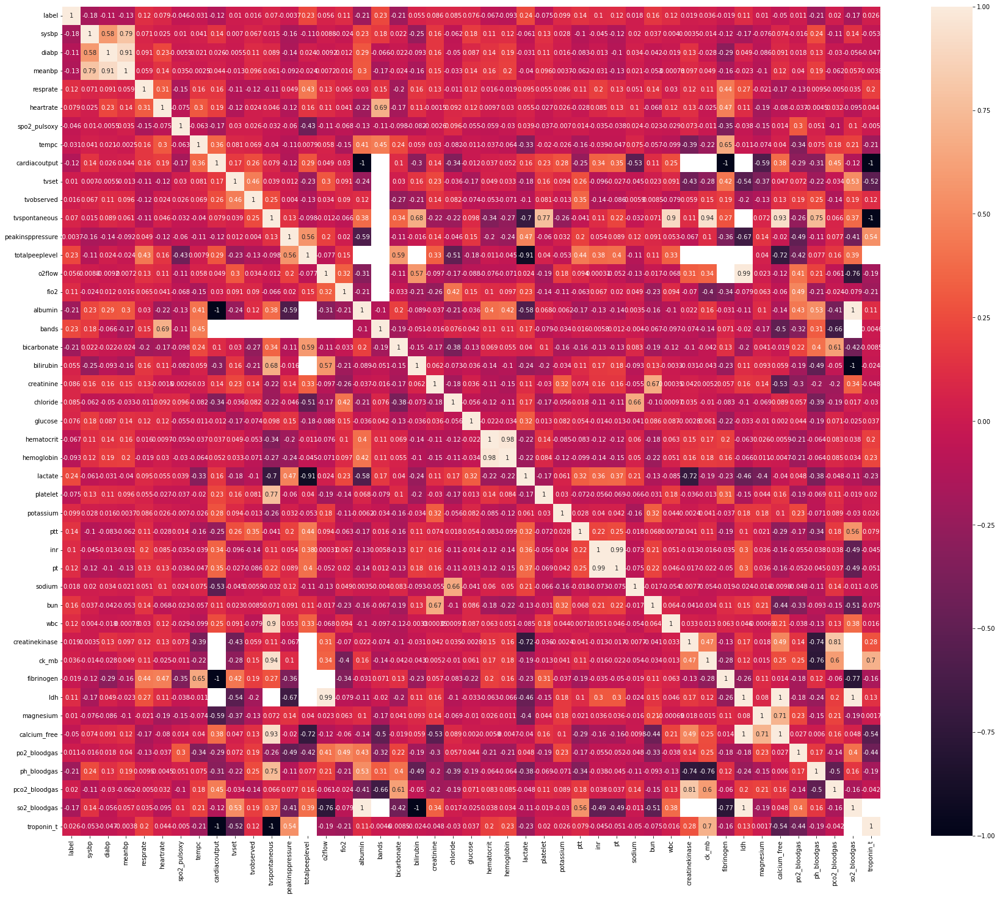

In [19]:
correlation_matrix_heatmap((30,25), all_features_corr, save_path='../images/series_corr.png')

- Casos de control:

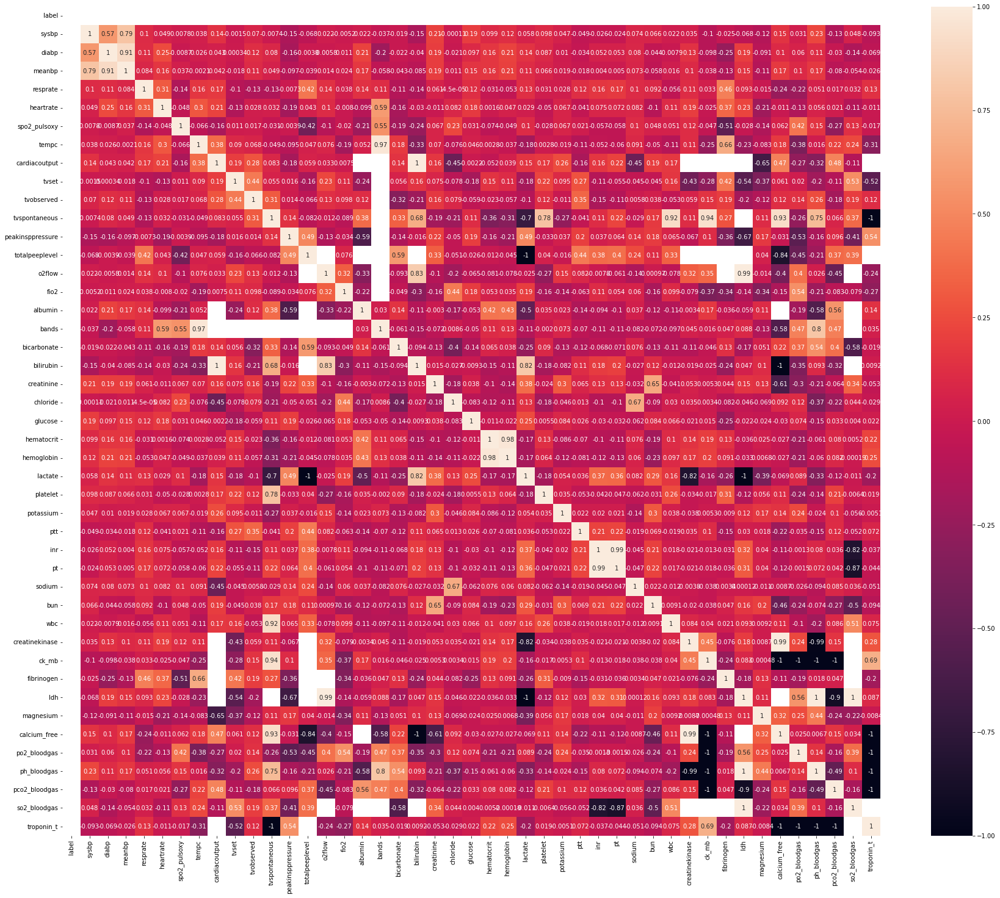

In [40]:
correlation_matrix_heatmap((30,25), controls_all_features_corr)

- Casos de inflammation:

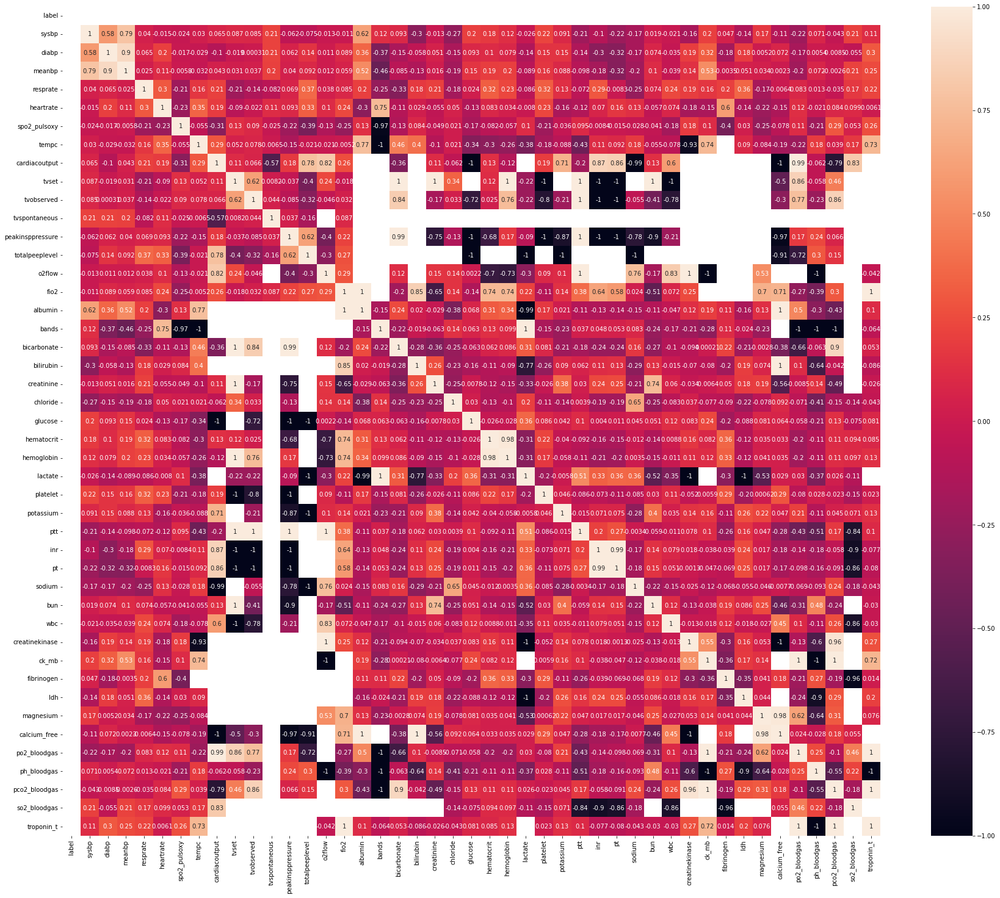

In [41]:
correlation_matrix_heatmap((30,25), cases_all_features_corr)

> Gráfico de dispersión:

Para los gráficos de dispersión tomaremos las variables correspondientes a vitals y labs con mayor correlación para estudiarlas.

In [20]:
n_most_correlated_corr = get_n_most_correlated_features(all_features_corr.fillna(0), 40)
n_most_correlated_corr

{('ldh', 'calcium_free'): 1.0000000000000002,
 ('bilirubin', 'so2_bloodgas'): -1.0000000000000002,
 ('cardiacoutput', 'albumin'): -1.0000000000000002,
 ('troponin_t', 'tvspontaneous'): -1.0000000000000002,
 ('so2_bloodgas', 'ldh'): 1.0,
 ('cardiacoutput', 'fibrinogen'): -1.0,
 ('so2_bloodgas', 'albumin'): 1.0,
 ('cardiacoutput', 'troponin_t'): -0.9999999999999999,
 ('pt', 'inr'): 0.993445311895954,
 ('o2flow', 'ldh'): 0.9870730752263264,
 ('hematocrit', 'hemoglobin'): 0.9765327466567558,
 ('tvspontaneous', 'ck_mb'): 0.9449318592933836,
 ('calcium_free', 'tvspontaneous'): 0.9265218367173433,
 ('totalpeeplevel', 'lactate'): -0.9101932321389825,
 ('meanbp', 'diabp'): 0.9093834305487021,
 ('tvspontaneous', 'wbc'): 0.9031170870369597,
 ('creatinekinase', 'pco2_bloodgas'): 0.8063283718488962,
 ('sysbp', 'meanbp'): 0.7939499099888158,
 ('so2_bloodgas', 'fibrinogen'): -0.7729787821969011,
 ('tvspontaneous', 'platelet'): 0.7713355459403404,
 ('ph_bloodgas', 'ck_mb'): -0.7592593536421314,
 ('so2

Obtenemos los gráficos de dispersión para las variables más relacionadas entre sí.

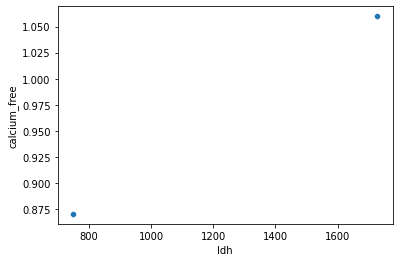

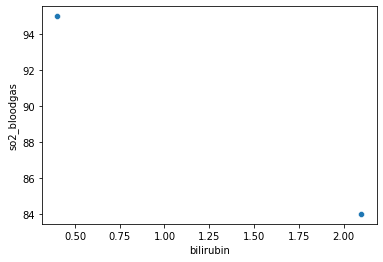

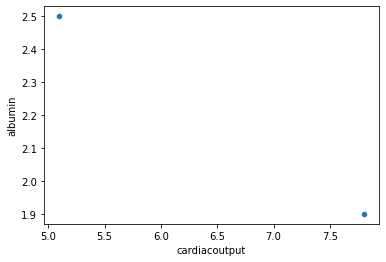

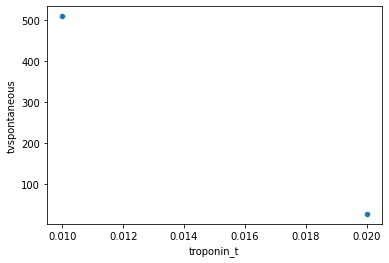

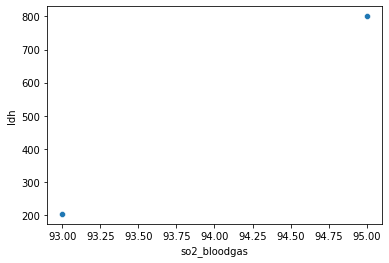

...

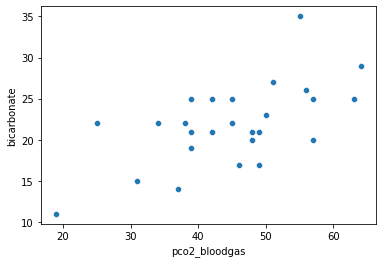

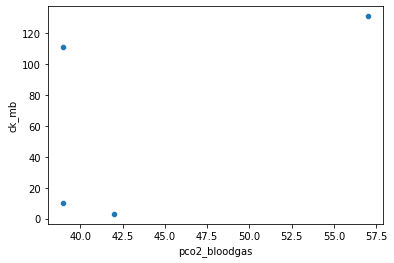

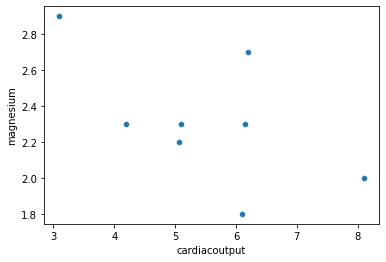

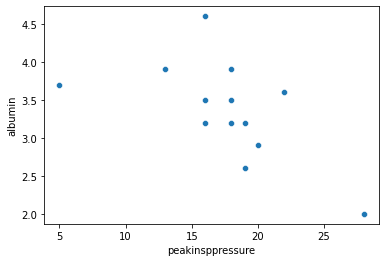

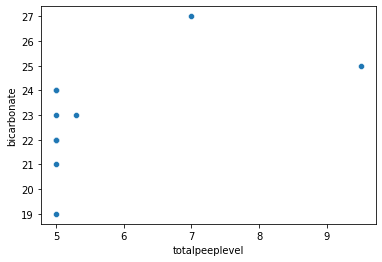

In [21]:
for f1, f2 in n_most_correlated_corr.keys():
    sns.scatterplot(data=full_labvitals, x=f1, y=f2)
    plt.show()

In [27]:
nans_percent_corr = get_nans_percent_per_variables_pairs(n_most_correlated_corr.keys(), full_labvitals)

In [28]:
nans_percent_corr.describe()

,corr,var1_nans_percent,var2_nans_percent,both_not_nans_percent
count,41.0,41.000000,41.000000,41.000000
mean,0.0,92.813961,94.974185,3.115754
std,0.0,14.751925,11.749250,11.809985
min,0.0,37.109900,44.307500,0.001100
25%,0.0,95.110500,95.760000,0.001700
50%,0.0,97.216400,98.218900,0.003900
75%,0.0,98.411700,99.268500,0.008300
max,0.0,99.292900,99.851500,54.266600


In [29]:
for q in range(100):
    if np.percentile(nans_percent_corr['both_not_nans_percent'], q) >= 1:
        print(q)
        break

86


Para la gran mayoría de variables que inicialmente considerabamos como muy correlacionadas entre sí podemos ver que no se superan las cien entradas, por lo que tomaremos aquellas que superen dicho umbral.

In [22]:
n_most_correlated_corr_over_100 = get_most_correlated_features(full_labvitals, all_features_corr, 100, 250)

pt inr 0.993445311895954


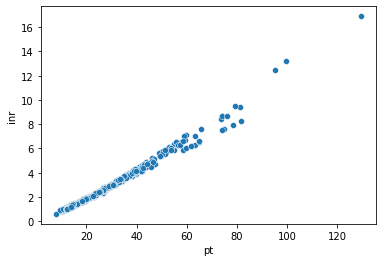

hematocrit hemoglobin 0.9765327466567558


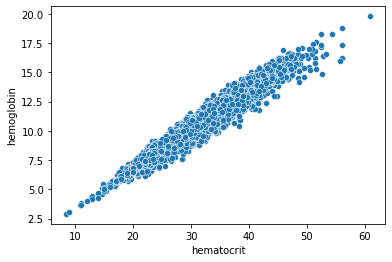

meanbp diabp 0.9093834305487021


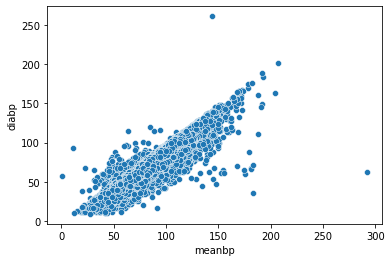

sysbp meanbp 0.7939499099888158


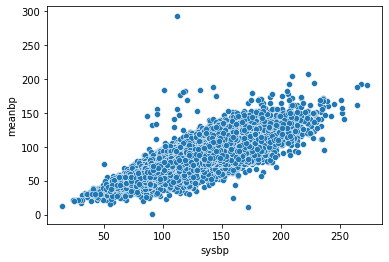

troponin_t ck_mb 0.6991405705454584


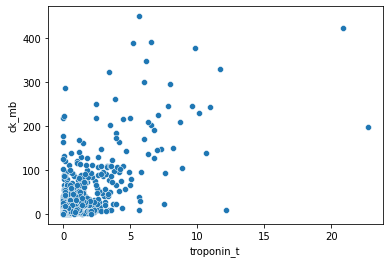

bun creatinine 0.6659193498641616


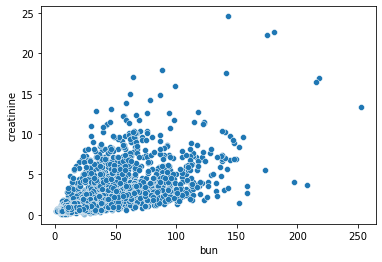

chloride sodium 0.6604952097392731


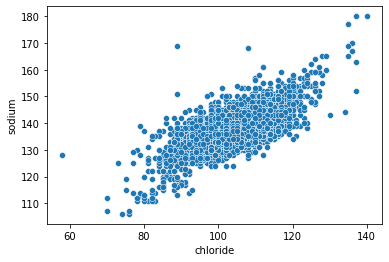

sysbp diabp 0.5809834623237919


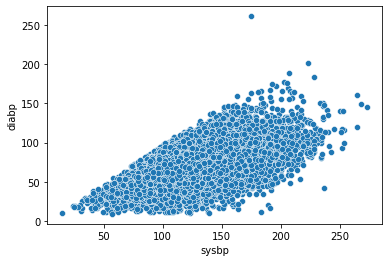

peakinsppressure totalpeeplevel 0.5553121846576767


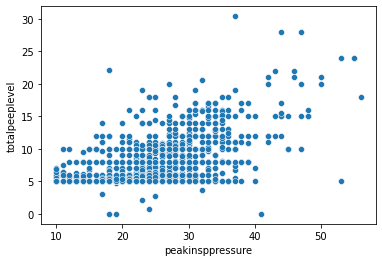

ph_bloodgas pco2_bloodgas -0.5013414729547596


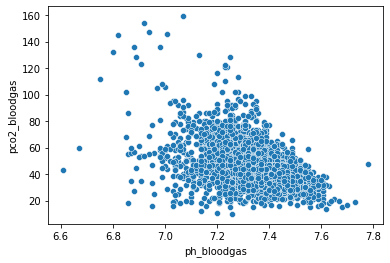

creatinekinase ck_mb 0.4689665878644094


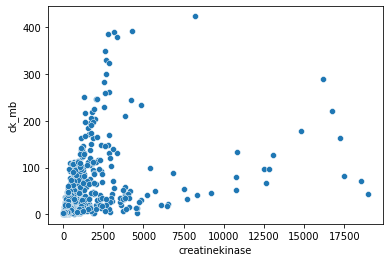

tvset tvobserved 0.46028189579154744


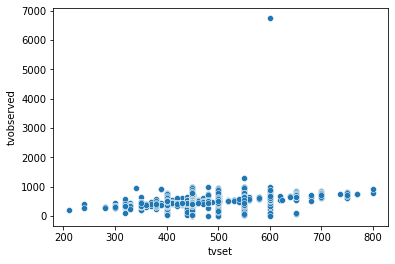

spo2_pulsoxy totalpeeplevel -0.43233967415268565


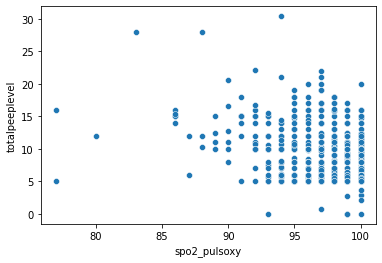

totalpeeplevel resprate 0.43211268443560863


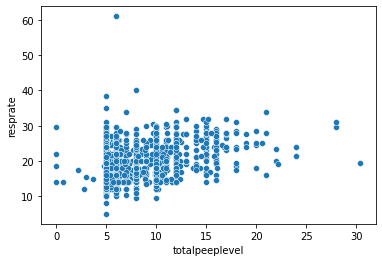

hemoglobin albumin 0.4185612924894147


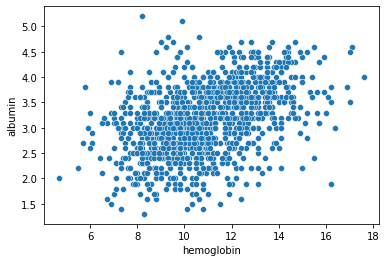

so2_bloodgas po2_bloodgas 0.4036074044614615


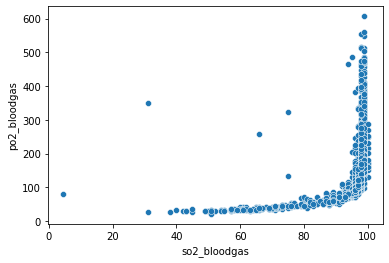

albumin hematocrit 0.3972798670174669


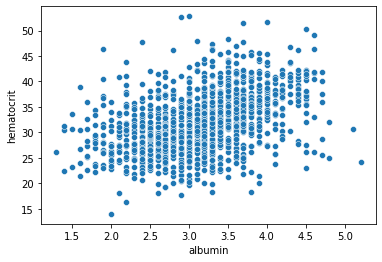

chloride ph_bloodgas -0.3874298044622044


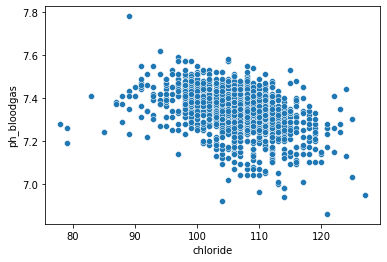

chloride bicarbonate -0.38456230306696454


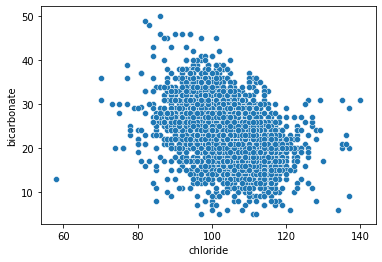

lactate ph_bloodgas -0.3773245324598813


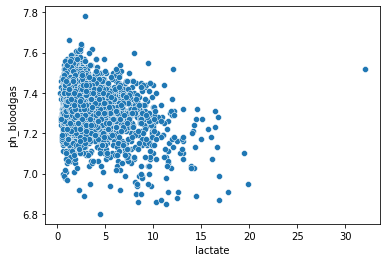

pt lactate 0.3745324779919169


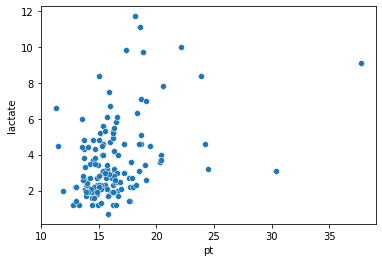

tempc cardiacoutput 0.3627095731768756


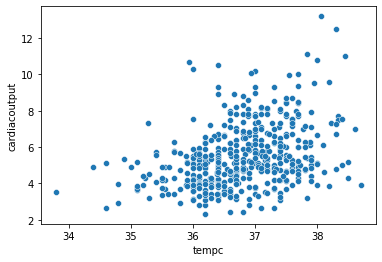

inr lactate 0.36163266328322985


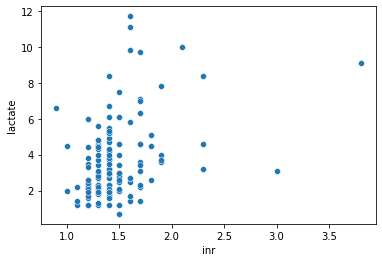

ptt ph_bloodgas -0.3383421128490455


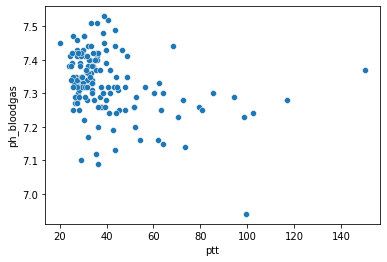

bun potassium 0.32488113620471853


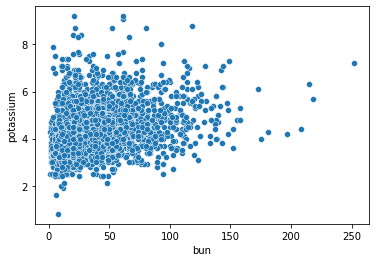

fio2 o2flow 0.3235535149995545


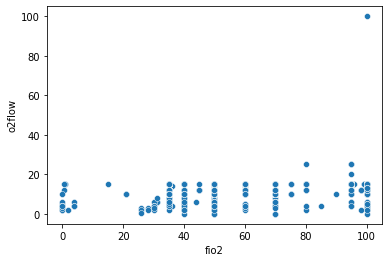

ptt lactate 0.3214867247820503


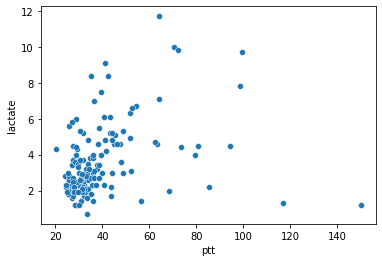

potassium creatinine 0.3161216509132055


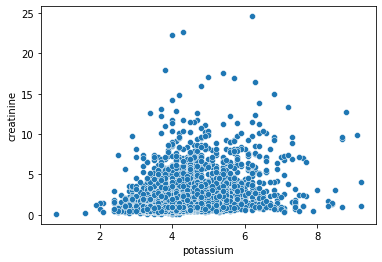

glucose lactate 0.3158903657900511


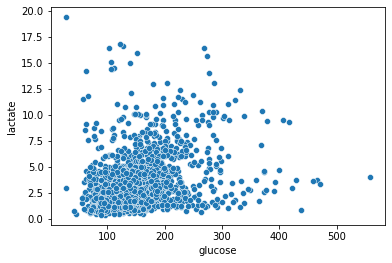

resprate heartrate 0.31271163103133126


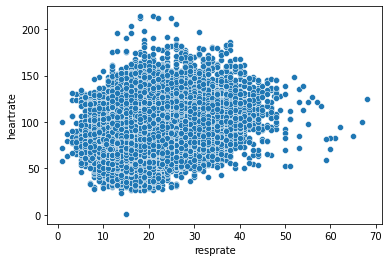

platelet fibrinogen 0.3072604298806996


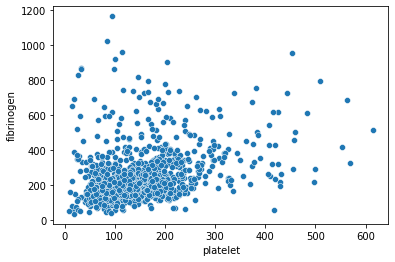

tempc heartrate 0.3020501143486791


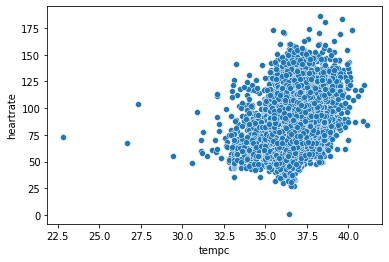

inr ldh 0.2994465994002767


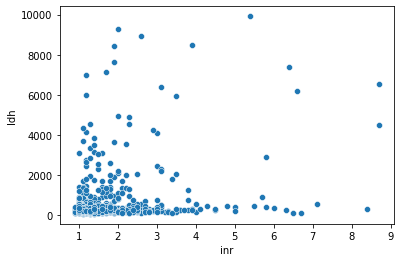

pt ldh 0.2989694352713254


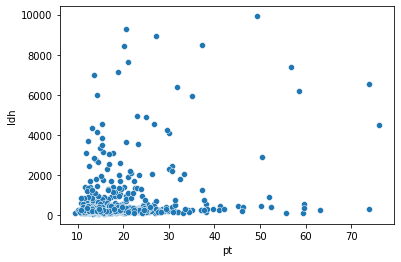

po2_bloodgas spo2_pulsoxy 0.29737922048057824


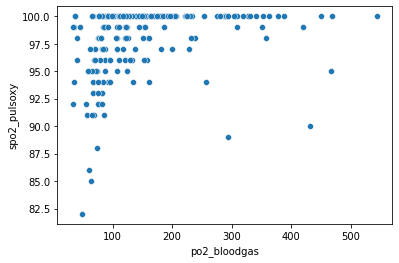

ptt calcium_free -0.28885774677168585


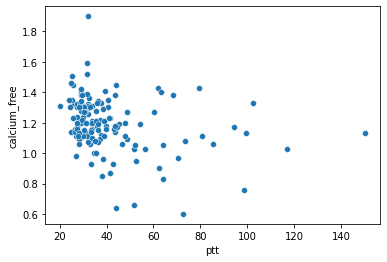

cardiacoutput totalpeeplevel 0.2874447658806808


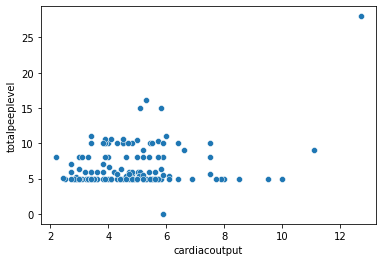

troponin_t creatinekinase 0.27686473342514784


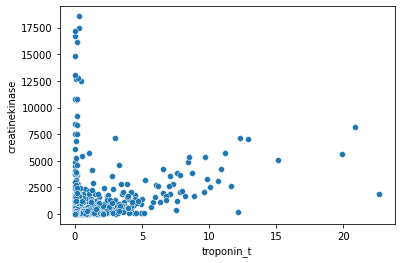

ck_mb fibrinogen -0.27575428433242816


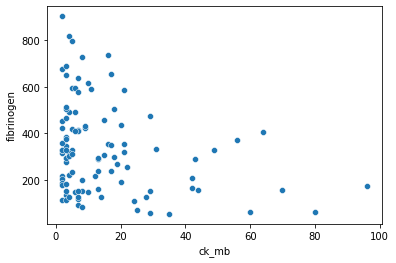

ldh fibrinogen -0.258130101372059


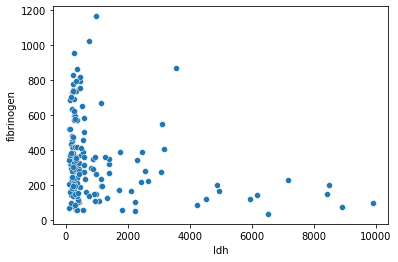

cardiacoutput tvobserved 0.25596401653665946


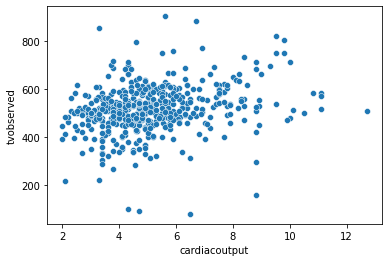

ptt pt 0.24959728544968834


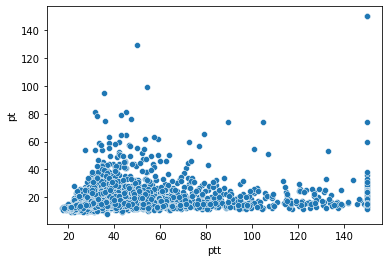

tvobserved tvspontaneous 0.2495278167877914


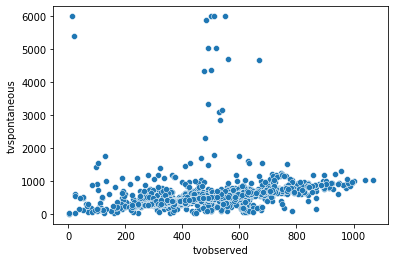

ph_bloodgas sysbp 0.24273693017526973


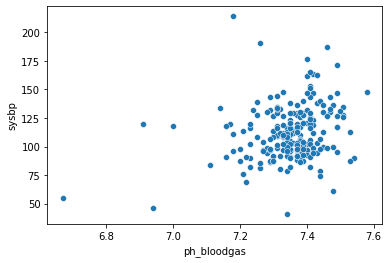

label lactate 0.24043303771220403


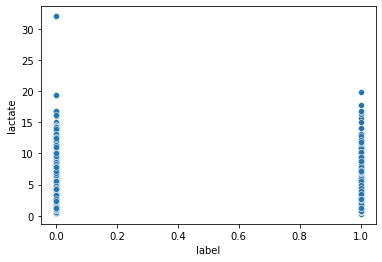

bicarbonate tempc 0.23596950505838263


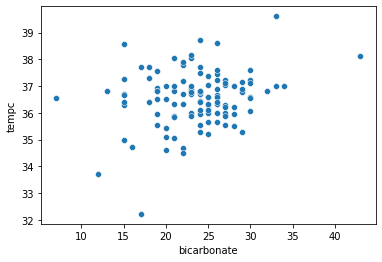

label bands 0.23486934865365397


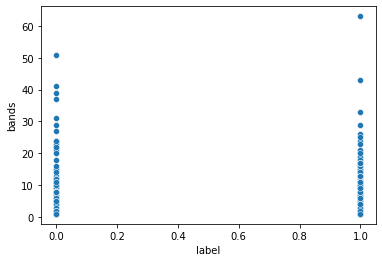

fibrinogen lactate -0.23289915397597727


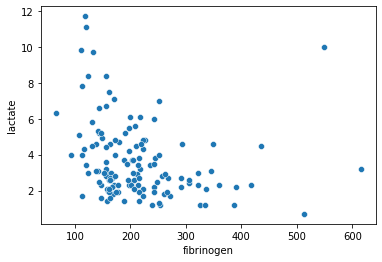

po2_bloodgas potassium 0.23102743712290214


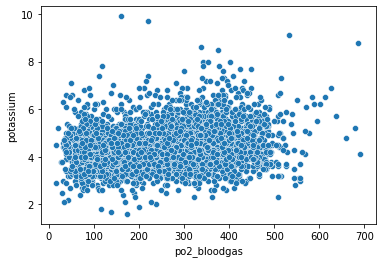

hemoglobin troponin_t 0.22965664871523556


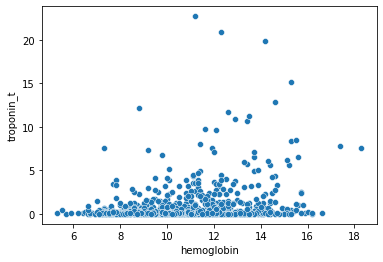

fibrinogen bilirubin -0.22903586532085735


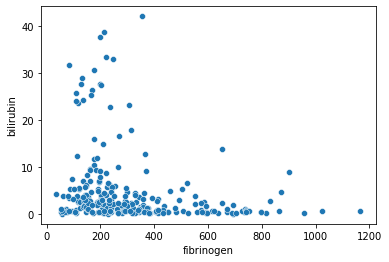

tvset totalpeeplevel -0.22840187363264897


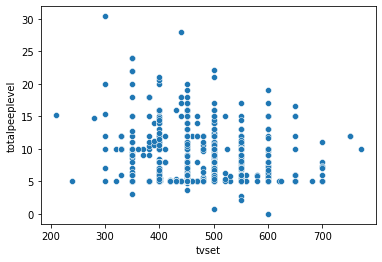

label totalpeeplevel 0.22789950557119754


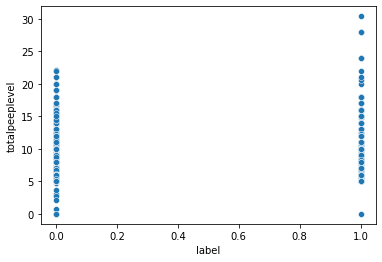

diabp heartrate 0.22779858832480346


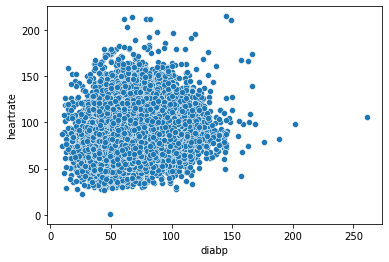

glucose fibrinogen -0.22484509034900121


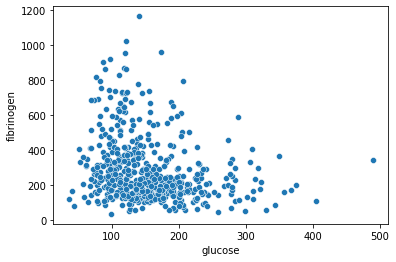

ptt inr 0.22323931358110127


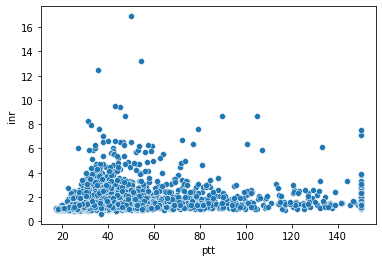

bun hemoglobin -0.22050409367535084


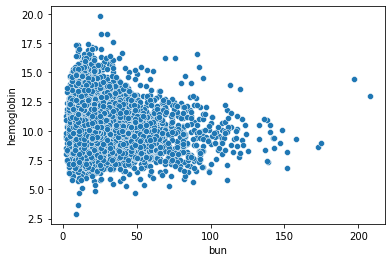

lactate hematocrit -0.2187316078386853


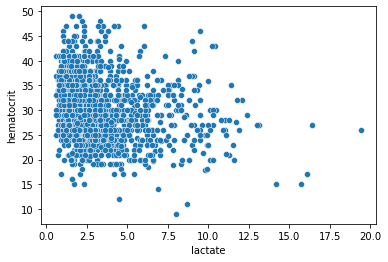

lactate hemoglobin -0.21869270597499


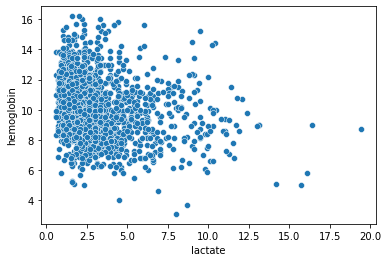

bun pt 0.21814873243693098


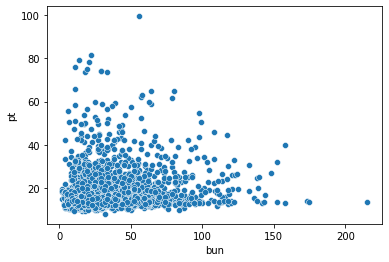

wbc calcium_free 0.21363254859704497


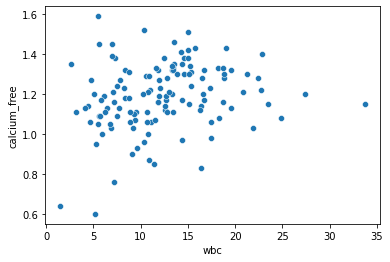

label ph_bloodgas -0.21276757576241104


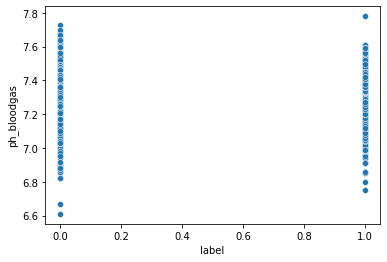

sodium lactate 0.2124737484437294


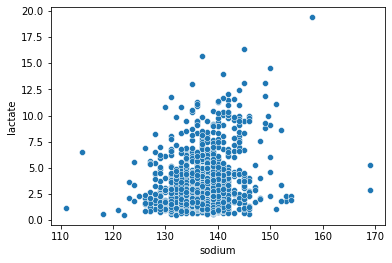

chloride albumin -0.21246407207805296


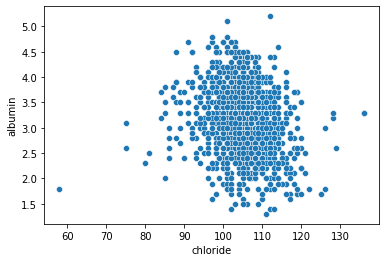

label albumin -0.21222306888354217


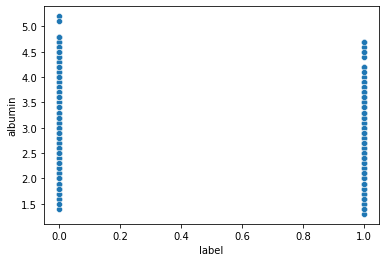

inr bun 0.2108416866330146


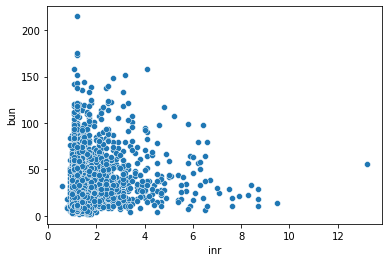

bicarbonate label -0.20782392678836065


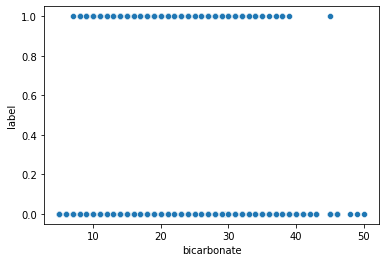

bun magnesium 0.20692720542107676


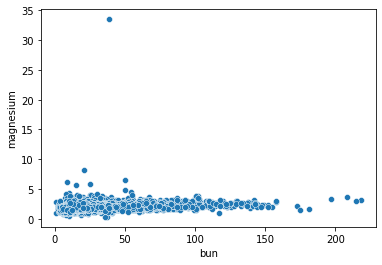

hematocrit po2_bloodgas -0.2058747981326488


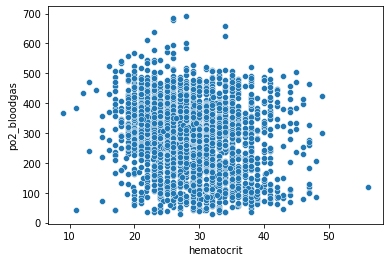

hemoglobin po2_bloodgas -0.2051504848076496


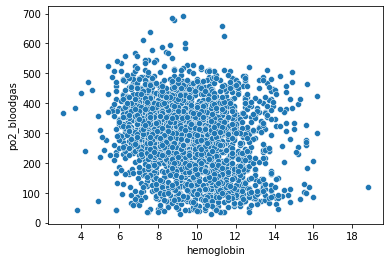

meanbp hemoglobin 0.20252362490296758


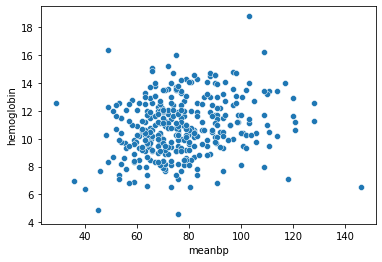

inr resprate 0.2017268349036911


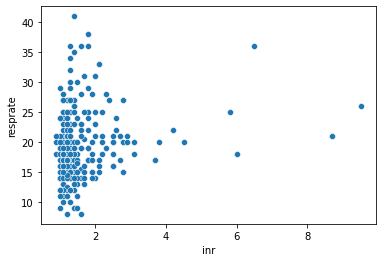

fibrinogen hematocrit 0.20143730197625223


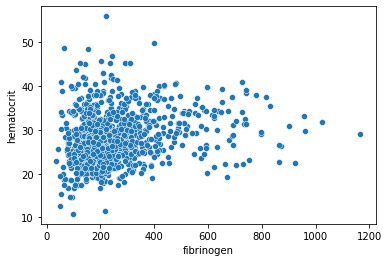

bicarbonate albumin 0.20063118436921698


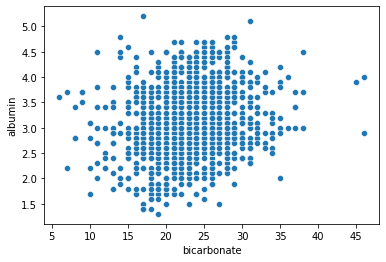

troponin_t hematocrit 0.19764726547453326


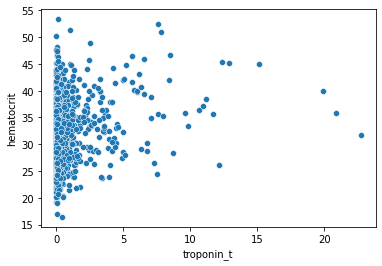

bicarbonate ldh -0.1961113429377504


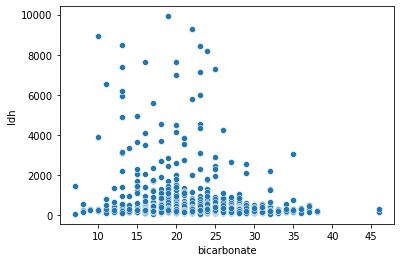

bicarbonate resprate -0.19574976120362317


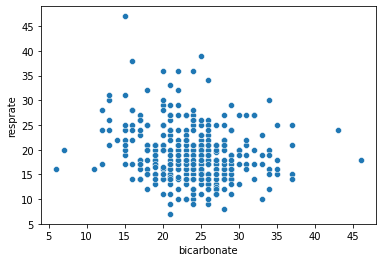

bilirubin platelet -0.19571311536775948


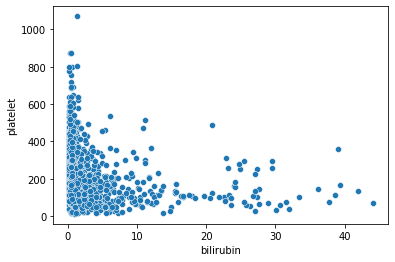

ph_bloodgas glucose -0.194193301923947


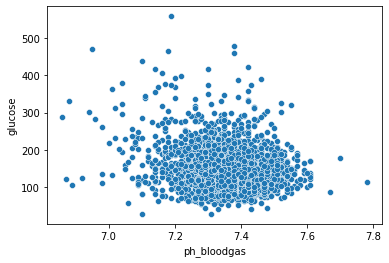

heartrate cardiacoutput 0.19317043273152246


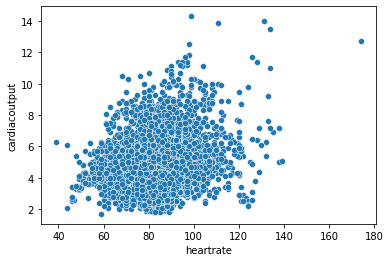

pco2_bloodgas chloride -0.1928121701474197


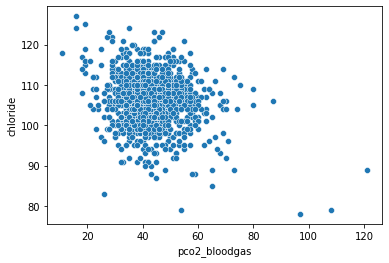

bicarbonate bands -0.1918617112756872


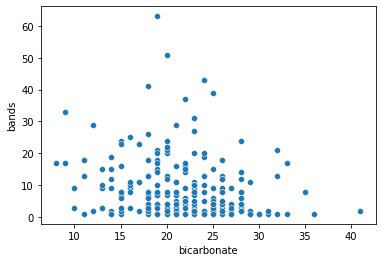

In [23]:
for (f1, f2), corr in n_most_correlated_corr_over_100.items():
    print(f1,f2,corr)
    sns.scatterplot(data=full_labvitals, x=f1, y=f2)
    plt.show()

In [24]:
nans_percent_corr_over_100 = get_nans_percent_per_variables_pairs(n_most_correlated_corr_over_100.keys(), full_labvitals)

In [25]:
nans_percent_corr_over_100.describe()

,corr,var1_nans_percent,var2_nans_percent,both_not_nans_percent
count,82.0,82.000000,82.000000,82.000000
mean,0.0,84.679659,87.739468,4.851633
std,0.0,27.135660,21.912204,12.872089
min,0.0,0.000000,0.000000,0.057100
25%,0.0,93.620075,94.164225,0.288900
50%,0.0,95.738400,95.749200,0.895250
75%,0.0,96.668300,98.793000,3.117350
max,0.0,99.345500,99.851500,60.332100


In [26]:
for q in range(100):
    if np.percentile(nans_percent_corr_over_100['both_not_nans_percent'], q) >= 1:
        print(q)
        break

52


## inflammation onset per hour

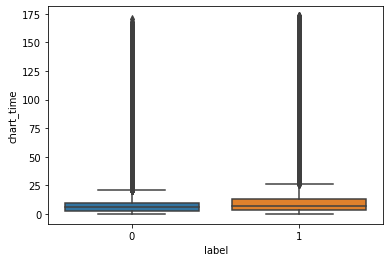

In [30]:
sns.boxplot(y=full_labvitals['chart_time'], x=full_labvitals['label'])
plt.show()

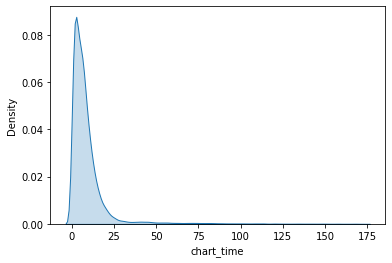

In [31]:
sns.kdeplot(full_labvitals['chart_time'], shade = True)
plt.show()

In [33]:
grouped_sum_chart_time = get_sum_grouped_by_chart_time(full_labvitals)

In [34]:
grouped_sum_chart_time['label'][0:25]

0     1292
1     1509
2     1567
3     1458
4     1416
5     1426
6     1542
7     1352
8     1117
9      967
10     881
11     651
12     555
13     527
14     369
15     293
16     266
17     250
18     192
19     210
20     155
21     123
22     109
23      76
24     101
Name: label, dtype: int64

In [35]:
grouped_sum_chart_time['label'].describe()

count     173.000000
mean      120.167630
std       330.701265
min         1.000000
25%         7.000000
50%        16.000000
75%        29.000000
max      1567.000000
Name: label, dtype: float64

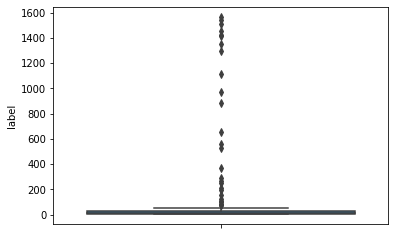

In [36]:
sns.boxplot(y=grouped_sum_chart_time['label'])
plt.show()

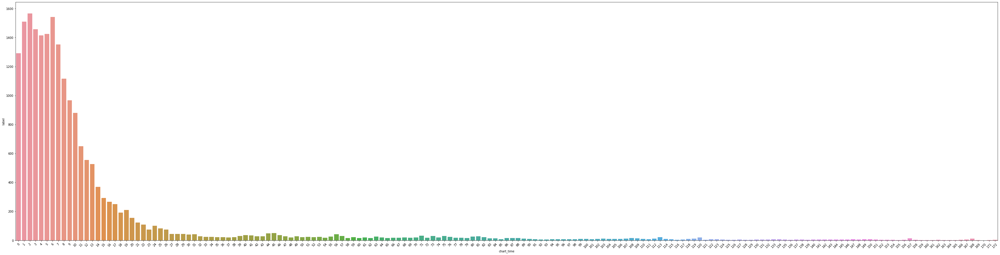

In [37]:
# Casos por hora
fig = plt.figure(figsize=(60,15))
sns.barplot(x='chart_time', y='label', data=grouped_sum_chart_time)
plt.xticks(rotation=45)
plt.savefig('../images/hist_label_chart_time.png', bbox_inches='tight')
plt.show()

In [40]:
# Con la primera aparición de inflammation por paciente (cuantos sufren inflammation en cada hora para las horas en las que los pacientes comienzan a padecer inflammation)
first_inflammation_appearance = get_first_inflammation_appearance_entry(full_labvitals)

In [41]:
first_inflammation_appearance['chart_time'].describe()

count    570.000000
mean       2.692982
std       12.608006
min        0.000000
25%        0.000000
50%        0.000000
75%        1.000000
max      125.000000
Name: chart_time, dtype: float64

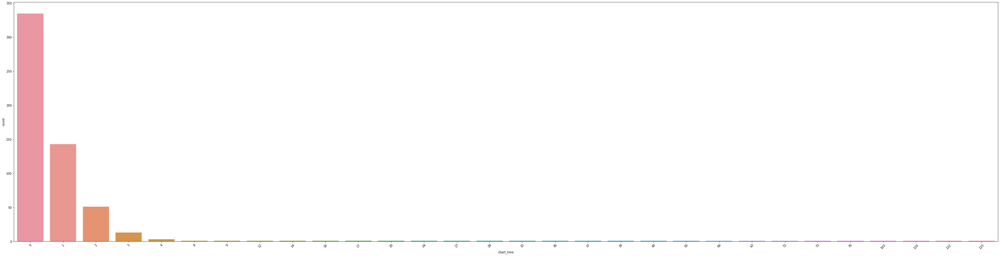

In [104]:
fig = plt.figure(figsize=(60,15))
sns.countplot(x='chart_time', data=first_inflammation_appearance)
plt.xticks(rotation=45)
plt.savefig('../images/hist_first_label_chart_time.png', bbox_inches='tight')
plt.show()

- Proporción (ratio) de casos de control frente a casos de inflammation por hora (0s/1s): 

In [45]:
controls_cases_ratios = get_controls_cases_ratio_per_hour(full_labvitals)
controls_cases_ratios

{0: 0.7527863777089784,
 1: 0.7617848464766954,
 2: 0.6341203999149116,
 3: 0.6105166895290353,
 4: 0.5779661016949152,
 5: 0.5604020570359982,
 6: 0.4945092952875054,
 7: 0.49038461538461536,
 8: 0.4842733512384363,
 9: 0.4860392967942089,
 10: 0.43768444948921675,
 11: 0.5104966717869943,
 12: 0.47903903903903905,
 13: 0.4261859582542694,
 14: 0.48997289972899727,
 15: 0.5326507394766781,
 16: 0.48596491228070177,
 17: 0.3909333333333333,
 18: 0.43263888888888885,
 19: 0.3593650793650794,
 20: 0.40344086021505376,
 21: 0.40704607046070457,
 22: 0.3743119266055046,
 23: 0.42894736842105263,
 24: 0.2811881188118812,
 25: 0.28888888888888886,
 26: 0.2577777777777778,
 27: 0.32,
 28: 0.31555555555555553,
 29: 0.3212121212121212,
 30: 0.2943089430894309,
 31: 0.2558139534883721,
 32: 0.3476190476190476,
 33: 0.3722222222222222,
 34: 0.3253333333333333,
 35: 0.3536231884057971,
 36: 0.38181818181818183,
 37: 0.44761904761904764,
 38: 0.4,
 39: 0.30666666666666664,
 40: 0.2722222222222222,


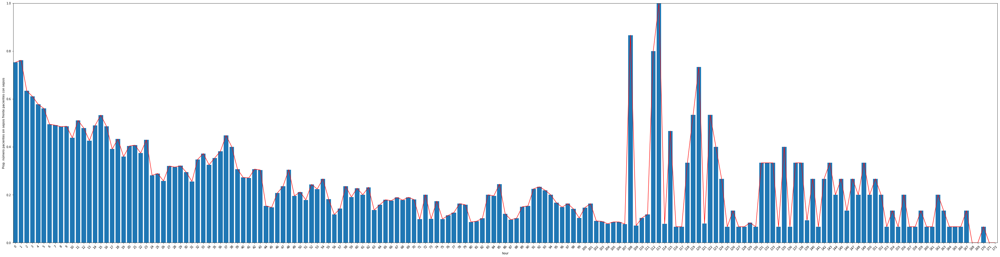

In [173]:
fig = plt.figure(figsize=(60,15))
br = plt.bar(hours, controls_cases_ratios.values())
bars_middle_top_points_x, bars_middle_top_points_y = get_bars_midde_top_points(br)
plt.plot(bars_middle_top_points_x, bars_middle_top_points_y, color='red')
plt.xticks(hours, rotation=45)
plt.xlabel('hour')
plt.ylabel('Prop. número pacientes sin inflammation frente pacientes con inflammation')
plt.autoscale(tight=True)
plt.savefig('../images/prop_controls_inflammation_hour.png', bbox_inches='tight')
plt.show()

- Proporción (ratio) de casos de inflammation frente a casos de control por hora (1s/0s): 

In [109]:
cases_controls_ratios = [1/ratio if ratio!=0 else 0 for ratio in controls_cases_ratios.values()]
cases_controls_ratios = normalize(cases_controls_ratios)

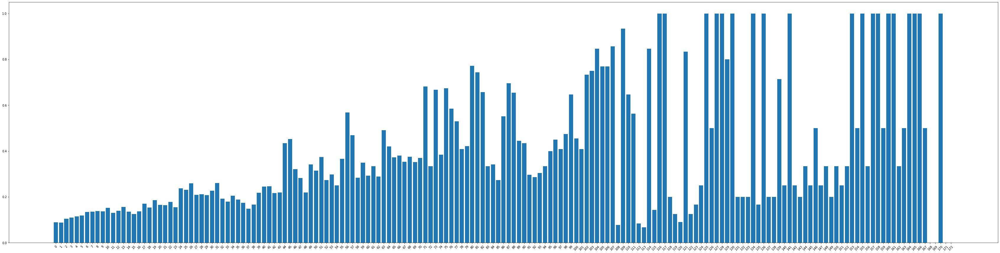

In [110]:
fig = plt.figure(figsize=(60,15))
plt.bar(hours, cases_controls_ratios)
plt.xticks(hours, rotation=45)
plt.show()

In [113]:
rounded_chart_time_filtered = rounded_chart_time[rounded_chart_time['chart_time'] < 19].copy()
removed_outliers_rounded_chart_time = rounded_chart_time_filtered.copy()
for column in removed_outliers_rounded_chart_time.columns:
    removed_outliers_rounded_chart_time = replace_outliers(removed_outliers_rounded_chart_time, column)

sysbp


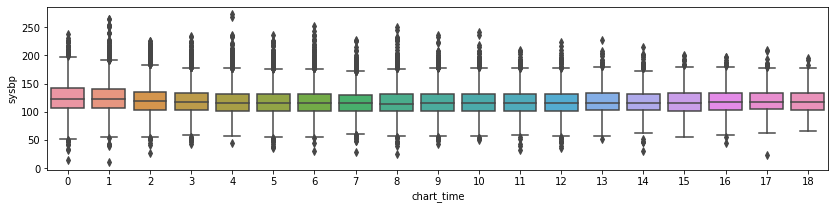

diabp


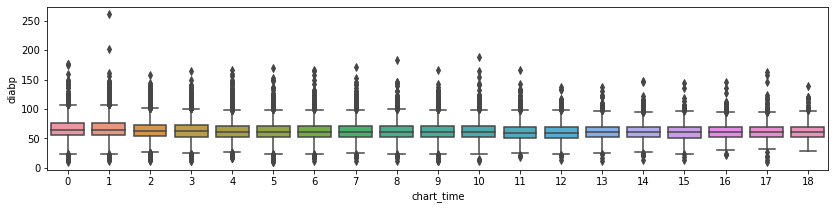

meanbp


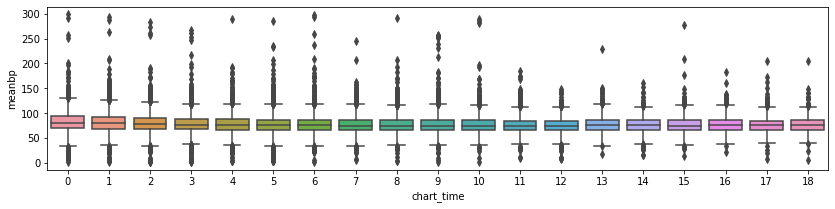

resprate


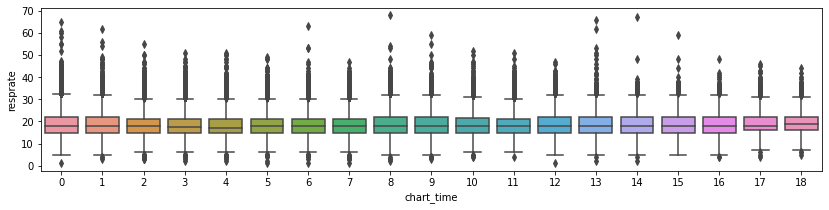

heartrate


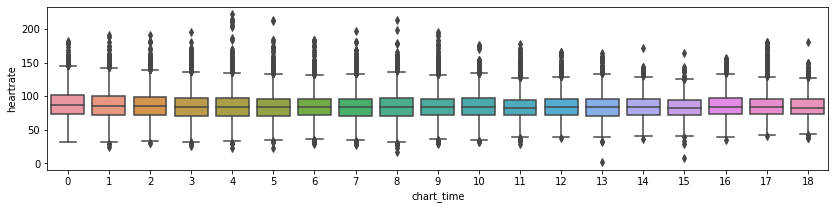

spo2_pulsoxy


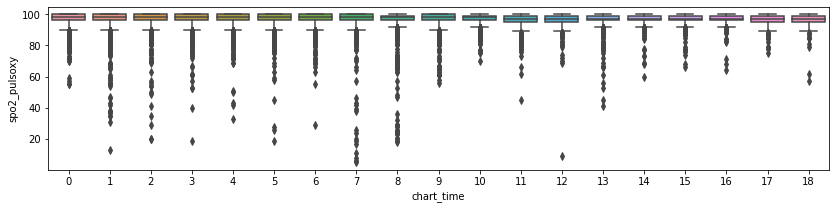

tempc


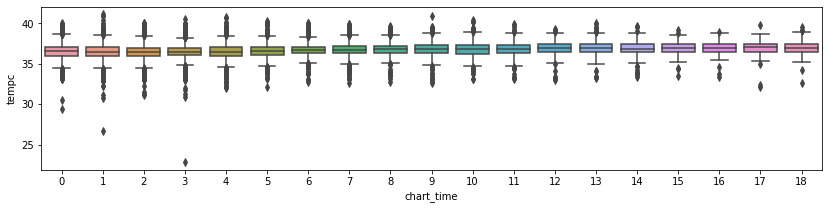

cardiacoutput


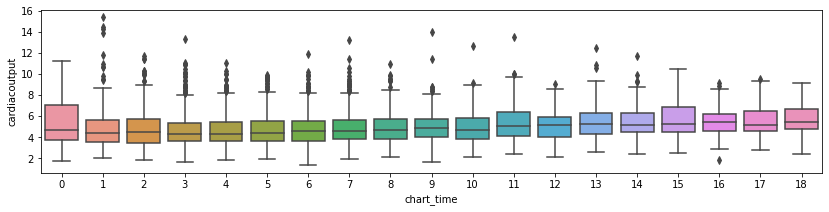

tvset


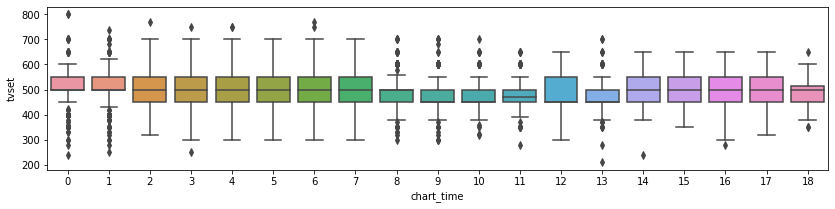

tvobserved


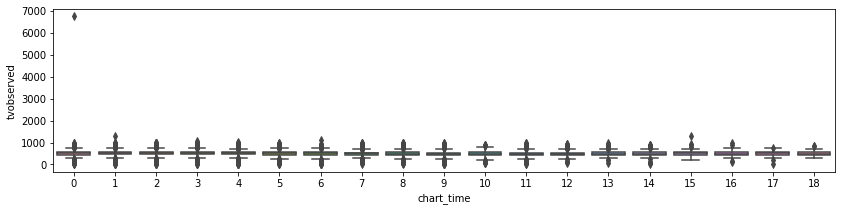

tvspontaneous


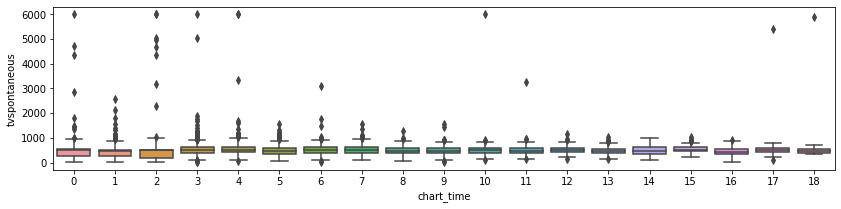

peakinsppressure


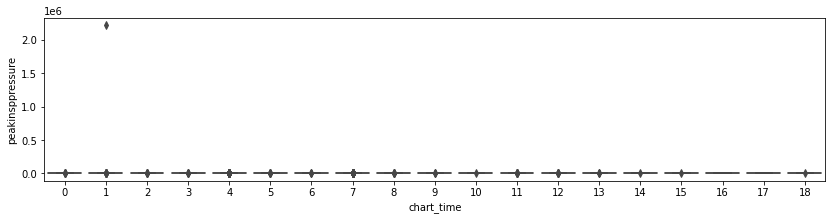

totalpeeplevel


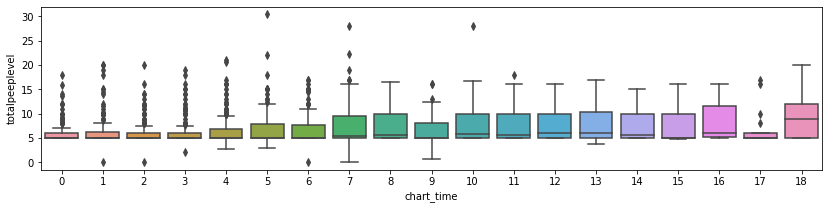

o2flow


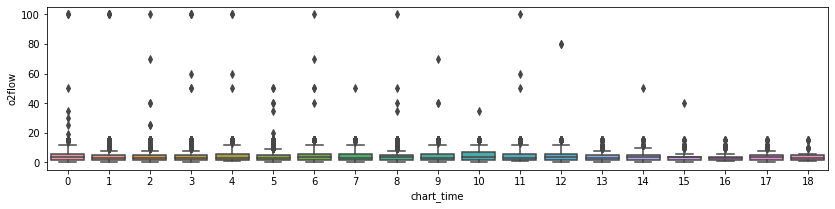

fio2


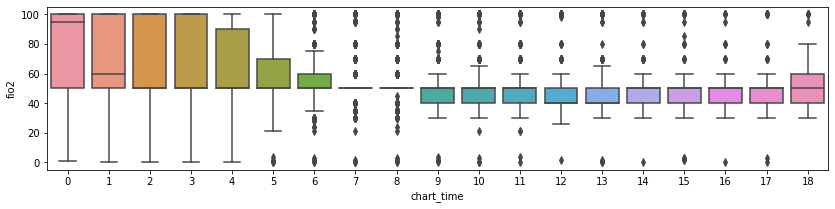

albumin


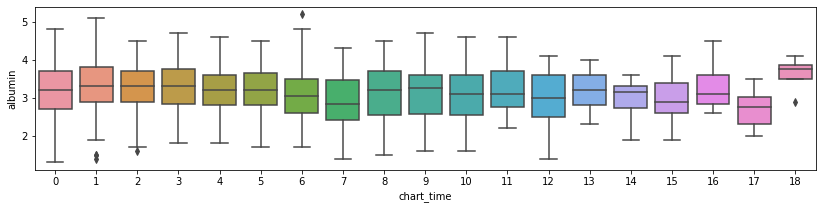

bands


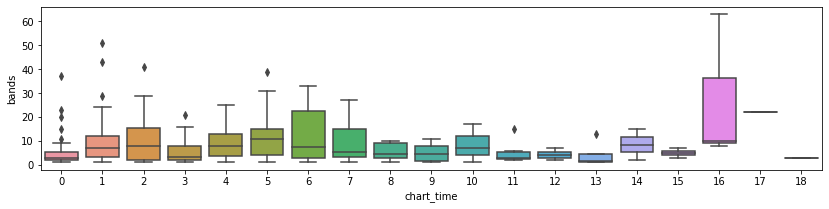

bicarbonate


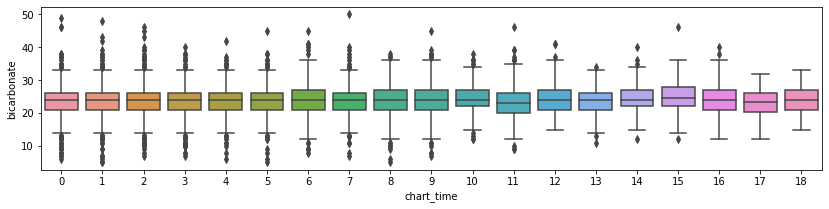

bilirubin


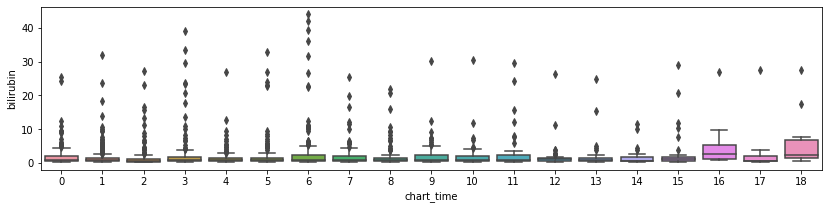

creatinine


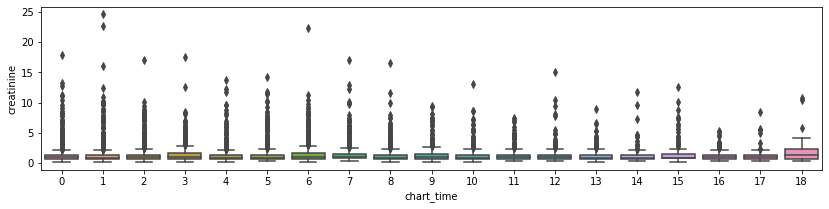

chloride


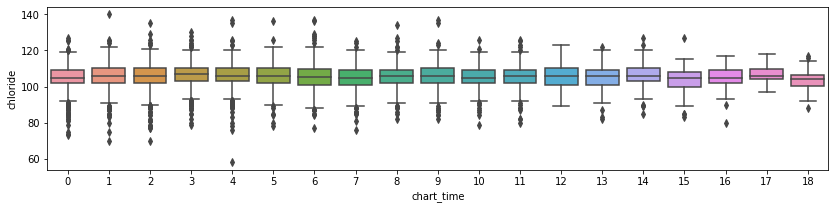

glucose


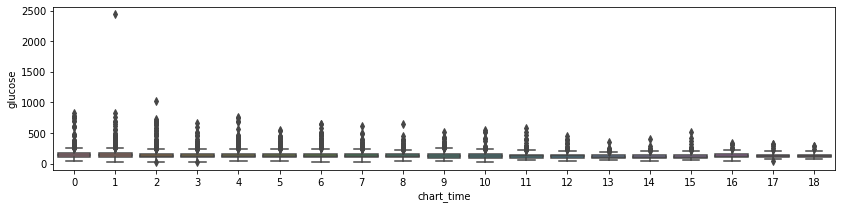

hematocrit


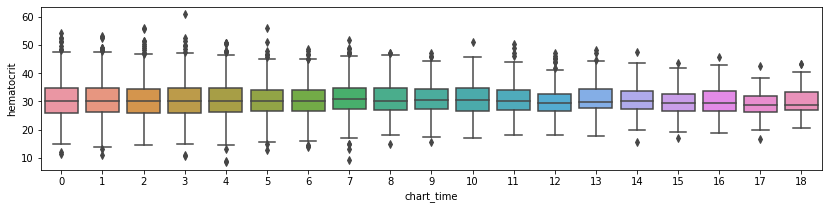

hemoglobin


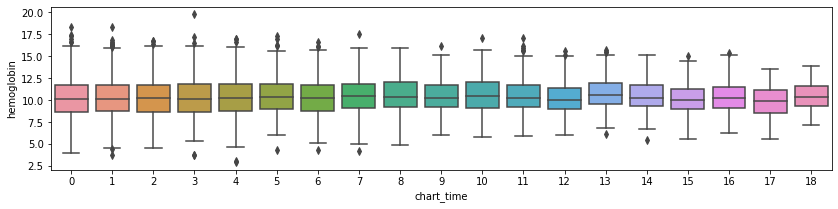

lactate


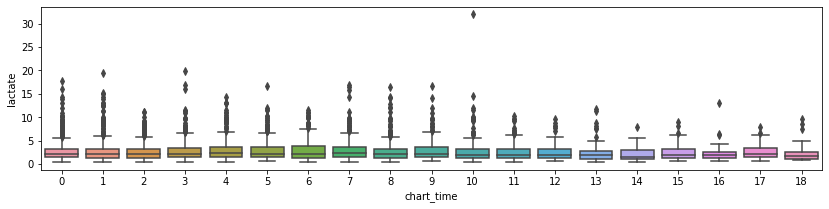

platelet


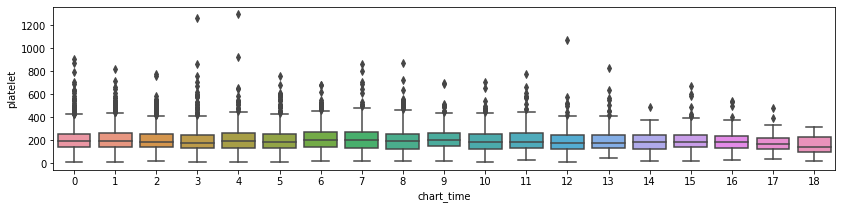

potassium


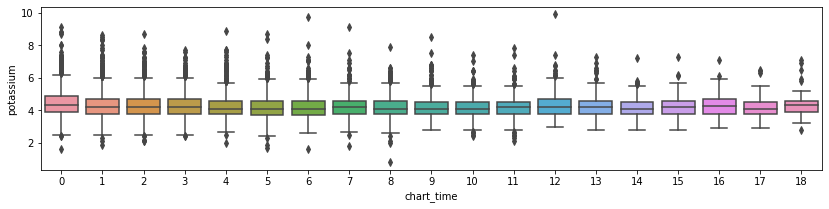

ptt


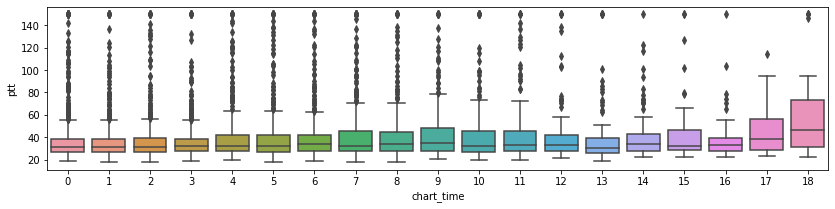

inr


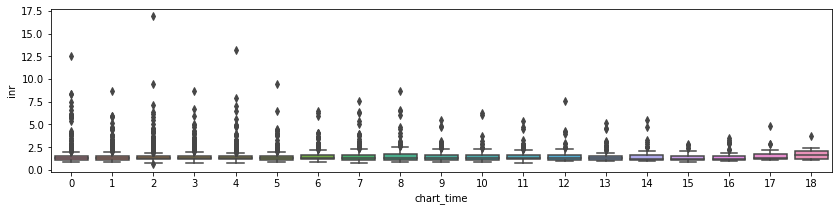

pt


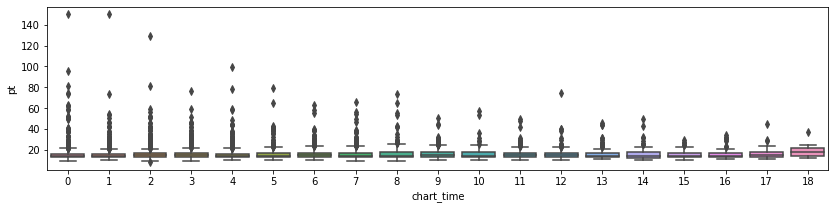

sodium


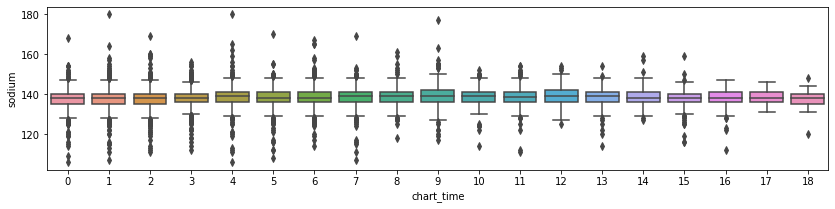

bun


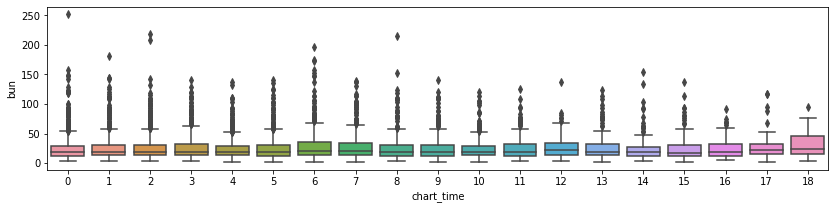

wbc


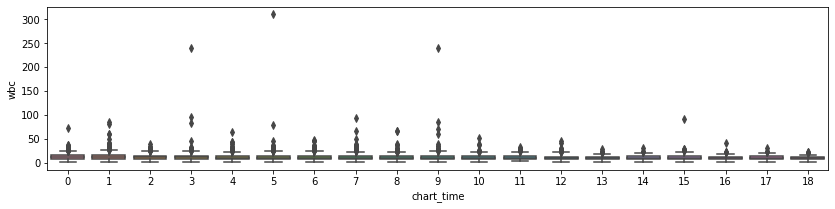

creatinekinase


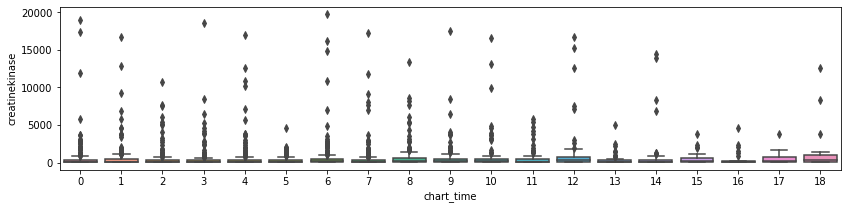

ck_mb


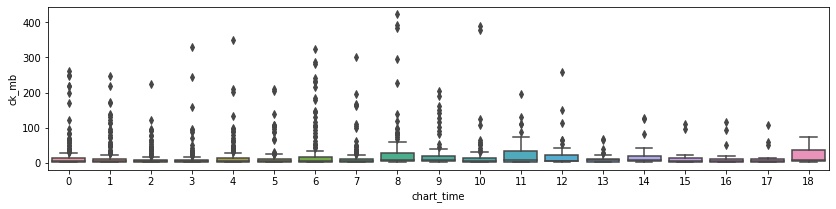

fibrinogen


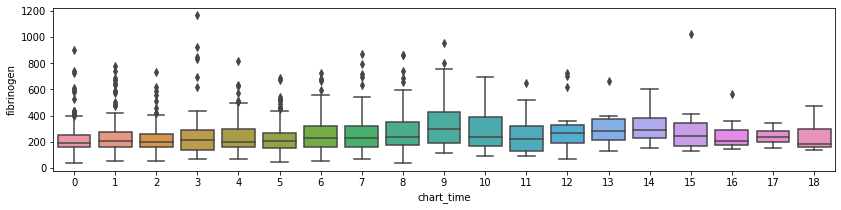

ldh


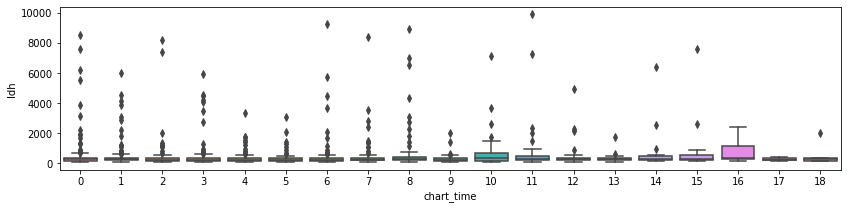

magnesium


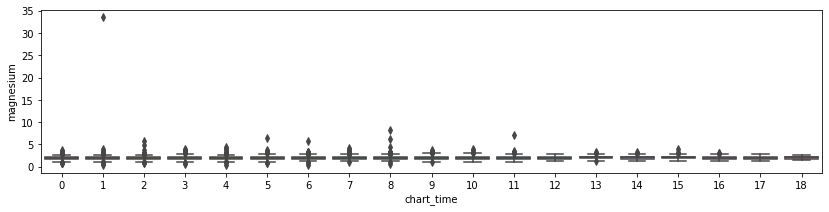

calcium_free


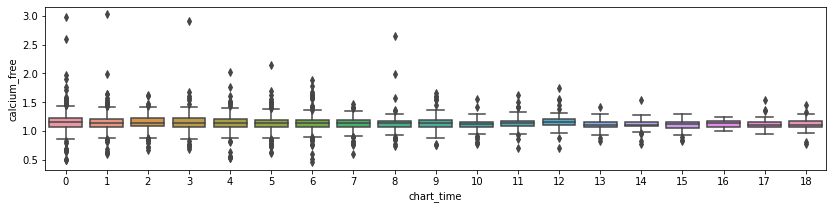

po2_bloodgas


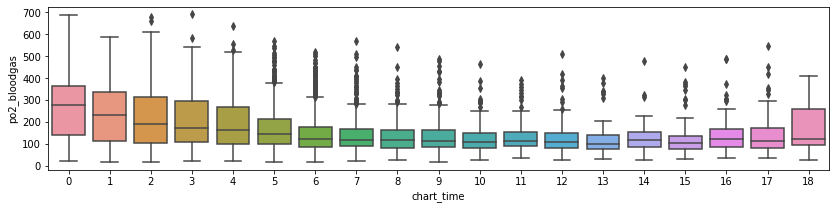

ph_bloodgas


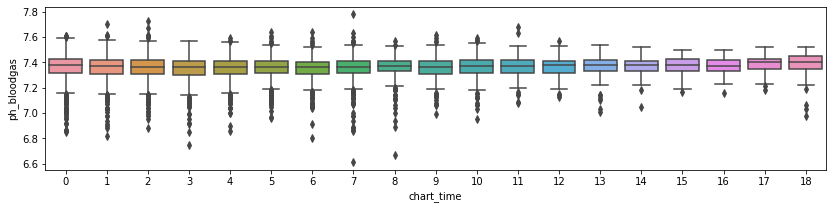

pco2_bloodgas


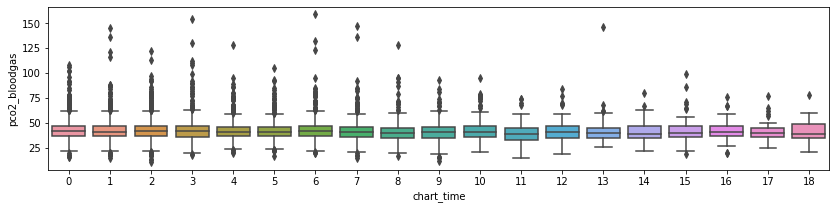

so2_bloodgas


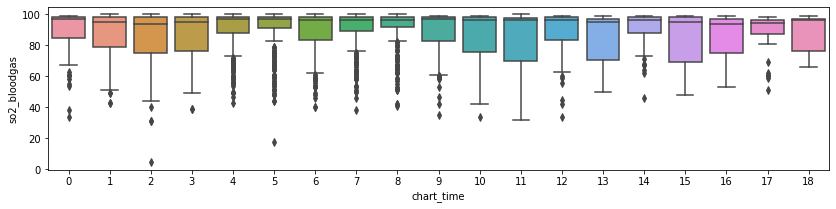

troponin_t


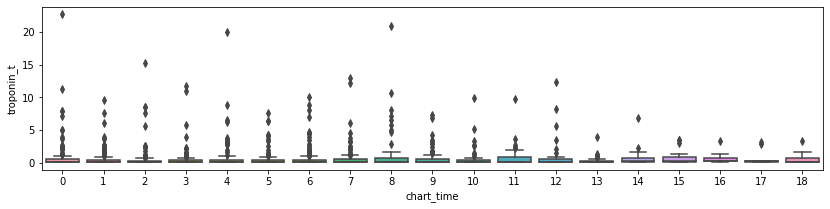

In [114]:
boxplot_features_by_hour(rounded_chart_time_filtered, all_features, '')

sysbp


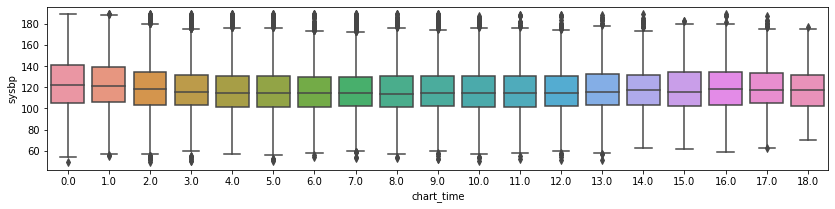

diabp


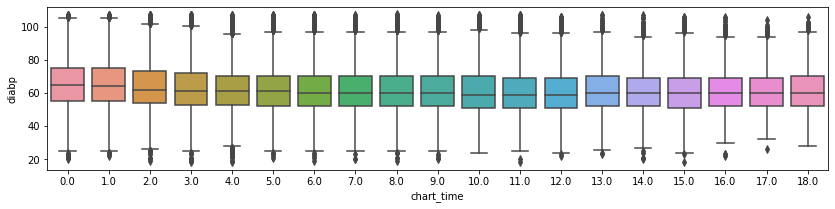

meanbp


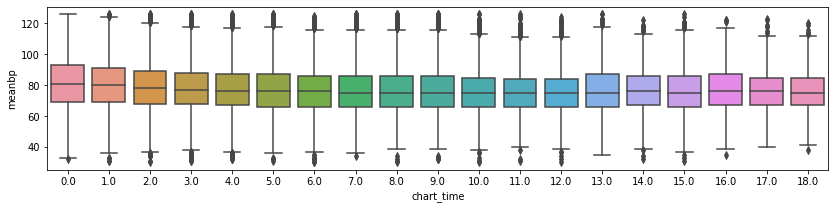

resprate


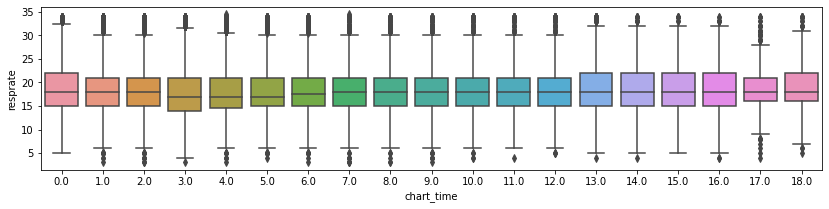

heartrate


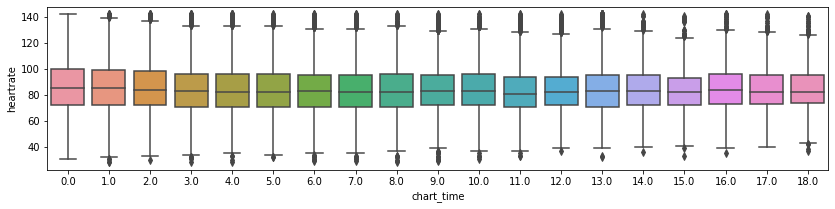

spo2_pulsoxy


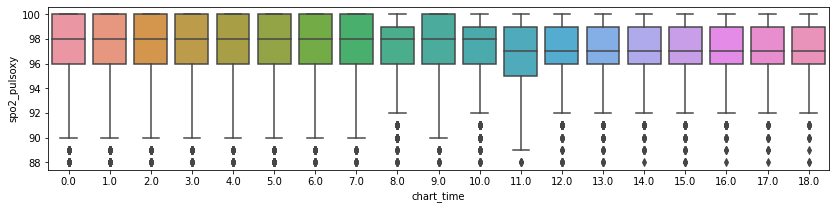

tempc


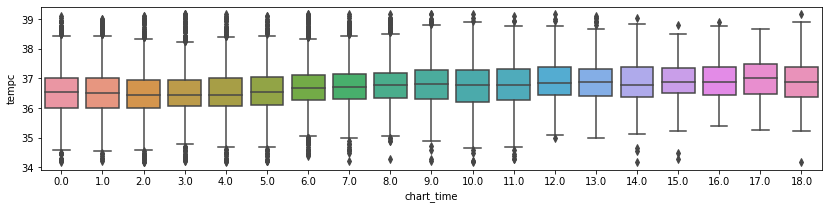

cardiacoutput


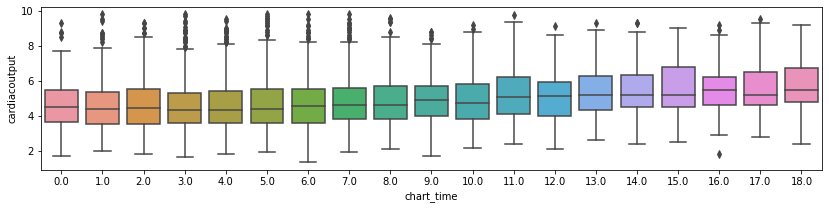

tvset


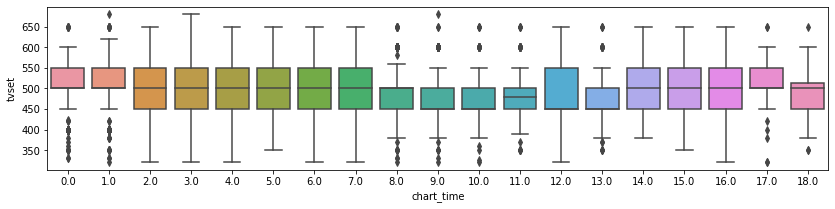

tvobserved


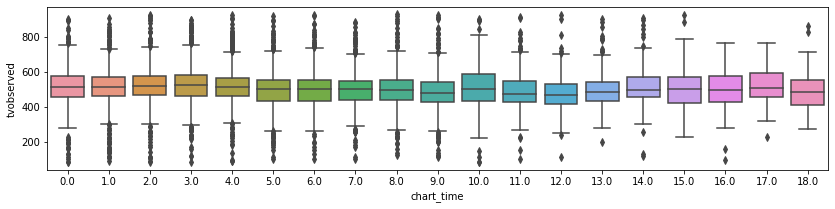

tvspontaneous


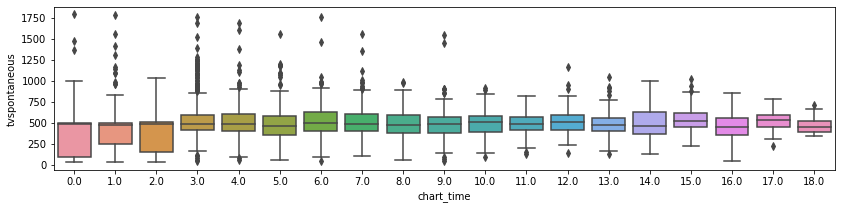

peakinsppressure


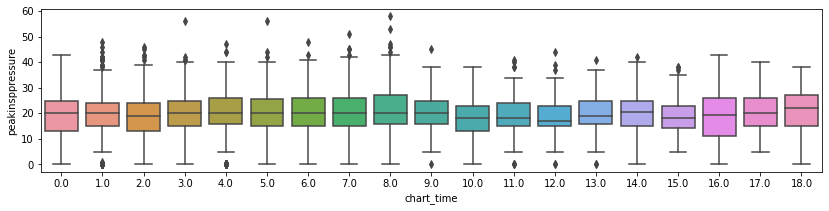

totalpeeplevel


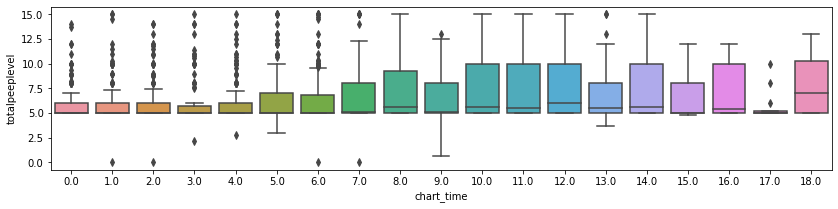

o2flow


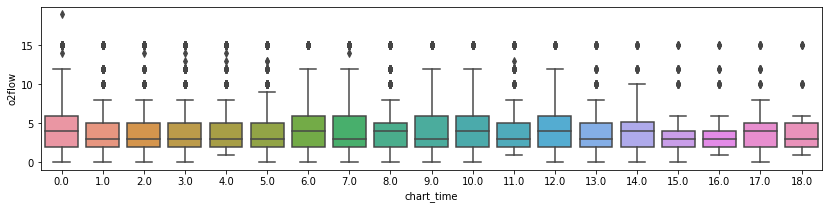

fio2


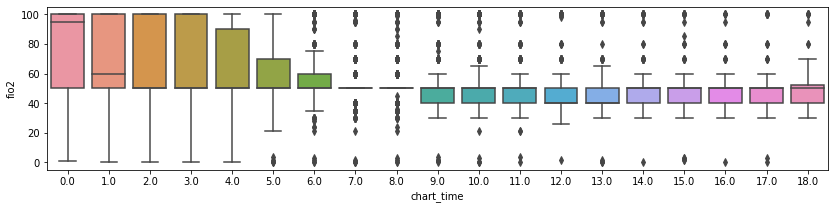

albumin


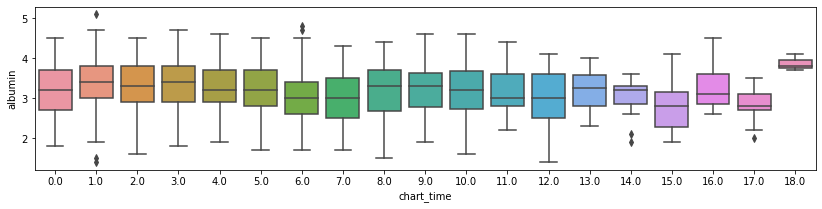

bands


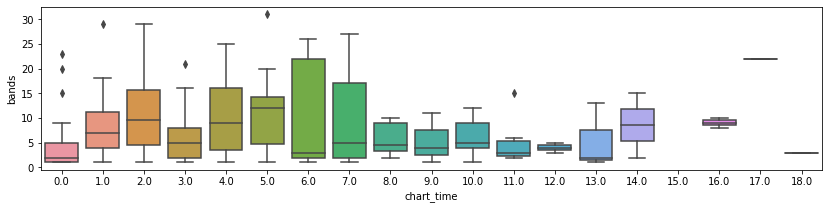

bicarbonate


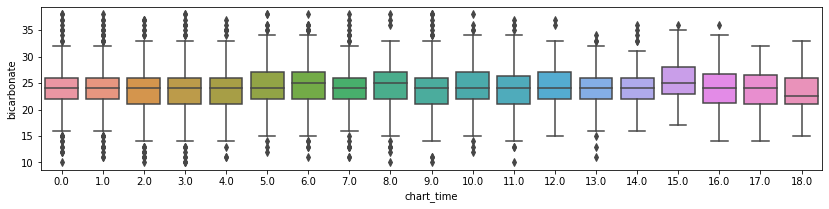

bilirubin


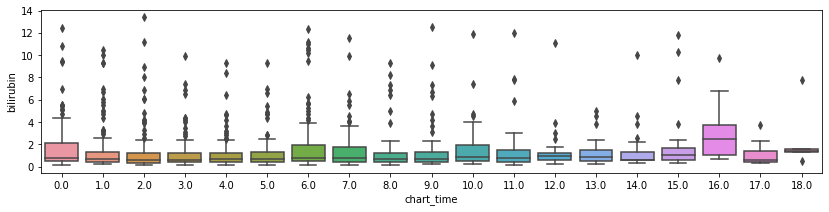

creatinine


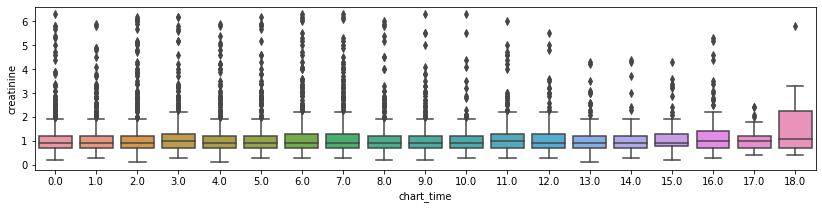

chloride


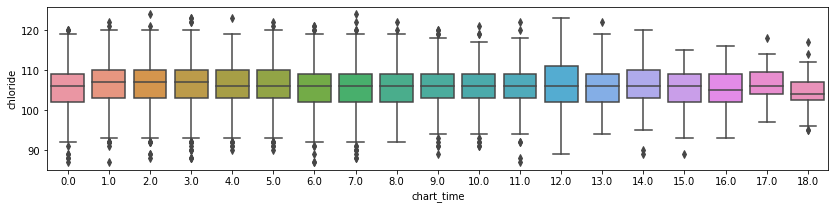

glucose


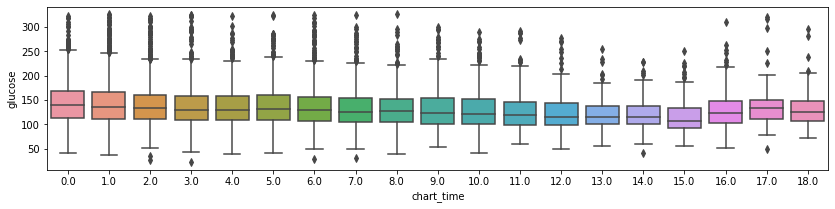

hematocrit


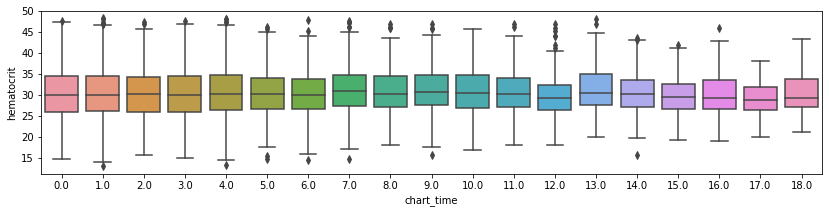

hemoglobin


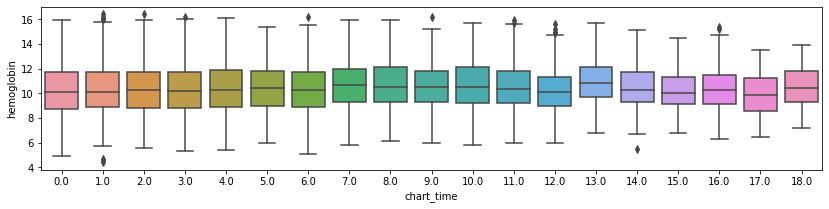

lactate


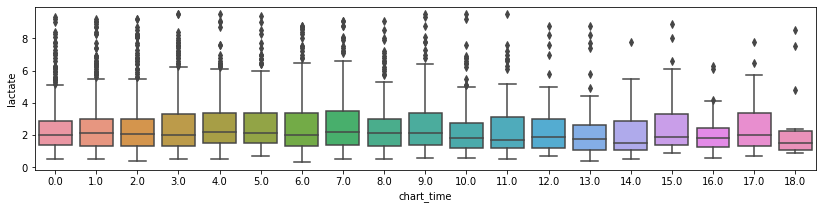

platelet


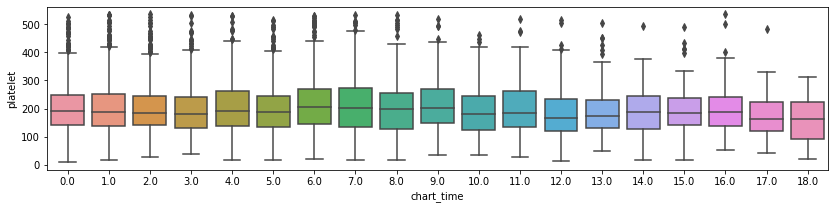

potassium


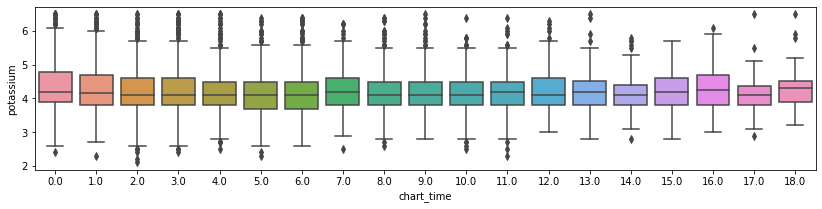

ptt


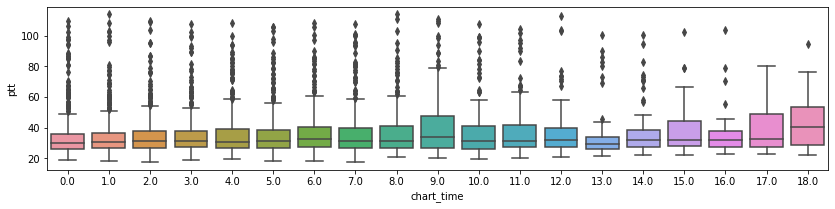

inr


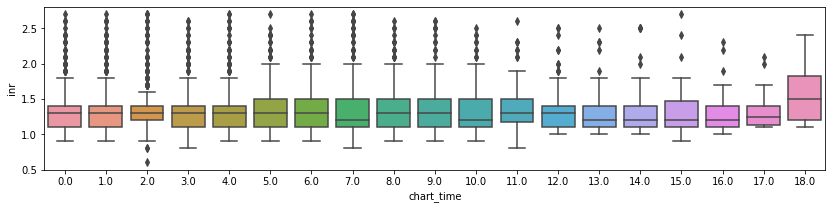

pt


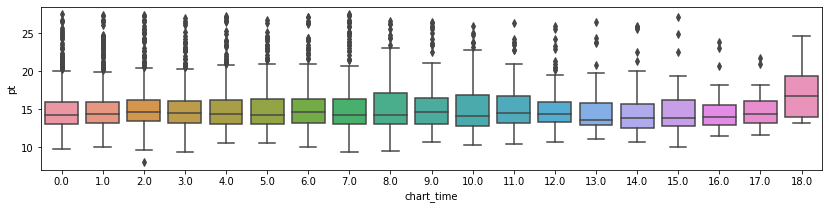

sodium


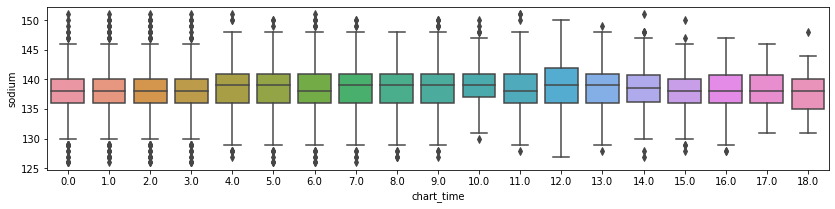

bun


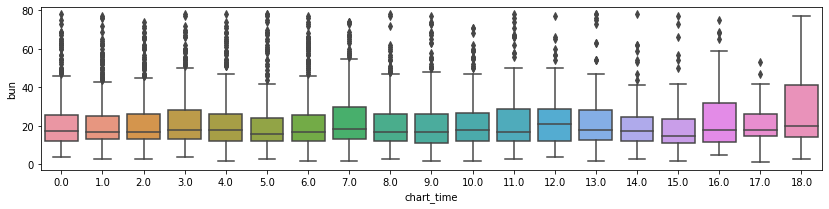

wbc


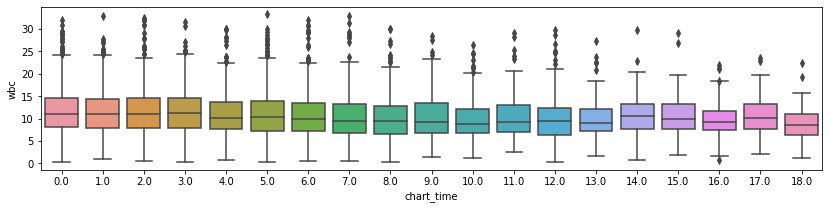

creatinekinase


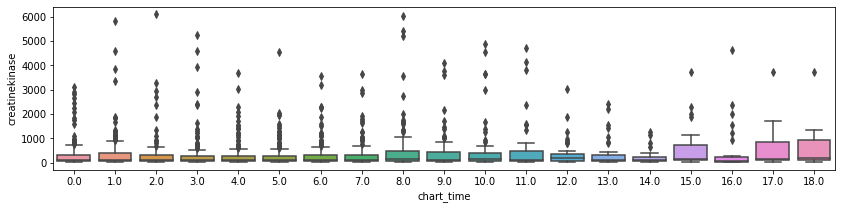

ck_mb


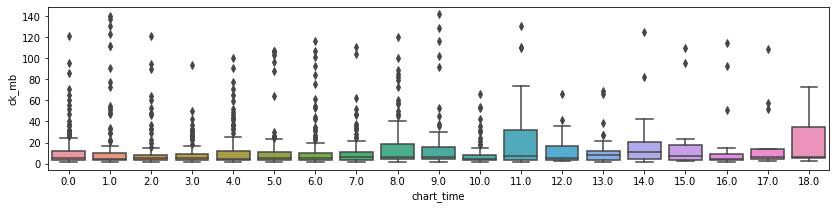

fibrinogen


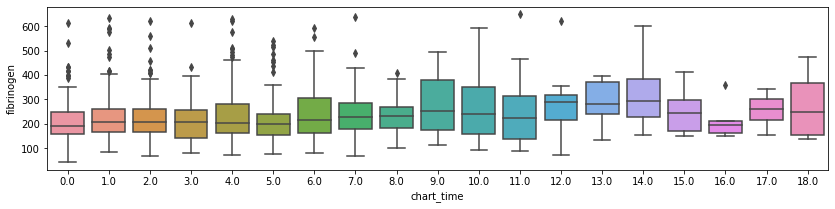

ldh


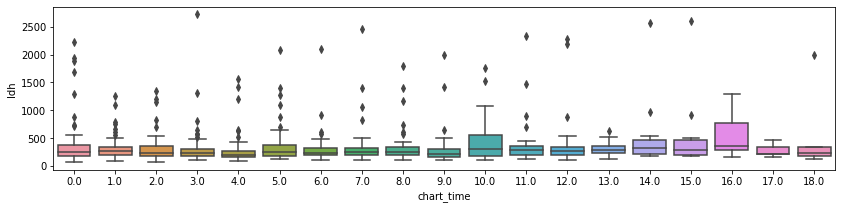

magnesium


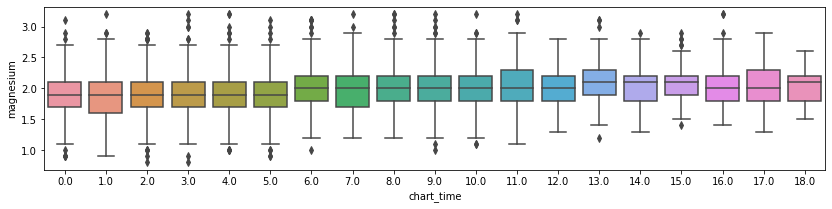

calcium_free


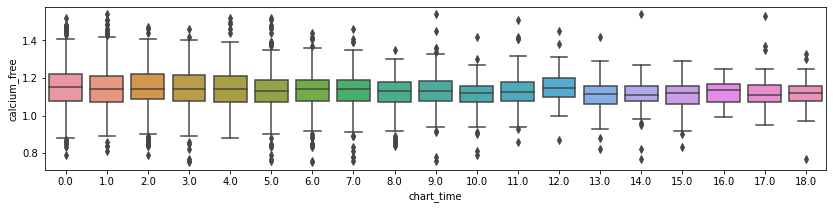

po2_bloodgas


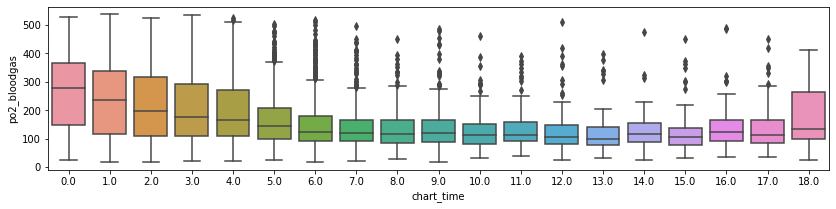

ph_bloodgas


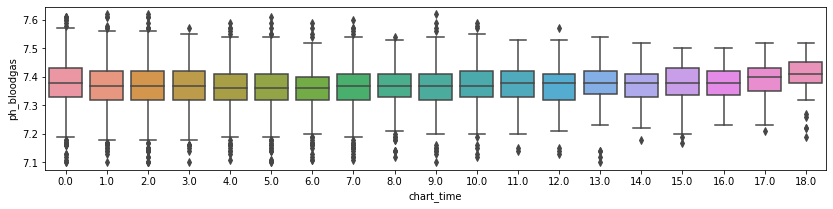

pco2_bloodgas


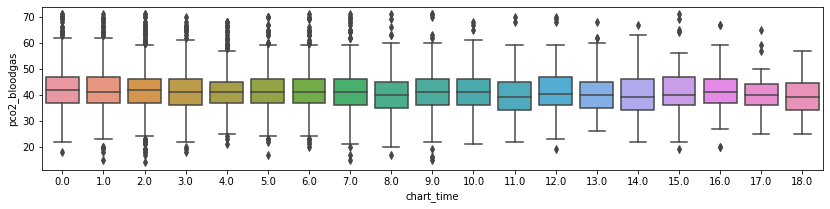

so2_bloodgas


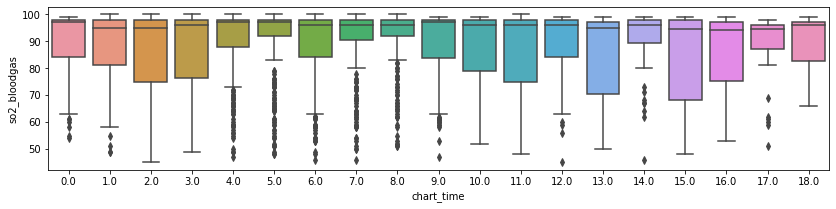

troponin_t


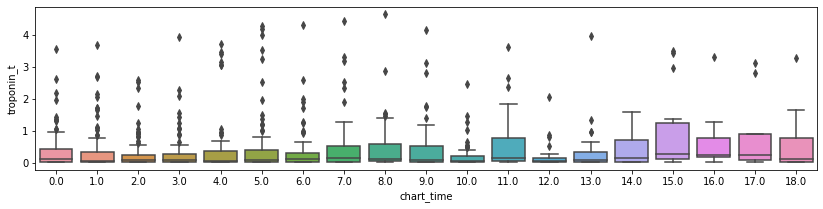

In [115]:
boxplot_features_by_hour(removed_outliers_rounded_chart_time, all_features, '')

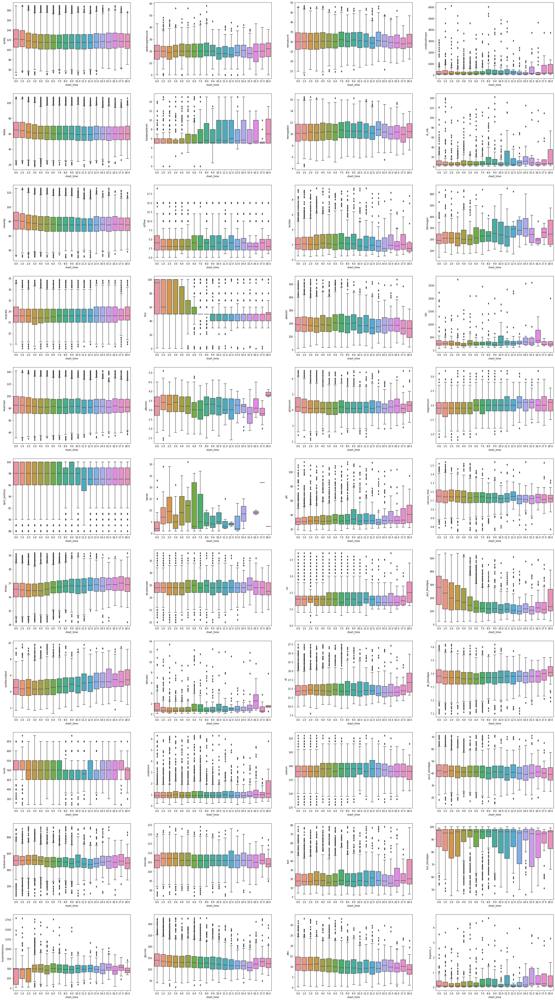

In [176]:
plot_features_boxplot_grid(removed_outliers_rounded_chart_time, all_features, show=True, save_path='../images/boxplots_series_hour.png')

## Pacientes por hora sin inflammation

In [117]:
controls_int_chart_time = controls_full_labvitals.copy()
controls_int_chart_time['chart_time'] = controls_int_chart_time['chart_time'].astype('int64')

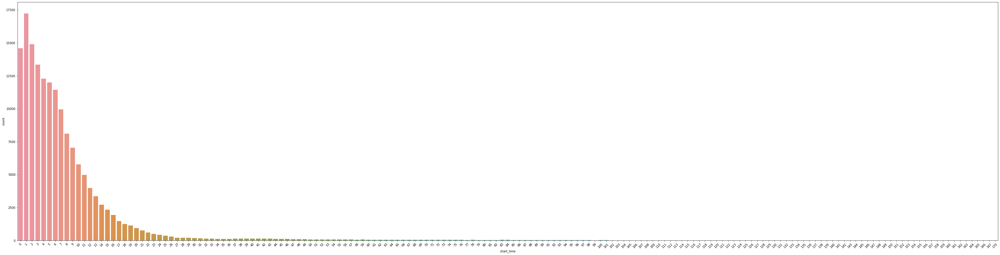

In [118]:
fig = plt.figure(figsize=(60,15))
sns.countplot(x='chart_time', data=controls_int_chart_time)
plt.xticks(rotation=45)
plt.show()

## Relación de la inflammation con distintas variables estáticas de los pacientes

Para ello debemos relacionar las distintas variables estáticas de cada paciente con las estancias en UCI que se corresponden con las series temporales que utilzará el modelo.

In [119]:
static_variables_df = pd.read_csv('../data/static_variables.csv')
static_variables_df['admittime'] = pd.to_datetime(static_variables_df['admittime'])
static_variables_df['intime'] = pd.to_datetime(static_variables_df['intime'])
static_variables_df['outtime'] = pd.to_datetime(static_variables_df['outtime'])
static_variables_df['length_of_stay'] = static_variables_df['outtime'] - static_variables_df['intime']
static_variables_df['length_of_stay'] = static_variables_df['length_of_stay']/ pd.to_timedelta(1, unit='h')

controls_static_variables_df = pd.read_csv('../data/static_variables_controls.csv')
controls_static_variables_df = controls_static_variables_df.drop(columns=['hadm_id.1', 'icustay_id.1', 'intime.1', 'outtime.1'])
controls_static_variables_df['admittime'] = pd.to_datetime(controls_static_variables_df['admittime'])
controls_static_variables_df['intime'] = pd.to_datetime(controls_static_variables_df['intime'])
controls_static_variables_df['outtime'] = pd.to_datetime(controls_static_variables_df['outtime'])

cases_static_variables_df = pd.read_csv('../data/static_variables_cases.csv')
cases_static_variables_df = cases_static_variables_df.drop(columns=['icustay_id.1', 'intime.1', 'outtime.1'])
cases_static_variables_df['admittime'] = pd.to_datetime(cases_static_variables_df['admittime'])
cases_static_variables_df['intime'] = pd.to_datetime(cases_static_variables_df['intime'])
cases_static_variables_df['outtime'] = pd.to_datetime(cases_static_variables_df['outtime'])

In [120]:
full_labvitals_static_variables = full_labvitals.merge(static_variables_df, on=['icustay_id', 'subject_id'], how='left')
controls_labvitals_static_variables = controls_full_labvitals.merge(controls_static_variables_df, on=['icustay_id', 'subject_id'], how='left')
cases_labvitals_static_variables = cases_full_labvitals.merge(cases_static_variables_df, on=['icustay_id', 'subject_id'], how='left')

In [121]:
static_variables = ['gender', 'admission_age', 'ethnicity', 'admission_type',
       'admission_location', 'first_careunit', 'hospstay_seq', 'first_hosp_stay', 
        'icustay_seq', 'first_icu_stay', 'length_of_stay']
categorical_variables = ['gender', 'ethnicity', 'admission_type',
       'admission_location', 'first_careunit', 'hospstay_seq', 'first_hosp_stay', 
        'icustay_seq', 'first_icu_stay']
non_categorical = list(set(static_variables) - set(categorical_variables))

Analizamos visualizando alguna de las variables numéricas con respecto a algunas variables estáticas del conjunto de datos.

In [126]:
variables = ['cardiacoutput', 'tvset', 'chloride', 'hematocrit', 'hemoglobin', 'ck_mb', 'fibrinogen', 'po2_bloodgas', 'troponin_t']

cardiacoutput
0.38039204088985346


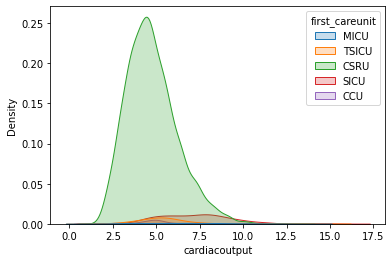

tvset
0.27008957353437074


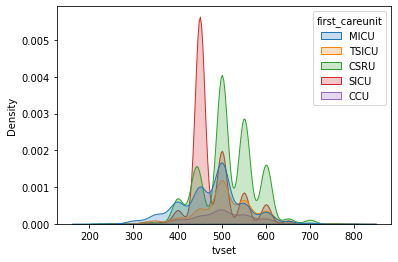

chloride
0.22763797246740217


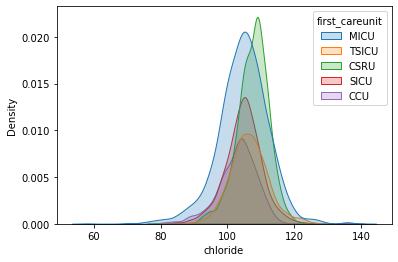

hematocrit
0.23909832610129195


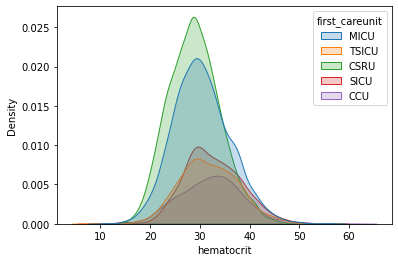

hemoglobin
0.27722175917962255


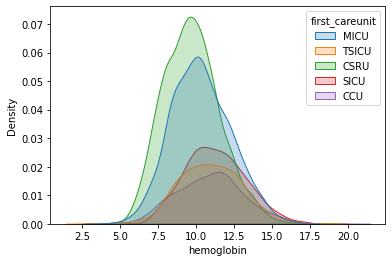

ck_mb
0.3509117150984964


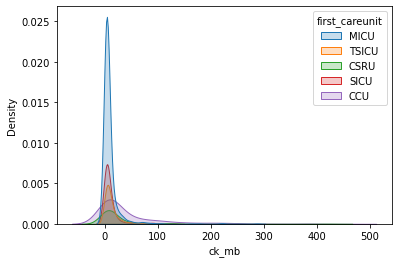

fibrinogen
0.34036116840818714


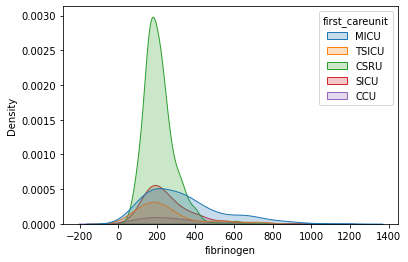

po2_bloodgas
0.36040099301120526


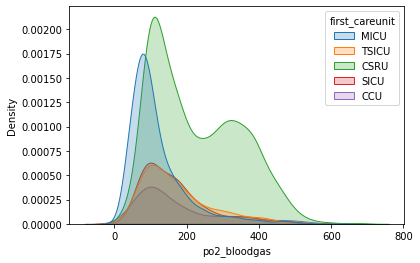

troponin_t
0.3297521647287647


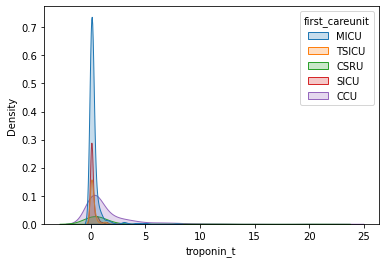

In [127]:
for var in variables_correlated_to_first_careunit:
    print(var)
    print(correlation_ratio_matrix[var]['first_careunit'])
    sns.kdeplot(data=full_labvitals_static_variables, x=var, hue='first_careunit', shade=True)
    plt.show()

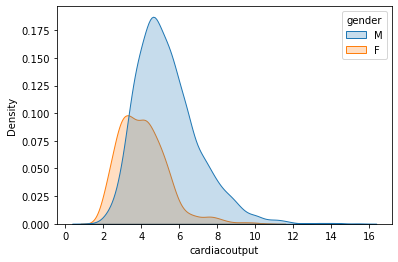

In [128]:
sns.kdeplot(data=full_labvitals_static_variables, x='cardiacoutput', hue='gender', shade=True)
plt.show()

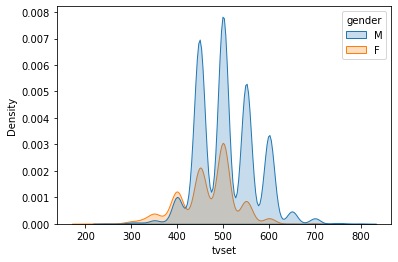

In [129]:
sns.kdeplot(data=full_labvitals_static_variables, x='tvset', hue='gender', shade=True)
plt.show()

/home/developer-rpai/.local/lib/python3.8/site-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


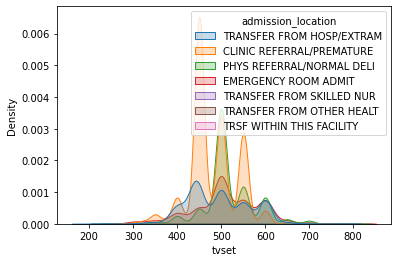

In [130]:
sns.kdeplot(data=full_labvitals_static_variables, x='tvset', hue='admission_location', shade=True)
plt.show()

In [140]:
def kdeplot_features_static_variable(df, static_feature, features):
    fig, axes = plt.subplots(len(features), 1, figsize=(10,65))
    fig.suptitle('')
    
    i=0
    for feature in features:
        sns.kdeplot(data=df, x=feature, hue=static_feature, shade=True, legend=True, ax=axes[i])
        plt.title('')
        i+=1
    plt.show()

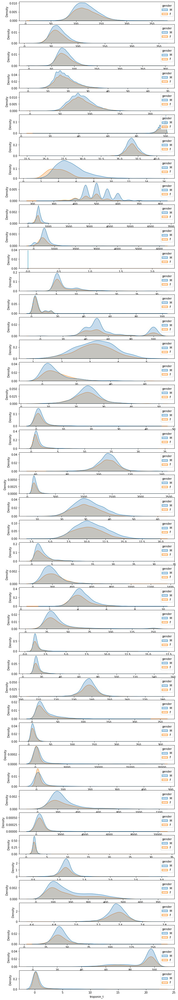

In [141]:
kdeplot_features_static_variable(full_labvitals_static_variables, 'gender', all_features)

/home/developer-rpai/.local/lib/python3.8/site-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


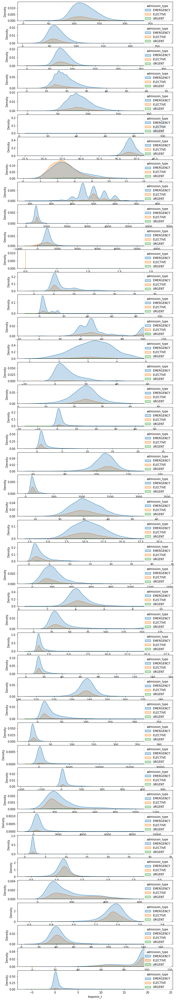

In [142]:
kdeplot_features_static_variable(full_labvitals_static_variables, 'admission_type', all_features)

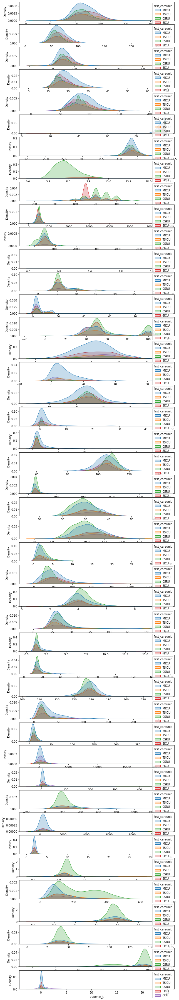

In [144]:
kdeplot_features_static_variable(full_labvitals_static_variables, 'first_careunit', all_features)

## 